#**Computer Vision Project**
**BYOL + DeepViT**

**Prepared by: Ines Kotti and Hassen Mnejja**

##**Connect to Google Drive :**

In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")
root_path = "/content/gdrive/MyDrive/Computer Vision"

Mounted at /content/gdrive


##**Libraries :**

In [ ]:
from torch import nn
import torchvision.models as models
import torch
from torchvision import transforms
import torch.nn as nn
import numpy as np
from torchvision.transforms import transforms
import torchvision


##**First part : BYOL Training**

###Class Definition:

In [ ]:
class MLPHead(nn.Module):
    def __init__(self, in_channels, mlp_hidden_size, projection_size):
        super(MLPHead, self).__init__()

        self.net = nn.Sequential(
            nn.Linear(in_channels, mlp_hidden_size),
            nn.BatchNorm1d(mlp_hidden_size),
            nn.ReLU(inplace=True),
            nn.Linear(mlp_hidden_size, projection_size)
        )

    def forward(self, x):
        return self.net(x)

In [ ]:
class ResNet18(torch.nn.Module):
    def __init__(self, *args, **kwargs):
        super(ResNet18, self).__init__()
        if kwargs['name'] == 'resnet18':
            resnet = models.resnet18(pretrained=False)
        elif kwargs['name'] == 'resnet50':
            resnet = models.resnet50(pretrained=False)

        self.encoder = torch.nn.Sequential(*list(resnet.children())[:-1])
        self.projetion = MLPHead(in_channels=resnet.fc.in_features, **kwargs['projection_head'])

    def forward(self, x):
        h = self.encoder(x)
        h = h.view(h.shape[0], h.shape[1])
        return self.projetion(h)

In [ ]:
class GaussianBlur(object):
    """blur a single image on CPU"""

    def __init__(self, kernel_size):
        radias = kernel_size // 2
        kernel_size = radias * 2 + 1
        self.blur_h = nn.Conv2d(3, 3, kernel_size=(kernel_size, 1),
                                stride=1, padding=0, bias=False, groups=3)
        self.blur_v = nn.Conv2d(3, 3, kernel_size=(1, kernel_size),
                                stride=1, padding=0, bias=False, groups=3)
        self.k = kernel_size
        self.r = radias

        self.blur = nn.Sequential(
            nn.ReflectionPad2d(radias),
            self.blur_h,
            self.blur_v
        )

        self.pil_to_tensor = transforms.ToTensor()
        self.tensor_to_pil = transforms.ToPILImage()

    def __call__(self, img):
        img = self.pil_to_tensor(img).unsqueeze(0)

        sigma = np.random.uniform(0.1, 2.0)
        x = np.arange(-self.r, self.r + 1)
        x = np.exp(-np.power(x, 2) / (2 * sigma * sigma))
        x = x / x.sum()
        x = torch.from_numpy(x).view(1, -1).repeat(3, 1)

        self.blur_h.weight.data.copy_(x.view(3, 1, self.k, 1))
        self.blur_v.weight.data.copy_(x.view(3, 1, 1, self.k))

        with torch.no_grad():
            img = self.blur(img.cuda())
            img = img.squeeze()

        img = self.tensor_to_pil(img)

        return img

In [ ]:
def get_simclr_data_transforms(input_shape, s=1):
    # get a set of data augmentation transformations as described in the SimCLR paper.
    color_jitter = transforms.ColorJitter(0.8 * s, 0.8 * s, 0.8 * s, 0.2 * s)
    data_transforms = transforms.Compose([transforms.RandomResizedCrop(size=eval(input_shape)[0]),
                                          transforms.RandomHorizontalFlip(),
                                          transforms.RandomApply([color_jitter], p=0.8),
                                          transforms.RandomGrayscale(p=0.2),
                                          GaussianBlur(kernel_size=int(0.1 * eval(input_shape)[0])),
                                          transforms.ToTensor()])
    return data_transforms

In [ ]:
class TransformsSimCLR:
    """
    A stochastic data augmentation module that transforms any given data example randomly 
    resulting in two correlated views of the same example,
    denoted x ̃i and x ̃j, which we consider as a positive pair.
    """

    def __init__(self, size):
        s = 1
        color_jitter = torchvision.transforms.ColorJitter(
            0.8 * s, 0.8 * s, 0.8 * s, 0.2 * s
        )
        self.train_transform = torchvision.transforms.Compose(
            [
                torchvision.transforms.RandomResizedCrop(size=size),
                torchvision.transforms.RandomHorizontalFlip(),  # with 0.5 probability
                torchvision.transforms.RandomApply([color_jitter], p=0.8),
                torchvision.transforms.RandomGrayscale(p=0.2),
                torchvision.transforms.ToTensor(),
            ]
        )

        self.test_transform = torchvision.transforms.Compose(
            [
                torchvision.transforms.Resize(size=size),
                torchvision.transforms.ToTensor(),
            ]
        )

    def __call__(self, x):
        return self.train_transform(x), self.train_transform(x)

###Importing Librairies:

In [ ]:
import time
import os
import argparse
import torch
from torchvision.datasets import STL10
from torch.utils.tensorboard import SummaryWriter
from torchvision import models, datasets
import numpy as np
from torchvision.models import resnet50
from torchvision.models import wide_resnet101_2
from PIL import ImageFilter, ImageOps
import torchvision.transforms as transforms
from collections import defaultdict
from torchvision import models
import torch.distributed as dist
import torch.multiprocessing as mp
from torch.nn.parallel import DistributedDataParallel as DDP
import yaml
from torch.utils.data import Dataset
import pandas as pd
from PIL import Image
from torch.utils.data.dataloader import default_collate
from torch.utils.data.dataloader import DataLoader
import copy
import random
from functools import wraps
import torch
from torch import nn
import torch.nn.functional as F

###Code :

In [ ]:
def default(val, def_val):
    return def_val if val is None else val

def flatten(t):
    return t.reshape(t.shape[0], -1)

def singleton(cache_key):
    def inner_fn(fn):
        @wraps(fn)
        def wrapper(self, *args, **kwargs):
            instance = getattr(self, cache_key)
            if instance is not None:
                return instance

            instance = fn(self, *args, **kwargs)
            setattr(self, cache_key, instance)
            return instance

        return wrapper

    return inner_fn

### **Loss Function**

In [ ]:
class GaussianBlur(object):
    """Gaussian Blur version 2"""

    def __call__(self, x):
        sigma = np.random.uniform(0.1, 2.0)
        x = x.filter(ImageFilter.GaussianBlur(radius=sigma))
        return x

def loss_fn(x, y):
    x = F.normalize(x, dim=-1, p=2)
    y = F.normalize(y, dim=-1, p=2)
    return 2 - 2 * (x * y).sum(dim=-1)

### **Augmentation Utils**

In [ ]:
class RandomApply(nn.Module):
    def __init__(self, fn, p):
        super().__init__()
        self.fn = fn
        self.p = p

    def forward(self, x):
        if random.random() > self.p:
            return x
        return self.fn(x)

### Exponential texte en gras Moving Average

In [ ]:
class EMA():
    def __init__(self, beta):
        super().__init__()
        self.beta = beta

    def update_average(self, old, new):
        if old is None:
            return new
        return old * self.beta + (1 - self.beta) * new


def update_moving_average(ema_updater, ma_model, current_model):
    for current_params, ma_params in zip(
        current_model.parameters(), ma_model.parameters()
    ):
        old_weight, up_weight = ma_params.data, current_params.data
        ma_params.data = ema_updater.update_average(old_weight, up_weight)

**MLP class for projector and predictor**

In [ ]:
class MLP(nn.Module):
    def __init__(self, dim, projection_size, hidden_size=4096):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, hidden_size),
            nn.BatchNorm1d(hidden_size),
            nn.LeakyReLU(inplace=True),
            nn.Linear(hidden_size, projection_size),
            
            
        )

    def forward(self, x):
        return self.net(x)

**A wrapper class for the base neural network will manage the interception of the hidden layer output and pipe it into the projecter and predictor nets**

In [ ]:
class NetWrapper(nn.Module):
    def __init__(self, net, projection_size, projection_hidden_size, layer=-2):
        super().__init__()
        self.net = net
        self.layer = layer

        self.projector = None
        self.projection_size = projection_size
        self.projection_hidden_size = projection_hidden_size

        self.hidden = None
        self.hook_registered = False

    def _find_layer(self):
        if type(self.layer) == str:
            modules = dict([*self.net.named_modules()])
            return modules.get(self.layer, None)
        elif type(self.layer) == int:
            children = [*self.net.children()]
            return children[self.layer]
        return None

    def _hook(self, _, __, output):
        self.hidden = flatten(output)

    def _register_hook(self):
        layer = self._find_layer()
        assert layer is not None, f"hidden layer ({self.layer}) not found"
        handle = layer.register_forward_hook(self._hook)
        self.hook_registered = True

    @singleton("projector")
    def _get_projector(self, hidden):
        _, dim = hidden.shape
        projector = MLP(dim, self.projection_size, self.projection_hidden_size)
        return projector.to(hidden)

    def get_representation(self, x):
        if not self.hook_registered:
            self._register_hook()

        if self.layer == -1:
            return self.net(x)

        _ = self.net(x)
        hidden = self.hidden
        self.hidden = None
        assert hidden is not None, f"hidden layer {self.layer} never emitted an output"
        return hidden

    def forward(self, x):
        representation = self.get_representation(x)
        projector = self._get_projector(representation)
        projection = projector(representation)
        return projection

### **Main Class**

In [ ]:
class BYOL(nn.Module):
    def __init__(
        self,
        net,
        image_size,
        hidden_layer=-2,
        projection_size=256,
        projection_hidden_size=4096,
        augment_fn=None,
        moving_average_decay=0.99,
    ):
        super().__init__()

        self.online_encoder = NetWrapper(
            net, projection_size, projection_hidden_size, layer=hidden_layer
        )
        self.target_encoder = None
        self.target_ema_updater = EMA(moving_average_decay)

        self.online_predictor = MLP(
            projection_size, projection_size, projection_hidden_size
        )

        # send a mock image tensor to instantiate singleton parameters
        self.forward(torch.randn(2, 3, image_size, image_size), torch.randn(2, 3, image_size, image_size))

    @singleton("target_encoder")
    def _get_target_encoder(self):
        target_encoder = copy.deepcopy(self.online_encoder)
        return target_encoder

    def reset_moving_average(self):
        del self.target_encoder
        self.target_encoder = None

    def update_moving_average(self):
        assert (
            self.target_encoder is not None
        ), "target encoder has not been created yet"
        update_moving_average(
            self.target_ema_updater, self.target_encoder, self.online_encoder
        )

    def forward(self, image_one, image_two):
        online_proj_one = self.online_encoder(image_one)
        online_proj_two = self.online_encoder(image_two)

        online_pred_one = self.online_predictor(online_proj_one)
        online_pred_two = self.online_predictor(online_proj_two)

        with torch.no_grad():
            target_encoder = self._get_target_encoder()
            target_proj_one = target_encoder(image_one)
            target_proj_two = target_encoder(image_two)

        loss_one = loss_fn(online_pred_one, target_proj_two.detach())
        loss_two = loss_fn(online_pred_two, target_proj_one.detach())

        loss = loss_one + loss_two
        return loss.mean()

In [ ]:
def get_model(params,pretrained=False):
    if params.network=='resnet50':
        #model = models.resnet50(pretrained=pretrained)
        model = models.resnet50(pretrained=pretrained)
        #model = models.wide_resnet101_2(pretrained=pretrained)

        #model.fc = nn.Linear(in_features=model.fc.in_features,out_features=5,bias=True)
        return model

**Flowers Dataset Class loader**

In [ ]:
class FlowersDataset(Dataset):
    """ Flowers Dataset Class loader """
    
    def __init__(self,cfg, annotation_file,data_type='train', \
                 transform=None):
        
        """
        Args:
            image_dir (string):  directory with images
            annotation_file (string):  csv/txt file which has the 
                                        dataset labels
            transforms: The trasforms to apply to images
        """
        
        self.data_path = os.path.join(cfg.root_path,cfg.data_path,cfg.imgs_dir)
        self.label_path = os.path.join(cfg.root_path,cfg.data_path,cfg.labels_dir,annotation_file)
        self.transform=transform
        self.pretext = cfg.pretext
        if self.pretext == 'rotation':
            self.num_rot = cfg.num_rot
        self._load_data()

    def _load_data(self):
        '''
        function to load the data in the format of [[img_name_1,label_1],
        [img_name_2,label_2],.....[img_name_n,label_n]]
        '''
        self.labels = pd.read_csv(self.label_path)
        
        self.loaded_data = []
        for i in range(self.labels.shape[0]):
            img_name = self.labels['Filename'][i]
            img_name = self.data_path + img_name
            img = Image.open(img_name)
            img = img.convert('RGB')
            self.loaded_data.append((img,img_name))
            img.load()#This closes the image object or else you will get too many open file error

    def __len__(self):
        return len(self.loaded_data)

    def __getitem__(self, idx):

        idx = idx % len(self.loaded_data)
        img,img_name = self.loaded_data[idx]  
        img = self._read_data(img)
        
        return img

    def _read_data(self,img):
        
            # supervised mode; if in supervised mode define a loader function 
            #that given the index of an image it returns the image and its 
            #categorical label
        img = self.transform(img)
        return img

**Training code**

In [ ]:
class dotdict(dict):
    __getattr__ = dict.get
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

def load_yaml(config_file,config_type='dict'):
    with open(config_file) as f:
        cfg = yaml.safe_load(f)
    
    if config_type=='object':
        cfg = dotdict(cfg)
    return cfg

In [ ]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
torch.manual_seed(0)

config_path = root_path+'/config/config_linear.yaml'
cfg = load_yaml(config_path,config_type='object') 
config = yaml.load(open(root_path+"/config/config.yaml", "r"))

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

print(f"Training with: {device}")

transform=TransformsSimCLR(size=96)

annotation_file = 'unlabeled.csv'                                 

train_dataset = FlowersDataset(cfg,annotation_file, data_type='train',transform=transform)
print('train data load success')

train_loader = DataLoader(train_dataset,batch_size=cfg.batch_size, drop_last=True,num_workers=0)

resnet = get_model(cfg)

print('model loaded')
model = BYOL(resnet, image_size=96, hidden_layer="avgpool")
model = model.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)#3e-4)

# solver
global_step = 0
for epoch in range(100):
    start_time = time.time()
    print("epoch number "+ str(epoch))
    metrics = defaultdict(list)
    for step, ((x_i, x_j)) in enumerate(train_loader):        
        x_i = x_i.to(device)
        x_j = x_j.to(device)

        loss = model(x_i, x_j)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        model.update_moving_average()  # update moving average of target encoder

        if step % 50 == 0:
            print(f"Step [{step}/{len(train_loader)}]:\tLoss: {loss.item()}")

        metrics["Loss/train"].append(loss.item())
        global_step += 1
    print(f"epoch {epoch} finished after {time.time() - start_time} seconds")

    if epoch % 10 == 0:
        print(f"Saving model at epoch {epoch}")
        torch.save(resnet.state_dict(), root_path+f"/experiments/Byol/res50_cct{epoch}.pth")

# save your improved network
torch.save(resnet.state_dict(), root_path+"/experiments/Byol/res50_cct.pth")

Training with: cuda:0
train data load success
model loaded
epoch number 0
Step [0/312]:	Loss: 4.007517337799072
Step [50/312]:	Loss: 1.6769473552703857
Step [100/312]:	Loss: 1.688306450843811
Step [150/312]:	Loss: 1.8209782838821411
Step [200/312]:	Loss: 1.4603323936462402
Step [250/312]:	Loss: 1.3764982223510742
Step [300/312]:	Loss: 1.362667441368103
epoch 0 finished after 136.1758246421814 seconds
Saving model at epoch 0
epoch number 1
Step [0/312]:	Loss: 1.9019157886505127
Step [50/312]:	Loss: 1.5852982997894287
Step [100/312]:	Loss: 1.1919825077056885
Step [150/312]:	Loss: 1.1781929731369019
Step [200/312]:	Loss: 1.0662822723388672
Step [250/312]:	Loss: 1.1909809112548828
Step [300/312]:	Loss: 1.0156162977218628
epoch 1 finished after 136.55993366241455 seconds
epoch number 2
Step [0/312]:	Loss: 1.5435514450073242
Step [50/312]:	Loss: 1.3158811330795288
Step [100/312]:	Loss: 1.3839408159255981
Step [150/312]:	Loss: 1.0834650993347168
Step [200/312]:	Loss: 1.3271538019180298
Step [

##**Second part : Deep ViT Training**

###Importing Librairies

In [ ]:
!pip install timm

     |████████████████████████████████| 431 kB 4.1 MB/s 


In [ ]:
!pip install einops

In [ ]:
from ctypes import cdll
cdll.LoadLibrary("libstdc++.so.6") 
import torch
from torch import nn
from torch import functional as F
from torch import optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from tqdm import tqdm
import math
import matplotlib.pyplot as plt
import torch.nn as nn
from torchvision.models import resnet34
from torchvision.models import resnet18
from torchvision.models import resnet50
import os
import pickle
import yaml
import numpy as np
from PIL import Image
import pandas as pd
from torch.utils.data import Dataset
from PIL import ImageFilter, ImageOps
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data.dataloader import default_collate
collate_func=default_collate
from torch.utils.tensorboard import SummaryWriter
from sklearn import preprocessing

from torch import nn, einsum
import torch.nn.functional as F

from einops import rearrange, repeat
from einops.layers.torch import Rearrange

**Data class**

In [ ]:
  from sklearn import preprocessing
  L=['airplane',
   'bird',
   'car',
   'cat',
   'gazelle',
   'boat',
  'dog',
   'horse',
   'monkey',
  'truck']
  le=preprocessing.LabelEncoder()
  targets=le.fit_transform(L)

### Test GPU

In [ ]:
if torch.cuda.is_available():    
    device = torch.device("cuda")
    print('GPU: ', torch.cuda.get_device_name(0))

else:
    device = torch.device("cpu")
    print('No GPU available')

No GPU available


In [ ]:
class Residual(nn.Module):
    def __init__(self, fn):
        super().__init__()
        self.fn = fn
    def forward(self, x, **kwargs):
        return self.fn(x, **kwargs) + x

In [ ]:
class PreNorm(nn.Module):
    def __init__(self, dim, fn):
        super().__init__()
        self.norm = nn.LayerNorm(dim)
        self.fn = fn
    def forward(self, x, **kwargs):
        return self.fn(self.norm(x), **kwargs)

In [ ]:
class FeedForward(nn.Module):
    def __init__(self, dim, hidden_dim, dropout = 0.):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(dim, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, dim),
            nn.Dropout(dropout)
        )
    def forward(self, x):
        return self.net(x)

In [ ]:
class Attention(nn.Module):
    def __init__(self, dim, heads = 8, dim_head = 64, dropout = 0.):
        super().__init__()
        inner_dim = dim_head *  heads
        self.heads = heads
        self.scale = dim_head ** -0.5

        self.to_qkv = nn.Linear(dim, inner_dim * 3, bias = False)

        self.reattn_weights = nn.Parameter(torch.randn(heads, heads))

        self.reattn_norm = nn.Sequential(
            Rearrange('b h i j -> b i j h'),
            nn.LayerNorm(heads),
            Rearrange('b i j h -> b h i j')
        )

        self.to_out = nn.Sequential(
            nn.Linear(inner_dim, dim),
            nn.Dropout(dropout)
        )

    def forward(self, x):
        b, n, _, h = *x.shape, self.heads
        qkv = self.to_qkv(x).chunk(3, dim = -1)
        q, k, v = map(lambda t: rearrange(t, 'b n (h d) -> b h n d', h = h), qkv)

        # attention

        dots = einsum('b h i d, b h j d -> b h i j', q, k) * self.scale
        attn = dots.softmax(dim=-1)

        # re-attention

        attn = einsum('b h i j, h g -> b g i j', attn, self.reattn_weights)
        attn = self.reattn_norm(attn)

        # aggregate and out

        out = einsum('b h i j, b h j d -> b h i d', attn, v)
        out = rearrange(out, 'b h n d -> b n (h d)')
        out =  self.to_out(out)
        return out

In [ ]:
class Transformer(nn.Module):
    def __init__(self, dim, depth, heads, dim_head, mlp_dim, dropout = 0.):
        super().__init__()
        self.layers = nn.ModuleList([])
        for _ in range(depth):
            self.layers.append(nn.ModuleList([
                Residual(PreNorm(dim, Attention(dim, heads = heads, dim_head = dim_head, dropout = dropout))),
                Residual(PreNorm(dim, FeedForward(dim, mlp_dim, dropout = dropout)))
            ]))
    def forward(self, x):
        for attn, ff in self.layers:
            x = attn(x)
            x = ff(x)
        return x

### Deep ViT

In [ ]:
class DeepViT(nn.Module):
    def __init__(self, image_size, patch_size, num_classes, dim, depth, heads, mlp_dim, pool = 'cls', channels = 512, dim_head = 64, dropout = 0., emb_dropout = 0.):
        super().__init__()
        self.name='DeepViT'
        assert image_size % patch_size == 0, 'Image dimensions must be divisible by the patch size.'
        num_patches = (image_size // patch_size) ** 2
        patch_dim = channels * patch_size ** 2
        assert pool in {'cls', 'mean'}, 'pool type must be either cls (cls token) or mean (mean pooling)'

        self.to_patch_embedding = nn.Sequential(
            Rearrange('b c (h p1) (w p2) -> b (h w) (p1 p2 c)', p1 = patch_size, p2 = patch_size),
            nn.Linear(patch_dim, dim),
        )

        self.pos_embedding = nn.Parameter(torch.randn(1, num_patches + 1, dim))
        self.cls_token = nn.Parameter(torch.randn(1, 1, dim))
        self.dropout = nn.Dropout(emb_dropout)

        self.transformer = Transformer(dim, depth, heads, dim_head, mlp_dim, dropout)

        self.pool = pool
        self.to_latent = nn.Identity()

        self.mlp_head = nn.Sequential(
            nn.LayerNorm(dim),
            nn.Linear(dim, num_classes)
        )

    def forward(self, img):
        x = self.to_patch_embedding(img)
        b, n, _ = x.shape
        
        cls_tokens = repeat(self.cls_token, '() n d -> b n d', b = b)
        x = torch.cat((cls_tokens, x), dim=1)
        x += self.pos_embedding[:, :(n + 1)]
        x = self.dropout(x)
        x = self.transformer(x)
        x = x.mean(dim = 1) if self.pool == 'mean' else x[:, 0]
        x = self.to_latent(x)
        return self.mlp_head(x)

### Training

In [ ]:
def get_model():
    
    model = resnet50(pretrained=False)
    
    model.fc = nn.Linear(in_features=model.fc.in_features,out_features=1000,bias=True)
    return model

In [ ]:
class ResNetFeatures(nn.Module):
  '''
    ResNetFeatures outputs the lower level features from pretrained ResNet50 till the intial 5 layers 
    (conv1, bn1, relu, maxpool, layer1(3 conv layers)) to be used in the hybrid architecture to be 
    able to kickstart the learining faster. The sequence of operations is as follows :-

    Input -> conv1 -> bn1 -> relu -> maxpool -> layer1 -> Output

    Args:
        No arguments required
    
    Methods:
        forward(inp) :-
        Applies the sequence of operations mentioned above.
        (batch_size, 3, 224, 224) -> (batch_size, 64, 56, 56)
    
    Examples:
        >>> resnet_features = ResNetFeatures()
        >>> out = resnet_features(inp)
    '''
    
  def __init__(self):
          super(ResNetFeatures, self).__init__()
          encoder = get_model()
          Pkl_Filename = "/content/gdrive/MyDrive/Computer Vision/experiments/Byol/res50_cct80.pth"  
          

          encoder.load_state_dict(torch.load(Pkl_Filename, map_location=device))

          encoder.to(device)
          
          self.feature_extractor = torch.nn.Sequential(*list(encoder.children())[:6]) 
        
  def forward(self, inp):
        # inp: (batch_size, 3, 224, 224)
       
        out = self.feature_extractor(inp)
        print('BYOL output',out.size())
        # out: (batch_size, 64, 56, 56)
        return out

In [ ]:
class ResidualBlockSmall(nn.Module):
    '''
    ResidualBlockSmall implements the smaller block of the Residual Networks. It optionally also downsamples
    the input according to the stride to match the output while adding the residual. The sequence of operations
    is as follows :-

    Input -> Conv1 -> BNorm1 -> ReLU -> Conv2 -> BNorm2 -> ReLU -> Output
      |                                                              |
      |-----------------Residual_Downsample (Optional)---------------|

    Args:
        input_channels: Number of input channels
        out_channels: Number of output channels
        residual_downsample: Residual Downsample dependent on if either height, width or channels change
        stride: Stride value for the convolutional layers (Default=1)

    Methods:
        forward(inp) :-
        Applies the sequence of operations mentioned above.
        (batch_size, input_channels, height, width) -> (batch_size, out_channels, height, width)
    
    Examples:
        >>> RBS = ResidualBlockSmall(input_channels, out_channels, residual_downsample, stride)
        >>> out = RBS(inp)
    '''
    def __init__(self, input_channels, out_channels, residual_downsample=None, stride=1):
        super(ResidualBlockSmall, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, out_channels, kernel_size=3, stride=stride, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_channels)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.bnorm2 = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        self.residual_downsample = residual_downsample
    
    def forward(self, inp):
        # inp: (batch_size, input_channels, height, width)

        res = inp
        out = self.activation(self.bnorm1(self.conv1(inp)))
        out = self.activation(self.bnorm2(self.conv2(out)))
        
        if self.residual_downsample is not None:
            res = self.residual_downsample(res)

        out = self.activation(out + res)

        # out: (batch_size, out_channels, height, width) | height, width depending on stride
        return out

### Load Data

In [ ]:
class Dataset(Dataset):
    
    
    def __init__(self,cfg, annotation_file,data_type='train', \
                 transform=None):
        
        """
        Args:
            image_dir (string):  directory with images
            annotation_file (string):  csv/txt file which has the 
                                        dataset labels
            transforms: The trasforms to apply to images
        """
        
        self.data_path = os.path.join(cfg.data_path,cfg.imgs_dir)
        self.label_path = os.path.join(cfg.data_path,cfg.labels_dir,annotation_file)
        self.transform=transform
        self.pretext = cfg.pretext
        if self.pretext == 'rotation':
            self.num_rot = cfg.num_rot
        self._load_data()

    def _load_data(self):
        '''
        function to load the data in the format of [[img_name_1,label_1],
        [img_name_2,label_2],.....[img_name_n,label_n]]
        '''
        self.labels = pd.read_csv(self.label_path)
        
        self.loaded_data = []
        j=0
        for i in range(self.labels.shape[0]):
            if j<500: 
              l=1
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
              
            elif j<1000: 
              l=10
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<1500: 
              l=2
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<2000: 
              l=3
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<2500: 
              l=4
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<3000: 
              l=5
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<3500: 
              l=6
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<4000: 
              l=7
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            elif j<4500: 
              l=8
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            else: 
              l=9
              img_name = self.labels['Filename'][i]
              img = Image.open('/content/gdrive/MyDrive/Computer Vision/dataset/images'+img_name)
              img = img.convert('RGB')
              label = self.labels['Label'][i]
              self.loaded_data.append((img,label,img_name))
              img.load()
            j+=1
            #This closes the image object or else you will get too many open file error
            #self.read_data.append((img,label))

    def __len__(self):
        return len(self.loaded_data)

    def __getitem__(self, idx):

        idx = idx % len(self.loaded_data)
        img,label,img_name = self.loaded_data[idx]
        img,label = self._read_data(img,label)
        
        return img,label

    def _read_data(self,img,label):
        
        
            # supervised mode; if in supervised mode define a loader function 
            #that given the index of an image it returns the image and its 
            #categorical label
        img = self.transform(img)
        return img, label


In [ ]:
class GaussianBlur(object):
    """Gaussian Blur version 2"""

    def __call__(self, x):
        sigma = np.random.uniform(0.1, 2.0)
        x = x.filter(ImageFilter.GaussianBlur(radius=sigma))
        return x
class dotdict(dict):
   
        __getattr__ = dict.get
        __setattr__ = dict.__setitem__
        __delattr__ = dict.__delitem__

def load_yaml(config_file,config_type='dict'):
    with open(config_file) as f:
        cfg = yaml.safe_load(f)
        
    if config_type=='object':
          cfg = dotdict(cfg)
    return cfg

In [ ]:
class RunningAverage():
    """A simple class that maintains the running average of a quantity
    
    Example:
    ```
    loss_avg = RunningAverage()
    loss_avg.update(2)
    loss_avg.update(4)
    loss_avg() = 3
    ```
    """
    def __init__(self):
        self.steps = 0
        self.total = 0
    
    def update(self, val):
        self.total += val
        self.steps += 1
    
    def __call__(self):
        return self.total/float(self.steps)

### Computes the precision@k for the specified values of k

In [ ]:
def compute_acc(output,target,topk=(1,)):
    
    """Computes the precision@k for the specified values of k"""
    maxk = max(topk)

    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))

    res = []
    for k in topk:
        correct_k = correct[:k].view(-1).float().sum(0)
        res.append(correct_k)
    return res

### Validate

In [ ]:
def validate(epoch, model, device, dataloader,scheduler, criterion,writer):
    """ Test loop, print metrics """
    progbar = tqdm(total=len(dataloader), desc='Val')

    global iter_cnt
    loss_record = RunningAverage()
    acc_record = RunningAverage()
    correct=0
    total=0
    model.eval()
    with torch.no_grad():

        for data, label in tqdm(dataloader):
            label=le.transform(label)
        
            data, label = torch.tensor(data).to(device), torch.tensor(label).to(device)
            if model.name == 'DeepViT':
                with torch.no_grad():
                    if resnet_features != None:
                        data = resnet_features(data)
                output = model(data)
            elif model.name == 'ResNet':
                output = model(data)
            loss = criterion(output, label)

            # measure accuracy and record loss
            acc = compute_acc(output, label)

            acc_record.update(100*acc[0].item()/data.size(0))
            loss_record.update(loss.item())
            progbar.set_description('Val (loss=%.4f)' % (loss_record()))
            progbar.update(1)
        #if scheduler:  # BE CAREFULL: Should be deleted to return to initial results
        scheduler.step()

    writer.add_scalar('validation/Loss_epoch', loss_record(), epoch)
    writer.add_scalar('validation/Acc_epoch', acc_record(), epoch)
    
    return loss_record(),acc_record()

### Train ViT

In [ ]:
def train(epoch, model, device, dataloader, optimizer, scheduler, criterion,writer):
    """ Train loop, predict rotations. """
    global iter_cnt

    progbar = tqdm(total=len(dataloader), desc='Train')

    loss_record = RunningAverage()
    acc_record = RunningAverage()

    correct=0
    total=0
    
    model.train()

    for data, label in tqdm(dataloader):
        label=le.transform(label)
        
        data, label = torch.tensor(data).to(device), torch.tensor(label).to(device)
        try:
          if model.name == 'DeepViT':
            with torch.no_grad():
                if resnet_features != None:
                    data = resnet_features(data)
            
            output = model(data)
          elif model.name == 'ResNet':
            output = model(data)
            
        except:
         with torch.no_grad():
                if resnet_features != None:
                    data = resnet_features(data)
         output,_= model(data)
        
        
        loss = criterion(output, label)
        
        # measure accuracy and record loss
        confidence, predicted = output.max(1)
        correct += predicted.eq(label).sum().item()
        total+=label.size(0)
        acc = correct/total
        
        acc_record.update(100*acc)
        loss_record.update(loss.item())
        features=data.reshape(data.shape[0],-1)
        
        iter_cnt+=1

        # compute gradient and do optimizer step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        
   
        
    LR=optimizer.param_groups[0]['lr']
    writer.add_scalar('train/Loss_epoch', loss_record(), epoch)
    writer.add_scalar('train/Acc_epoch', acc_record(), epoch)


    print('Train Epoch: {} LR: {:.4f} Avg Loss: {:.4f}; Avg Acc: {:.4f}'.format(epoch,LR, loss_record(), acc_record()))

    return loss_record,acc_record

### Evaluation

In [ ]:
def evaluation(model, dataloader, criterion, resnet_features=None):
    '''
    Function used to evaluate the model on the test dataset.

    Args:
        model: Model supplied to the function
        dataloader: DataLoader supplied to the function
        criterion: Criterion used to calculate loss
        resnet_features: Model to get Resnet Features for the hybrid architecture (Default=None)
    
    Output:
        test_loss: Testing Loss (Float)
        test_accuracy: Testing Accuracy (Float)
    '''
    with torch.no_grad():
        test_accuracy = 0.0
        test_loss = 0.0
        for data, target in tqdm(dataloader):
            target=le.transform(target)
            data, target = torch.tensor(data).to(device), torch.tensor(target).to(device)

            if model.name == 'DeepViT':
                if resnet_features != None:
                    data = resnet_features(data)
                output = model(data)
            elif model.name == 'ResNet':
                output = model(data)
            
            loss = criterion(output, target)

            acc = (output.argmax(dim=1) == target).float().mean()
            test_accuracy += acc / len(dataloader)
            test_loss += loss.item() / len(dataloader)

    return test_loss, test_accuracy

### Train data load

In [ ]:
#%%
torch.manual_seed(0)
config_path = r'/content/gdrive/MyDrive/Computer Vision/config/config_sl.yaml'
cfg = load_yaml(config_path,config_type='object') 
s=1
mean = [0.5, 0.5, 0.5]
std =  [0.5, 0.5, 0.5]

color_jitter = transforms.ColorJitter(
            0.8 * s, 0.8 * s, 0.8 * s, 0.2 * s
        )
transform = transforms.Compose([
                
                transforms.RandomRotation(15, 
                expand=True, center=None, fill=0, resample=None),
                transforms.CenterCrop(80),
                transforms.Resize((cfg.img_sz,cfg.img_sz)),
                transforms.RandomApply([color_jitter], p=0.8),
                transforms.RandomGrayscale(p=0.2),
                transforms.RandomApply([GaussianBlur()], p=0.1),
                transforms.RandomApply([ImageOps.solarize], p=0.2),
                transforms.ToTensor(),
                
            ])

transform_2 = transforms.Compose([               
                transforms.Resize((cfg.img_sz,cfg.img_sz)),
                transforms.ToTensor(),                
            ])

transform_3 = transforms.Compose([
                transforms.Resize((96, 96)),
                transforms.RandomCrop(96),
                transforms.RandomHorizontalFlip(),
                transforms.RandomRotation(15),
                transforms.RandomApply([GaussianBlur()], p=0.1),
                transforms.ToTensor(),                
            ])
    
annotation_file = '/content/gdrive/MyDrive/Computer Vision/dataset/annotations/unlabeled.csv'
train_dataset = Dataset(cfg,annotation_file,
                            data_type='train',transform=transform_2)
print('train data load success')
    


random_seed= 42

# Creating data indices for training and validation splits:
dataset_size = len(train_dataset)
indices = list(range(dataset_size))
split = int(np.floor(0.15 * dataset_size))
# shuffle dataset
np.random.seed(random_seed)
np.random.shuffle(indices)
train_indices, val_indices = indices[split:], indices[:split]

# Creating PT data samplers and loaders:
train_sampler = SubsetRandomSampler(train_indices)
valid_sampler = SubsetRandomSampler(val_indices)

dataloader_train = DataLoader(train_dataset, batch_size=cfg.batch_size, 
                                  collate_fn=collate_func,sampler=train_sampler)
        
dataloader_val = DataLoader(train_dataset, batch_size=cfg.batch_size,
                                       collate_fn=collate_func,sampler=valid_sampler)




train data load success


### **Training BYOL + ViT**

In [ ]:
# Initializations of all the constants used in the training and testing process
#%%


# Hybrid Vision Transformer Architecture
lr=0.0001
lr_2=0.01

batch_size = 256 #no_effects :)
num_workers = 2
shuffle = True
patch_size = 1
image_sz = 12
max_len = 600 #600 # All sequences must be less than 1000 including class token
embed_dim = 512
classes = 10
layers = 24 #24
channels = 512
resnet_features_channels = 512
heads = 3
epochs = 100

model = DeepViT(image_size=12, patch_size=1, num_classes=10, channels=512,
            dim=512, depth=6, heads=3, mlp_dim=128).to(device)

resnet_features = ResNetFeatures().to(device).eval()

global iter_cnt
iter_cnt=0

val=0
criterion = nn.CrossEntropyLoss().to(device)

optimizer = optim.SGD(model.parameters(), lr=lr, momentum=0.2, weight_decay=0.05, nesterov=True)#0.2

scheduler = optim.lr_scheduler.OneCycleLR(optimizer, max_lr=lr, steps_per_epoch=len(dataloader_train), epochs=epochs)


logs=os.path.join('/content/gdrive/MyDrive/Computer Vision/experiments/exp2') #tboard
writer = SummaryWriter(logs + '/vit_resnet_pretrained')
train_accs = []
test_accs = []
val=0
for epoch in range(epochs):
    
    train_loss,train_acc = train(epoch, model, device, dataloader_train, optimizer, scheduler, criterion,writer)
    val_loss,val_acc = validate(epoch, model, device, dataloader_val,scheduler, criterion, writer)
    
    val=val+val_acc
    train_accs.append(train_acc)


vall=val/epochs
writer.add_text('validation accuracy','acc {}'.format(val_acc))
writer.close()



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


  0%|          | 1/266 [00:00<00:52,  5.10it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:57,  4.56it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:52,  5.03it/s]

  2%|▏         | 4/266 [00:00<00:50,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:48,  5.33it/s]

  2%|▏         | 6/266 [00:01<00:48,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:46,  5.49it/s]

  4%|▍         | 10/266 [00:01<00:46,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:46,  5.51it/s]

  5%|▍         | 12/266 [00:02<00:46,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:45,  5.53it/s]

  5%|▌         | 14/266 [00:02<00:45,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:45,  5.54it/s]

  6%|▌         | 16/266 [00:02<00:45,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.52it/s]

  7%|▋         | 18/266 [00:03<00:45,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:44,  5.55it/s]

  8%|▊         | 20/266 [00:03<00:44,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:44,  5.52it/s]

  8%|▊         | 22/266 [00:04<00:44,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:43,  5.55it/s]

  9%|▉         | 24/266 [00:04<00:43,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:43,  5.55it/s]

 10%|▉         | 26/266 [00:04<00:43,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:43,  5.53it/s]

 11%|█         | 28/266 [00:05<00:43,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:42,  5.53it/s]

 11%|█▏        | 30/266 [00:05<00:42,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:42,  5.53it/s]

 12%|█▏        | 32/266 [00:05<00:42,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.51it/s]

 13%|█▎        | 34/266 [00:06<00:41,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:41,  5.55it/s]

 14%|█▎        | 36/266 [00:06<00:41,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:41,  5.54it/s]

 14%|█▍        | 38/266 [00:06<00:41,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.51it/s]

 15%|█▌        | 40/266 [00:07<00:40,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:40,  5.51it/s]

 16%|█▌        | 42/266 [00:07<00:40,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:40,  5.53it/s]

 17%|█▋        | 44/266 [00:08<00:40,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:39,  5.53it/s]

 17%|█▋        | 46/266 [00:08<00:39,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:39,  5.54it/s]

 18%|█▊        | 48/266 [00:08<00:39,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:08<00:39,  5.54it/s]

 19%|█▉        | 50/266 [00:09<00:39,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:38,  5.53it/s]

 20%|█▉        | 52/266 [00:09<00:38,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:38,  5.53it/s]

 20%|██        | 54/266 [00:09<00:38,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.54it/s]

 21%|██        | 56/266 [00:10<00:37,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:37,  5.54it/s]

 22%|██▏       | 58/266 [00:10<00:37,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:37,  5.54it/s]

 23%|██▎       | 60/266 [00:10<00:37,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.54it/s]

 23%|██▎       | 62/266 [00:11<00:36,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.45it/s]

 24%|██▍       | 64/266 [00:11<00:36,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:36,  5.51it/s]

 25%|██▍       | 66/266 [00:12<00:36,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:35,  5.53it/s]

 26%|██▌       | 68/266 [00:12<00:35,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:35,  5.54it/s]

 26%|██▋       | 70/266 [00:12<00:35,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:12<00:35,  5.50it/s]

 27%|██▋       | 72/266 [00:13<00:35,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:34,  5.52it/s]

 28%|██▊       | 74/266 [00:13<00:34,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:34,  5.53it/s]

 29%|██▊       | 76/266 [00:13<00:34,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:13<00:34,  5.53it/s]

 29%|██▉       | 78/266 [00:14<00:34,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:33,  5.53it/s]

 30%|███       | 80/266 [00:14<00:33,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:33,  5.53it/s]

 31%|███       | 82/266 [00:14<00:33,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.54it/s]

 32%|███▏      | 84/266 [00:15<00:32,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:32,  5.49it/s]

 32%|███▏      | 86/266 [00:15<00:32,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:15<00:32,  5.52it/s]

 33%|███▎      | 88/266 [00:15<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.52it/s]

 34%|███▍      | 90/266 [00:16<00:31,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:31,  5.53it/s]

 35%|███▍      | 92/266 [00:16<00:31,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:16<00:31,  5.53it/s]

 35%|███▌      | 94/266 [00:17<00:31,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:30,  5.55it/s]

 36%|███▌      | 96/266 [00:17<00:30,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:30,  5.53it/s]

 37%|███▋      | 98/266 [00:17<00:30,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:17<00:30,  5.54it/s]

 38%|███▊      | 100/266 [00:18<00:29,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:29,  5.53it/s]

 38%|███▊      | 102/266 [00:18<00:29,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:18<00:29,  5.52it/s]

 39%|███▉      | 104/266 [00:18<00:29,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.53it/s]

 40%|███▉      | 106/266 [00:19<00:28,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:28,  5.53it/s]

 41%|████      | 108/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:19<00:28,  5.50it/s]

 41%|████▏     | 110/266 [00:19<00:28,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.52it/s]

 42%|████▏     | 112/266 [00:20<00:27,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:27,  5.52it/s]

 43%|████▎     | 114/266 [00:20<00:27,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:20<00:27,  5.51it/s]

 44%|████▎     | 116/266 [00:21<00:27,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.52it/s]

 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:26,  5.50it/s]

 45%|████▌     | 120/266 [00:21<00:26,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:21<00:26,  5.52it/s]

 46%|████▌     | 122/266 [00:22<00:26,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:25,  5.51it/s]

 47%|████▋     | 124/266 [00:22<00:25,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:22<00:25,  5.51it/s]

 47%|████▋     | 126/266 [00:22<00:25,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.51it/s]

 48%|████▊     | 128/266 [00:23<00:25,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:24,  5.52it/s]

 49%|████▉     | 130/266 [00:23<00:24,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:23<00:24,  5.53it/s]

 50%|████▉     | 132/266 [00:23<00:24,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.52it/s]

 50%|█████     | 134/266 [00:24<00:23,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:23,  5.51it/s]

 51%|█████     | 136/266 [00:24<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:24<00:23,  5.54it/s]

 52%|█████▏    | 138/266 [00:25<00:23,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:22,  5.53it/s]

 53%|█████▎    | 140/266 [00:25<00:22,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:25<00:22,  5.53it/s]

 53%|█████▎    | 142/266 [00:25<00:22,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:25<00:22,  5.53it/s]

 54%|█████▍    | 144/266 [00:26<00:22,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:21,  5.52it/s]

 55%|█████▍    | 146/266 [00:26<00:21,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:26<00:21,  5.51it/s]

 56%|█████▌    | 148/266 [00:26<00:21,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.50it/s]

 56%|█████▋    | 150/266 [00:27<00:21,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:20,  5.51it/s]

 57%|█████▋    | 152/266 [00:27<00:20,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:27<00:20,  5.52it/s]

 58%|█████▊    | 154/266 [00:27<00:20,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.51it/s]

 59%|█████▊    | 156/266 [00:28<00:20,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:28<00:19,  5.53it/s]

 59%|█████▉    | 158/266 [00:28<00:19,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:28<00:19,  5.50it/s]

 60%|██████    | 160/266 [00:29<00:19,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.51it/s]

 61%|██████    | 162/266 [00:29<00:18,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:29<00:18,  5.52it/s]

 62%|██████▏   | 164/266 [00:29<00:18,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:29<00:18,  5.50it/s]

 62%|██████▏   | 166/266 [00:30<00:18,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:17,  5.51it/s]

 63%|██████▎   | 168/266 [00:30<00:17,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:30<00:17,  5.51it/s]

 64%|██████▍   | 170/266 [00:30<00:17,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.52it/s]

 65%|██████▍   | 172/266 [00:31<00:17,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:16,  5.52it/s]

 65%|██████▌   | 174/266 [00:31<00:16,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:31<00:16,  5.52it/s]

 66%|██████▌   | 176/266 [00:31<00:16,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.52it/s]

 67%|██████▋   | 178/266 [00:32<00:15,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:32<00:15,  5.49it/s]

 68%|██████▊   | 180/266 [00:32<00:15,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:32<00:15,  5.48it/s]

 68%|██████▊   | 182/266 [00:33<00:15,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.52it/s]

 69%|██████▉   | 184/266 [00:33<00:14,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:33<00:14,  5.53it/s]

 70%|██████▉   | 186/266 [00:33<00:14,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:33<00:14,  5.49it/s]

 71%|███████   | 188/266 [00:34<00:14,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.48it/s]

 71%|███████▏  | 190/266 [00:34<00:13,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:34<00:13,  5.50it/s]

 72%|███████▏  | 192/266 [00:34<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.53it/s]

 73%|███████▎  | 194/266 [00:35<00:13,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:35<00:12,  5.53it/s]

 74%|███████▎  | 196/266 [00:35<00:12,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:35<00:12,  5.52it/s]

 74%|███████▍  | 198/266 [00:35<00:12,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.50it/s]

 75%|███████▌  | 200/266 [00:36<00:11,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:36<00:11,  5.48it/s]

 76%|███████▌  | 202/266 [00:36<00:11,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:36<00:11,  5.51it/s]

 77%|███████▋  | 204/266 [00:37<00:11,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.50it/s]

 77%|███████▋  | 206/266 [00:37<00:10,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:37<00:10,  5.50it/s]

 78%|███████▊  | 208/266 [00:37<00:10,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:37<00:10,  5.48it/s]

 79%|███████▉  | 210/266 [00:38<00:10,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:38<00:10,  5.49it/s]

 80%|███████▉  | 212/266 [00:38<00:09,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:38<00:09,  5.49it/s]

 80%|████████  | 214/266 [00:38<00:09,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.49it/s]

 81%|████████  | 216/266 [00:39<00:09,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:39<00:08,  5.48it/s]

 82%|████████▏ | 218/266 [00:39<00:08,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:39<00:08,  5.48it/s]

 83%|████████▎ | 220/266 [00:39<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.47it/s]

 83%|████████▎ | 222/266 [00:40<00:08,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:40<00:07,  5.49it/s]

 84%|████████▍ | 224/266 [00:40<00:07,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:40<00:07,  5.50it/s]

 85%|████████▍ | 226/266 [00:41<00:07,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.48it/s]

 86%|████████▌ | 228/266 [00:41<00:06,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:41<00:06,  5.49it/s]

 86%|████████▋ | 230/266 [00:41<00:06,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:41<00:06,  5.50it/s]

 87%|████████▋ | 232/266 [00:42<00:06,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:42<00:06,  5.49it/s]

 88%|████████▊ | 234/266 [00:42<00:05,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:42<00:05,  5.50it/s]

 89%|████████▊ | 236/266 [00:42<00:05,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.48it/s]

 89%|████████▉ | 238/266 [00:43<00:05,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:43<00:04,  5.51it/s]

 90%|█████████ | 240/266 [00:43<00:04,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:43<00:04,  5.49it/s]

 91%|█████████ | 242/266 [00:43<00:04,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.48it/s]

 92%|█████████▏| 244/266 [00:44<00:04,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:44<00:03,  5.49it/s]

 92%|█████████▏| 246/266 [00:44<00:03,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:44<00:03,  5.50it/s]

 93%|█████████▎| 248/266 [00:45<00:03,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:45<00:03,  5.48it/s]

 94%|█████████▍| 250/266 [00:45<00:02,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:45<00:02,  5.47it/s]

 95%|█████████▍| 252/266 [00:45<00:02,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:45<00:02,  5.47it/s]

 95%|█████████▌| 254/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:46<00:02,  5.43it/s]

 96%|█████████▌| 256/266 [00:46<00:01,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:46<00:01,  5.47it/s]

 97%|█████████▋| 258/266 [00:46<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.41it/s]

 98%|█████████▊| 260/266 [00:47<00:01,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:47<00:00,  5.47it/s]

 98%|█████████▊| 262/266 [00:47<00:00,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:47<00:00,  5.48it/s]

 99%|█████████▉| 264/266 [00:47<00:00,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:48<00:00,  5.46it/s]

Train:   0%|          | 0/266 [00:48<?, ?it/s]


BYOL output torch.Size([10, 512, 12, 12])
Train Epoch: 0 LR: 0.0000 Avg Loss: 2.2839; Avg Acc: 11.0561



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  app.launch_new_instance()

Val (loss=2.2601):   2%|▏         | 1/47 [00:00<00:05,  8.43it/s]

Val (loss=2.2629):   2%|▏         | 1/47 [00:00<00:05,  8.43it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2629):   4%|▍         | 2/47 [00:00<00:05,  8.42it/s]

Val (loss=2.2329):   4%|▍         | 2/47 [00:00<00:05,  8.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2329):   6%|▋         | 3/47 [00:00<00:05,  8.37it/s]

Val (loss=2.2368):   6%|▋         | 3/47 [00:00<00:05,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2368):   9%|▊         | 4/47 [00:00<00:05,  8.31it/s]

Val (loss=2.2243):   9%|▊         | 4/47 [00:00<00:05,  8.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2243):  11%|█         | 5/47 [00:00<00:05,  8.25it/s]

Val (loss=2.2272):  11%|█         | 5/47 [00:00<00:05,  8.25it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2272):  13%|█▎        | 6/47 [00:00<00:04,  8.38it/s]

Val (loss=2.2189):  13%|█▎        | 6/47 [00:00<00:04,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2189):  15%|█▍        | 7/47 [00:00<00:04,  8.29it/s]

Val (loss=2.2166):  15%|█▍        | 7/47 [00:00<00:04,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2166):  17%|█▋        | 8/47 [00:00<00:04,  8.27it/s]

Val (loss=2.2188):  17%|█▋        | 8/47 [00:01<00:04,  8.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2188):  19%|█▉        | 9/47 [00:01<00:04,  8.27it/s]

Val (loss=2.2227):  19%|█▉        | 9/47 [00:01<00:04,  8.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2227):  21%|██▏       | 10/47 [00:01<00:04,  8.29it/s]

Val (loss=2.2227):  21%|██▏       | 10/47 [00:01<00:04,  8.29it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2227):  23%|██▎       | 11/47 [00:01<00:04,  8.44it/s]

Val (loss=2.2227):  23%|██▎       | 11/47 [00:01<00:04,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2227):  26%|██▌       | 12/47 [00:01<00:04,  8.36it/s]

Val (loss=2.2208):  26%|██▌       | 12/47 [00:01<00:04,  8.36it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2208):  28%|██▊       | 13/47 [00:01<00:04,  8.43it/s]

Val (loss=2.2212):  28%|██▊       | 13/47 [00:01<00:04,  8.43it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2212):  30%|██▉       | 14/47 [00:01<00:03,  8.34it/s]

Val (loss=2.2216):  30%|██▉       | 14/47 [00:01<00:03,  8.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2216):  32%|███▏      | 15/47 [00:01<00:03,  8.28it/s]

Val (loss=2.2179):  34%|███▍      | 16/47 [00:01<00:03,  8.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2153):  34%|███▍      | 16/47 [00:02<00:03,  8.33it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2153):  36%|███▌      | 17/47 [00:02<00:03,  8.37it/s]

Val (loss=2.2173):  36%|███▌      | 17/47 [00:02<00:03,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2173):  38%|███▊      | 18/47 [00:02<00:03,  8.34it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2213):  40%|████      | 19/47 [00:02<00:03,  8.26it/s]

Val (loss=2.2243):  43%|████▎     | 20/47 [00:02<00:03,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2202):  45%|████▍     | 21/47 [00:02<00:03,  8.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2196):  47%|████▋     | 22/47 [00:02<00:02,  8.66it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2227):  49%|████▉     | 23/47 [00:02<00:02,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2211):  51%|█████     | 24/47 [00:02<00:02,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2198):  51%|█████     | 24/47 [00:02<00:02,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2198):  53%|█████▎    | 25/47 [00:02<00:02,  8.45it/s]

Val (loss=2.2220):  53%|█████▎    | 25/47 [00:03<00:02,  8.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2220):  55%|█████▌    | 26/47 [00:03<00:02,  8.44it/s]

Val (loss=2.2227):  55%|█████▌    | 26/47 [00:03<00:02,  8.44it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2227):  57%|█████▋    | 27/47 [00:03<00:02,  8.46it/s]

Val (loss=2.2184):  60%|█████▉    | 28/47 [00:03<00:02,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2231):  60%|█████▉    | 28/47 [00:03<00:02,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2231):  62%|██████▏   | 29/47 [00:03<00:02,  8.55it/s]

Val (loss=2.2263):  62%|██████▏   | 29/47 [00:03<00:02,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2263):  64%|██████▍   | 30/47 [00:03<00:02,  8.43it/s]

Val (loss=2.2253):  64%|██████▍   | 30/47 [00:03<00:02,  8.43it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2253):  66%|██████▌   | 31/47 [00:03<00:01,  8.40it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2248):  68%|██████▊   | 32/47 [00:03<00:01,  8.22it/s]

Val (loss=2.2258):  70%|███████   | 33/47 [00:03<00:01,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2259):  70%|███████   | 33/47 [00:04<00:01,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2259):  72%|███████▏  | 34/47 [00:04<00:01,  8.34it/s]

Val (loss=2.2258):  72%|███████▏  | 34/47 [00:04<00:01,  8.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2258):  74%|███████▍  | 35/47 [00:04<00:01,  8.34it/s]

Val (loss=2.2275):  74%|███████▍  | 35/47 [00:04<00:01,  8.34it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2275):  77%|███████▋  | 36/47 [00:04<00:01,  8.39it/s]

Val (loss=2.2265):  79%|███████▊  | 37/47 [00:04<00:01,  8.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2265):  79%|███████▊  | 37/47 [00:04<00:01,  8.46it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2265):  81%|████████  | 38/47 [00:04<00:01,  8.49it/s]

Val (loss=2.2250):  81%|████████  | 38/47 [00:04<00:01,  8.49it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2250):  83%|████████▎ | 39/47 [00:04<00:00,  8.33it/s]

Val (loss=2.2229):  83%|████████▎ | 39/47 [00:04<00:00,  8.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2229):  85%|████████▌ | 40/47 [00:04<00:00,  8.36it/s]

Val (loss=2.2226):  85%|████████▌ | 40/47 [00:04<00:00,  8.36it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2226):  87%|████████▋ | 41/47 [00:04<00:00,  8.41it/s]

Val (loss=2.2208):  89%|████████▉ | 42/47 [00:04<00:00,  8.57it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2218):  91%|█████████▏| 43/47 [00:05<00:00,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.2219):  91%|█████████▏| 43/47 [00:05<00:00,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2219):  94%|█████████▎| 44/47 [00:05<00:00,  8.56it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  8.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2226):  96%|█████████▌| 45/47 [00:05<00:00,  8.35it/s]

Val (loss=2.2232):  98%|█████████▊| 46/47 [00:05<00:00,  8.47it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.2251): 100%|██████████| 47/47 [00:05<00:00,  8.61it/s]



BYOL output torch.Size([14, 512, 12, 12])


Val (loss=2.2251): 100%|██████████| 47/47 [00:05<00:00,  8.40it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.18it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.92it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:46,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:03<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:08<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:15<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:17<00:30,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:22<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:23<00:25,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:25<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:29<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:30<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:35<00:12,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:36<00:11,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:38<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:40<00:08,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:40<00:07,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:41<00:06,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:42<00:06,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:42<00:05,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:43<00:05,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:43<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:44<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:45<00:02,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:46<00:02,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:47<00:01,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:47<00:00,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:48<?, ?it/s]


Train Epoch: 1 LR: 0.0000 Avg Loss: 2.1759; Avg Acc: 16.8404



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=2.1406):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1406):   2%|▏         | 1/47 [00:00<00:05,  8.59it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1678):   4%|▍         | 2/47 [00:00<00:05,  8.86it/s]

Val (loss=2.1122):   4%|▍         | 2/47 [00:00<00:05,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1122):   6%|▋         | 3/47 [00:00<00:05,  8.61it/s]

Val (loss=2.1504):   6%|▋         | 3/47 [00:00<00:05,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1504):   9%|▊         | 4/47 [00:00<00:05,  8.58it/s]

Val (loss=2.1391):  11%|█         | 5/47 [00:00<00:04,  8.76it/s]

 11%|█         | 5/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1401):  13%|█▎        | 6/47 [00:00<00:04,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


 13%|█▎        | 6/47 [00:00<00:04,  8.76it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1517):  15%|█▍        | 7/47 [00:00<00:04,  8.47it/s]

Val (loss=2.1451):  15%|█▍        | 7/47 [00:00<00:04,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1451):  17%|█▋        | 8/47 [00:00<00:04,  8.52it/s]

Val (loss=2.1355):  17%|█▋        | 8/47 [00:01<00:04,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1355):  19%|█▉        | 9/47 [00:01<00:04,  8.45it/s]

Val (loss=2.1394):  21%|██▏       | 10/47 [00:01<00:04,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1385):  21%|██▏       | 10/47 [00:01<00:04,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1385):  23%|██▎       | 11/47 [00:01<00:04,  8.54it/s]

Val (loss=2.1449):  26%|██▌       | 12/47 [00:01<00:04,  8.63it/s]

 26%|██▌       | 12/47 [00:01<00:04,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1388):  28%|██▊       | 13/47 [00:01<00:03,  8.75it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1433):  30%|██▉       | 14/47 [00:01<00:03,  8.87it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1327):  32%|███▏      | 15/47 [00:01<00:03,  8.91it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1326):  34%|███▍      | 16/47 [00:01<00:03,  8.97it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1327):  36%|███▌      | 17/47 [00:01<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1290):  38%|███▊      | 18/47 [00:02<00:03,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1231):  40%|████      | 19/47 [00:02<00:03,  8.73it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1237):  43%|████▎     | 20/47 [00:02<00:03,  8.86it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1202):  45%|████▍     | 21/47 [00:02<00:02,  8.91it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1254):  47%|████▋     | 22/47 [00:02<00:02,  8.97it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1268):  49%|████▉     | 23/47 [00:02<00:02,  9.09it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1329):  51%|█████     | 24/47 [00:02<00:02,  9.16it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1294):  53%|█████▎    | 25/47 [00:02<00:02,  9.08it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1299):  55%|█████▌    | 26/47 [00:02<00:02,  9.06it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1267):  57%|█████▋    | 27/47 [00:03<00:02,  9.06it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1257):  60%|█████▉    | 28/47 [00:03<00:02,  9.05it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1294):  62%|██████▏   | 29/47 [00:03<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1295):  64%|██████▍   | 30/47 [00:03<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1342):  66%|██████▌   | 31/47 [00:03<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1352):  68%|██████▊   | 32/47 [00:03<00:01,  8.87it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1354):  68%|██████▊   | 32/47 [00:03<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1354):  70%|███████   | 33/47 [00:03<00:01,  8.66it/s]

Val (loss=2.1359):  72%|███████▏  | 34/47 [00:03<00:01,  8.83it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1334):  74%|███████▍  | 35/47 [00:03<00:01,  8.83it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1359):  74%|███████▍  | 35/47 [00:04<00:01,  8.83it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1359):  77%|███████▋  | 36/47 [00:04<00:01,  8.74it/s]

Val (loss=2.1359):  79%|███████▊  | 37/47 [00:04<00:01,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 37/47 [00:04<00:01,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1382):  81%|████████  | 38/47 [00:04<00:01,  8.40it/s]

Val (loss=2.1419):  81%|████████  | 38/47 [00:04<00:01,  8.40it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1419):  83%|████████▎ | 39/47 [00:04<00:00,  8.50it/s]

Val (loss=2.1401):  85%|████████▌ | 40/47 [00:04<00:00,  8.66it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1361):  87%|████████▋ | 41/47 [00:04<00:00,  8.77it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1374):  89%|████████▉ | 42/47 [00:04<00:00,  8.89it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1394):  91%|█████████▏| 43/47 [00:04<00:00,  8.85it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1415):  91%|█████████▏| 43/47 [00:04<00:00,  8.85it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1415):  94%|█████████▎| 44/47 [00:05<00:00,  8.81it/s]

Val (loss=2.1433):  96%|█████████▌| 45/47 [00:05<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1409):  98%|█████████▊| 46/47 [00:05<00:00,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1398): 100%|██████████| 47/47 [00:05<00:00,  8.93it/s]

Val (loss=2.1398): 100%|██████████| 47/47 [00:05<00:00,  8.79it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.74it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:46,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:46,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:46,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:45,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:44,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:44,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:03<00:44,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:43,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:42,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:42,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:05<00:42,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:41,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:41,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:40,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:40,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:40,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:07<00:40,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:08<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:37,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:10<00:37,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:36,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:35,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:12<00:35,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:34,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:13<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:33,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:33,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:14<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:15<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:16<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:17<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:18<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:18<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:28,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:19<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:20<00:27,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:26,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:26,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:21<00:26,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:22<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:23<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:23<00:24,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:24<00:23,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:25<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:26<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:26<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:27<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:27<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:28<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:28<00:19,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:29<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:30<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:30<00:17,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:31<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:32<00:15,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:32<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:33<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:33<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:34<00:13,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:34<00:13,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:35<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:36<00:11,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:36<00:11,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:37<00:10,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:37<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:38<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:38<00:09,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:39<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:40<00:07,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:41<00:06,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:41<00:06,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:42<00:05,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:43<00:04,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:43<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:44<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:45<00:03,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:45<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:45<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:46<00:01,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:47<00:01,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:47<00:00,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:47<00:00,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:48<?, ?it/s]


Train Epoch: 2 LR: 0.0000 Avg Loss: 2.1023; Avg Acc: 22.2714



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=2.2439):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.2439):   2%|▏         | 1/47 [00:00<00:05,  8.42it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1450):   4%|▍         | 2/47 [00:00<00:05,  8.69it/s]

Val (loss=2.2324):   6%|▋         | 3/47 [00:00<00:04,  8.85it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1727):   9%|▊         | 4/47 [00:00<00:04,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


  9%|▊         | 4/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1287):  11%|█         | 5/47 [00:00<00:04,  8.52it/s]

Val (loss=2.1251):  13%|█▎        | 6/47 [00:00<00:04,  8.74it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1155):  15%|█▍        | 7/47 [00:00<00:04,  8.83it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1058):  17%|█▋        | 8/47 [00:00<00:04,  8.91it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1131):  19%|█▉        | 9/47 [00:01<00:04,  8.93it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1031):  21%|██▏       | 10/47 [00:01<00:04,  8.99it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1083):  23%|██▎       | 11/47 [00:01<00:03,  9.05it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1194):  26%|██▌       | 12/47 [00:01<00:03,  9.09it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1136):  28%|██▊       | 13/47 [00:01<00:03,  9.12it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1163):  30%|██▉       | 14/47 [00:01<00:03,  9.13it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1182):  32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1138):  34%|███▍      | 16/47 [00:01<00:03,  9.09it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1163):  36%|███▌      | 17/47 [00:01<00:03,  9.03it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1047):  38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1102):  40%|████      | 19/47 [00:02<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1177):  43%|████▎     | 20/47 [00:02<00:03,  8.92it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1109):  45%|████▍     | 21/47 [00:02<00:02,  9.01it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1102):  47%|████▋     | 22/47 [00:02<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.1098):  47%|████▋     | 22/47 [00:02<00:02,  8.80it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1098):  49%|████▉     | 23/47 [00:02<00:02,  8.71it/s]

Val (loss=2.1063):  51%|█████     | 24/47 [00:02<00:02,  8.85it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1068):  53%|█████▎    | 25/47 [00:02<00:02,  8.89it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1084):  53%|█████▎    | 25/47 [00:02<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1084):  55%|█████▌    | 26/47 [00:02<00:02,  8.60it/s]

Val (loss=2.1063):  55%|█████▌    | 26/47 [00:03<00:02,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1063):  57%|█████▋    | 27/47 [00:03<00:02,  8.51it/s]

Val (loss=2.1055):  57%|█████▋    | 27/47 [00:03<00:02,  8.51it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.1055):  60%|█████▉    | 28/47 [00:03<00:02,  8.57it/s]

Val (loss=2.0975):  62%|██████▏   | 29/47 [00:03<00:02,  8.70it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0901):  64%|██████▍   | 30/47 [00:03<00:01,  8.63it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0893):  66%|██████▌   | 31/47 [00:03<00:01,  8.68it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0924):  68%|██████▊   | 32/47 [00:03<00:01,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.0938):  68%|██████▊   | 32/47 [00:03<00:01,  8.71it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0938):  70%|███████   | 33/47 [00:03<00:01,  8.71it/s]

Val (loss=2.0929):  72%|███████▏  | 34/47 [00:03<00:01,  8.80it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0941):  74%|███████▍  | 35/47 [00:03<00:01,  8.91it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0923):  77%|███████▋  | 36/47 [00:04<00:01,  8.96it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0876):  79%|███████▊  | 37/47 [00:04<00:01,  9.01it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0899):  81%|████████  | 38/47 [00:04<00:00,  9.01it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0870):  83%|████████▎ | 39/47 [00:04<00:00,  9.00it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0899):  85%|████████▌ | 40/47 [00:04<00:00,  9.02it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0908):  87%|████████▋ | 41/47 [00:04<00:00,  9.06it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0879):  87%|████████▋ | 41/47 [00:04<00:00,  9.06it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0879):  89%|████████▉ | 42/47 [00:04<00:00,  8.84it/s]

Val (loss=2.0895):  91%|█████████▏| 43/47 [00:04<00:00,  8.90it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0860):  94%|█████████▎| 44/47 [00:04<00:00,  8.91it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0869):  96%|█████████▌| 45/47 [00:05<00:00,  8.97it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0843):  98%|█████████▊| 46/47 [00:05<00:00,  8.95it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0870):  98%|█████████▊| 46/47 [00:05<00:00,  8.95it/s]

BYOL output torch.Size([14, 512, 12, 12])



Val (loss=2.0870): 100%|██████████| 47/47 [00:05<00:00,  8.79it/s]

Val (loss=2.0870): 100%|██████████| 47/47 [00:05<00:00,  8.85it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:42,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:08<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:37,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:35,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:13<00:34,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:15<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:17<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:29,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:18<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:19<00:28,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:20<00:27,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:26,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:21<00:26,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:25,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:22<00:25,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:25<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:26<00:21,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:26<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:27<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:28<00:19,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:28<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:29<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:30<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:30<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:17,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:31<00:16,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:32<00:15,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:33<00:15,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:33<00:14,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:34<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:35<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:36<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:37<00:10,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:37<00:10,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:38<00:10,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:38<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:39<00:08,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:39<00:08,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:40<00:08,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:40<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:41<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:41<00:06,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:42<00:06,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:42<00:05,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:43<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:44<00:04,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:44<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:45<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:46<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:47<00:01,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:47<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:48<00:00,  5.47it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:48<?, ?it/s]


Train Epoch: 3 LR: 0.0000 Avg Loss: 2.0518; Avg Acc: 24.5236



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9259):   2%|▏         | 1/47 [00:00<00:05,  7.99it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9648):   4%|▍         | 2/47 [00:00<00:05,  8.38it/s]

Val (loss=2.0287):   6%|▋         | 3/47 [00:00<00:05,  8.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.0008):   9%|▊         | 4/47 [00:00<00:04,  8.78it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9858):  11%|█         | 5/47 [00:00<00:04,  8.99it/s]

 11%|█         | 5/47 [00:00<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0522):  13%|█▎        | 6/47 [00:00<00:04,  9.09it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0550):  15%|█▍        | 7/47 [00:00<00:04,  9.02it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0682):  15%|█▍        | 7/47 [00:00<00:04,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0682):  17%|█▋        | 8/47 [00:00<00:04,  8.85it/s]

Val (loss=2.0741):  17%|█▋        | 8/47 [00:01<00:04,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0741):  19%|█▉        | 9/47 [00:01<00:04,  8.70it/s]

Val (loss=2.0605):  21%|██▏       | 10/47 [00:01<00:04,  8.86it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0604):  23%|██▎       | 11/47 [00:01<00:04,  8.96it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0604):  26%|██▌       | 12/47 [00:01<00:03,  8.99it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0610):  28%|██▊       | 13/47 [00:01<00:03,  9.05it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0696):  30%|██▉       | 14/47 [00:01<00:03,  9.10it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0641):  32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0603):  34%|███▍      | 16/47 [00:01<00:03,  9.11it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0545):  36%|███▌      | 17/47 [00:01<00:03,  9.15it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0362):  38%|███▊      | 18/47 [00:02<00:03,  9.20it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0339):  40%|████      | 19/47 [00:02<00:03,  9.03it/s]

 40%|████      | 19/47 [00:02<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0457):  43%|████▎     | 20/47 [00:02<00:03,  8.98it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0447):  45%|████▍     | 21/47 [00:02<00:02,  8.96it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0502):  47%|████▋     | 22/47 [00:02<00:02,  8.98it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0567):  49%|████▉     | 23/47 [00:02<00:02,  9.04it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0553):  51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0544):  53%|█████▎    | 25/47 [00:02<00:02,  9.12it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0521):  55%|█████▌    | 26/47 [00:02<00:02,  9.07it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0567):  57%|█████▋    | 27/47 [00:03<00:02,  9.16it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0580):  60%|█████▉    | 28/47 [00:03<00:02,  9.22it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0577):  60%|█████▉    | 28/47 [00:03<00:02,  9.22it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0577):  62%|██████▏   | 29/47 [00:03<00:02,  8.95it/s]

Val (loss=2.0527):  62%|██████▏   | 29/47 [00:03<00:02,  8.95it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0527):  64%|██████▍   | 30/47 [00:03<00:01,  8.83it/s]

Val (loss=2.0527):  66%|██████▌   | 31/47 [00:03<00:01,  8.88it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0499):  68%|██████▊   | 32/47 [00:03<00:01,  8.98it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0525):  70%|███████   | 33/47 [00:03<00:01,  9.03it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0502):  72%|███████▏  | 34/47 [00:03<00:01,  9.02it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0495):  74%|███████▍  | 35/47 [00:03<00:01,  8.76it/s]

Val (loss=2.0456):  77%|███████▋  | 36/47 [00:04<00:01,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.0458):  79%|███████▊  | 37/47 [00:04<00:01,  8.83it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0435):  81%|████████  | 38/47 [00:04<00:01,  8.91it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0417):  83%|████████▎ | 39/47 [00:04<00:00,  9.00it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0436):  85%|████████▌ | 40/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 40/47 [00:04<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0492):  87%|████████▋ | 41/47 [00:04<00:00,  8.52it/s]

Val (loss=2.0515):  87%|████████▋ | 41/47 [00:04<00:00,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0515):  89%|████████▉ | 42/47 [00:04<00:00,  8.48it/s]

Val (loss=2.0516):  91%|█████████▏| 43/47 [00:04<00:00,  8.69it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0505):  94%|█████████▎| 44/47 [00:04<00:00,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.0530):  96%|█████████▌| 45/47 [00:05<00:00,  8.81it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0537):  98%|█████████▊| 46/47 [00:05<00:00,  8.80it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0549): 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]

Val (loss=2.0549): 100%|██████████| 47/47 [00:05<00:00,  8.91it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.02it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:36,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:34,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:33,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:33,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:32,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:18<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:28,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:26,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:25,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:23<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:23,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:25<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:26<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:27<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:30<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:32<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:34<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:35<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:36<00:12,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:36<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:38<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:41<00:06,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:43<00:04,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:44<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:48<?, ?it/s]


Train Epoch: 4 LR: 0.0000 Avg Loss: 2.0149; Avg Acc: 27.0142



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1230):   2%|▏         | 1/47 [00:00<00:05,  8.47it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0847):   4%|▍         | 2/47 [00:00<00:05,  8.37it/s]

Val (loss=2.0998):   6%|▋         | 3/47 [00:00<00:05,  8.57it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0800):   9%|▊         | 4/47 [00:00<00:04,  8.79it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0716):  11%|█         | 5/47 [00:00<00:04,  8.81it/s]

 11%|█         | 5/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0379):  13%|█▎        | 6/47 [00:00<00:04,  8.83it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0481):  15%|█▍        | 7/47 [00:00<00:04,  8.89it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0332):  17%|█▋        | 8/47 [00:00<00:04,  8.95it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0319):  19%|█▉        | 9/47 [00:01<00:04,  9.01it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0265):  21%|██▏       | 10/47 [00:01<00:04,  9.03it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0092):  23%|██▎       | 11/47 [00:01<00:04,  8.99it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9857):  26%|██▌       | 12/47 [00:01<00:03,  8.98it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9745):  28%|██▊       | 13/47 [00:01<00:03,  8.97it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9910):  30%|██▉       | 14/47 [00:01<00:03,  9.05it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9881):  32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9879):  34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0002):  36%|███▌      | 17/47 [00:01<00:03,  9.18it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0023):  38%|███▊      | 18/47 [00:02<00:03,  9.16it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0089):  40%|████      | 19/47 [00:02<00:03,  9.07it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0135):  43%|████▎     | 20/47 [00:02<00:02,  9.01it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0134):  45%|████▍     | 21/47 [00:02<00:02,  9.09it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0086):  47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0038):  49%|████▉     | 23/47 [00:02<00:02,  9.15it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0020):  51%|█████     | 24/47 [00:02<00:02,  9.15it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9945):  53%|█████▎    | 25/47 [00:02<00:02,  9.14it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9973):  55%|█████▌    | 26/47 [00:02<00:02,  9.13it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9955):  57%|█████▋    | 27/47 [00:02<00:02,  9.16it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9921):  60%|█████▉    | 28/47 [00:03<00:02,  9.17it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0012):  62%|██████▏   | 29/47 [00:03<00:01,  9.04it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9919):  62%|██████▏   | 29/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9919):  64%|██████▍   | 30/47 [00:03<00:01,  8.78it/s]

Val (loss=2.0029):  64%|██████▍   | 30/47 [00:03<00:01,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0029):  66%|██████▌   | 31/47 [00:03<00:01,  8.75it/s]

Val (loss=2.0046):  66%|██████▌   | 31/47 [00:03<00:01,  8.75it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=2.0046):  68%|██████▊   | 32/47 [00:03<00:01,  8.66it/s]

Val (loss=2.0056):  70%|███████   | 33/47 [00:03<00:01,  8.76it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0022):  72%|███████▏  | 34/47 [00:03<00:01,  8.80it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9990):  74%|███████▍  | 35/47 [00:03<00:01,  8.85it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9915):  77%|███████▋  | 36/47 [00:04<00:01,  8.86it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9907):  79%|███████▊  | 37/47 [00:04<00:01,  8.87it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9875):  81%|████████  | 38/47 [00:04<00:01,  8.89it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9879):  83%|████████▎ | 39/47 [00:04<00:00,  8.87it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9904):  85%|████████▌ | 40/47 [00:04<00:00,  8.88it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9923):  87%|████████▋ | 41/47 [00:04<00:00,  8.91it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9985):  89%|████████▉ | 42/47 [00:04<00:00,  8.92it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0032):  91%|█████████▏| 43/47 [00:04<00:00,  8.93it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9988):  94%|█████████▎| 44/47 [00:04<00:00,  8.96it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9978):  96%|█████████▌| 45/47 [00:05<00:00,  8.92it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9994):  98%|█████████▊| 46/47 [00:05<00:00,  8.99it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0027): 100%|██████████| 47/47 [00:05<00:00,  9.27it/s]

Val (loss=2.0027): 100%|██████████| 47/47 [00:05<00:00,  8.95it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.84it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:48,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:30,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:27,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:25,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 5 LR: 0.0000 Avg Loss: 1.9730; Avg Acc: 26.9931



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9224):   2%|▏         | 1/47 [00:00<00:05,  8.28it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8323):   4%|▍         | 2/47 [00:00<00:05,  8.77it/s]

Val (loss=1.9324):   6%|▋         | 3/47 [00:00<00:05,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9007):   9%|▊         | 4/47 [00:00<00:04,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9104):  11%|█         | 5/47 [00:00<00:04,  8.93it/s]

 11%|█         | 5/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9150):  13%|█▎        | 6/47 [00:00<00:04,  9.07it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9388):  15%|█▍        | 7/47 [00:00<00:04,  9.10it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9314):  17%|█▋        | 8/47 [00:00<00:04,  9.08it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9442):  19%|█▉        | 9/47 [00:01<00:04,  9.12it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9336):  21%|██▏       | 10/47 [00:01<00:04,  9.18it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9667):  23%|██▎       | 11/47 [00:01<00:03,  9.23it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9434):  26%|██▌       | 12/47 [00:01<00:03,  9.25it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9575):  28%|██▊       | 13/47 [00:01<00:03,  9.29it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9458):  30%|██▉       | 14/47 [00:01<00:03,  9.29it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9575):  32%|███▏      | 15/47 [00:01<00:03,  9.31it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9787):  34%|███▍      | 16/47 [00:01<00:03,  9.35it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.35it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9752):  36%|███▌      | 17/47 [00:01<00:03,  9.29it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9820):  38%|███▊      | 18/47 [00:01<00:03,  9.15it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9744):  38%|███▊      | 18/47 [00:02<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9744):  40%|████      | 19/47 [00:02<00:03,  8.98it/s]

Val (loss=1.9836):  40%|████      | 19/47 [00:02<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9836):  43%|████▎     | 20/47 [00:02<00:03,  8.75it/s]

Val (loss=1.9872):  45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9729):  47%|████▋     | 22/47 [00:02<00:02,  8.96it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9767):  49%|████▉     | 23/47 [00:02<00:02,  9.02it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9742):  51%|█████     | 24/47 [00:02<00:02,  8.96it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9720):  53%|█████▎    | 25/47 [00:02<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9802):  55%|█████▌    | 26/47 [00:02<00:02,  8.97it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9818):  57%|█████▋    | 27/47 [00:02<00:02,  8.99it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9800):  60%|█████▉    | 28/47 [00:03<00:02,  8.98it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9643):  62%|██████▏   | 29/47 [00:03<00:02,  8.92it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9579):  64%|██████▍   | 30/47 [00:03<00:01,  8.90it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9654):  66%|██████▌   | 31/47 [00:03<00:01,  8.87it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9657):  68%|██████▊   | 32/47 [00:03<00:01,  8.95it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9659):  70%|███████   | 33/47 [00:03<00:01,  8.98it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9735):  72%|███████▏  | 34/47 [00:03<00:01,  9.00it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9713):  74%|███████▍  | 35/47 [00:03<00:01,  8.98it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9682):  77%|███████▋  | 36/47 [00:03<00:01,  8.97it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9558):  79%|███████▊  | 37/47 [00:04<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9564):  81%|████████  | 38/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9487):  83%|████████▎ | 39/47 [00:04<00:00,  8.86it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9410):  85%|████████▌ | 40/47 [00:04<00:00,  8.95it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9501):  87%|████████▋ | 41/47 [00:04<00:00,  9.01it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9468):  89%|████████▉ | 42/47 [00:04<00:00,  9.04it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9512):  91%|█████████▏| 43/47 [00:04<00:00,  9.04it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9545):  94%|█████████▎| 44/47 [00:04<00:00,  9.06it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9580):  96%|█████████▌| 45/47 [00:04<00:00,  9.10it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9577):  98%|█████████▊| 46/47 [00:05<00:00,  9.10it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9611): 100%|██████████| 47/47 [00:05<00:00,  9.04it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:48,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 6 LR: 0.0000 Avg Loss: 1.9172; Avg Acc: 30.0652



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9589):   2%|▏         | 1/47 [00:00<00:05,  8.11it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9472):   4%|▍         | 2/47 [00:00<00:05,  8.40it/s]

Val (loss=1.9904):   6%|▋         | 3/47 [00:00<00:05,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9738):   9%|▊         | 4/47 [00:00<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=2.0257):  11%|█         | 5/47 [00:00<00:04,  8.74it/s]

 11%|█         | 5/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0102):  13%|█▎        | 6/47 [00:00<00:04,  8.79it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0069):  15%|█▍        | 7/47 [00:00<00:04,  8.87it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9881):  17%|█▋        | 8/47 [00:00<00:04,  8.90it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9829):  19%|█▉        | 9/47 [00:01<00:04,  8.88it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9746):  19%|█▉        | 9/47 [00:01<00:04,  8.88it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9746):  21%|██▏       | 10/47 [00:01<00:04,  8.74it/s]

Val (loss=1.9517):  23%|██▎       | 11/47 [00:01<00:04,  8.80it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9317):  26%|██▌       | 12/47 [00:01<00:03,  8.85it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9279):  28%|██▊       | 13/47 [00:01<00:03,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9033):  30%|██▉       | 14/47 [00:01<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9071):  32%|███▏      | 15/47 [00:01<00:03,  8.88it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9303):  34%|███▍      | 16/47 [00:01<00:03,  8.90it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9226):  34%|███▍      | 16/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9226):  36%|███▌      | 17/47 [00:01<00:03,  8.73it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9143):  38%|███▊      | 18/47 [00:02<00:03,  8.59it/s]

Val (loss=1.9193):  40%|████      | 19/47 [00:02<00:03,  8.60it/s]

 40%|████      | 19/47 [00:02<00:03,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9149):  43%|████▎     | 20/47 [00:02<00:03,  8.77it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9271):  45%|████▍     | 21/47 [00:02<00:02,  8.90it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9311):  47%|████▋     | 22/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9298):  47%|████▋     | 22/47 [00:02<00:02,  8.86it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9298):  49%|████▉     | 23/47 [00:02<00:02,  8.78it/s]

Val (loss=1.9311):  51%|█████     | 24/47 [00:02<00:02,  8.81it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9360):  53%|█████▎    | 25/47 [00:02<00:02,  8.83it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9317):  55%|█████▌    | 26/47 [00:02<00:02,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9334):  57%|█████▋    | 27/47 [00:03<00:02,  8.77it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9359):  60%|█████▉    | 28/47 [00:03<00:02,  8.78it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9352):  62%|██████▏   | 29/47 [00:03<00:02,  8.89it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9332):  62%|██████▏   | 29/47 [00:03<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9332):  64%|██████▍   | 30/47 [00:03<00:01,  8.67it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9358):  66%|██████▌   | 31/47 [00:03<00:01,  8.39it/s]

Val (loss=1.9327):  66%|██████▌   | 31/47 [00:03<00:01,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9327):  68%|██████▊   | 32/47 [00:03<00:01,  8.28it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.32it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9427):  70%|███████   | 33/47 [00:03<00:01,  8.25it/s]

Val (loss=1.9416):  72%|███████▏  | 34/47 [00:03<00:01,  8.51it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9473):  74%|███████▍  | 35/47 [00:04<00:01,  8.70it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9423):  77%|███████▋  | 36/47 [00:04<00:01,  8.85it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9495):  77%|███████▋  | 36/47 [00:04<00:01,  8.85it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9495):  79%|███████▊  | 37/47 [00:04<00:01,  8.71it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9450):  81%|████████  | 38/47 [00:04<00:01,  8.51it/s]

Val (loss=1.9417):  81%|████████  | 38/47 [00:04<00:01,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9417):  83%|████████▎ | 39/47 [00:04<00:00,  8.36it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.35it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9395):  85%|████████▌ | 40/47 [00:04<00:00,  8.34it/s]

Val (loss=1.9316):  85%|████████▌ | 40/47 [00:04<00:00,  8.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9316):  87%|████████▋ | 41/47 [00:04<00:00,  8.42it/s]

Val (loss=1.9281):  89%|████████▉ | 42/47 [00:04<00:00,  8.54it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9309):  91%|█████████▏| 43/47 [00:04<00:00,  8.67it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9278):  94%|█████████▎| 44/47 [00:05<00:00,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.9278):  96%|█████████▌| 45/47 [00:05<00:00,  8.75it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9299):  98%|█████████▊| 46/47 [00:05<00:00,  8.43it/s]

Val (loss=1.9275): 100%|██████████| 47/47 [00:05<00:00,  8.68it/s]



BYOL output torch.Size([14, 512, 12, 12])


Val (loss=1.9275): 100%|██████████| 47/47 [00:05<00:00,  8.66it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:38,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:19,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 7 LR: 0.0000 Avg Loss: 1.8543; Avg Acc: 32.4763



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9491):   2%|▏         | 1/47 [00:00<00:05,  8.47it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.41it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8814):   4%|▍         | 2/47 [00:00<00:05,  8.83it/s]

Val (loss=1.8258):   6%|▋         | 3/47 [00:00<00:04,  9.01it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8315):   9%|▊         | 4/47 [00:00<00:04,  9.04it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8218):  11%|█         | 5/47 [00:00<00:04,  9.07it/s]

 11%|█         | 5/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8107):  13%|█▎        | 6/47 [00:00<00:04,  9.10it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8096):  15%|█▍        | 7/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.8061):  17%|█▋        | 8/47 [00:00<00:04,  8.98it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7900):  19%|█▉        | 9/47 [00:01<00:04,  9.06it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7855):  21%|██▏       | 10/47 [00:01<00:04,  8.99it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8049):  21%|██▏       | 10/47 [00:01<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8049):  23%|██▎       | 11/47 [00:01<00:04,  8.80it/s]

Val (loss=1.8095):  26%|██▌       | 12/47 [00:01<00:03,  8.81it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7937):  26%|██▌       | 12/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7937):  28%|██▊       | 13/47 [00:01<00:03,  8.65it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.61it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7851):  30%|██▉       | 14/47 [00:01<00:03,  8.45it/s]

Val (loss=1.8046):  32%|███▏      | 15/47 [00:01<00:03,  8.63it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8195):  34%|███▍      | 16/47 [00:01<00:03,  8.68it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8335):  36%|███▌      | 17/47 [00:01<00:03,  8.75it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8216):  38%|███▊      | 18/47 [00:02<00:03,  8.80it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8192):  40%|████      | 19/47 [00:02<00:03,  8.91it/s]

 40%|████      | 19/47 [00:02<00:03,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8156):  43%|████▎     | 20/47 [00:02<00:03,  8.86it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8078):  45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7986):  47%|████▋     | 22/47 [00:02<00:02,  8.93it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7937):  49%|████▉     | 23/47 [00:02<00:02,  9.00it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7849):  51%|█████     | 24/47 [00:02<00:02,  9.00it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8013):  53%|█████▎    | 25/47 [00:02<00:02,  9.09it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8047):  55%|█████▌    | 26/47 [00:02<00:02,  9.13it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8055):  57%|█████▋    | 27/47 [00:03<00:02,  9.05it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8060):  60%|█████▉    | 28/47 [00:03<00:02,  9.10it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8090):  62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8006):  64%|██████▍   | 30/47 [00:03<00:01,  9.15it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7985):  66%|██████▌   | 31/47 [00:03<00:01,  9.15it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8086):  68%|██████▊   | 32/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.8094):  68%|██████▊   | 32/47 [00:03<00:01,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8094):  70%|███████   | 33/47 [00:03<00:01,  8.84it/s]

Val (loss=1.8235):  72%|███████▏  | 34/47 [00:03<00:01,  8.85it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8217):  74%|███████▍  | 35/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.8337):  77%|███████▋  | 36/47 [00:04<00:01,  8.90it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8369):  79%|███████▊  | 37/47 [00:04<00:01,  8.95it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8381):  79%|███████▊  | 37/47 [00:04<00:01,  8.95it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8381):  81%|████████  | 38/47 [00:04<00:01,  8.81it/s]

Val (loss=1.8372):  81%|████████  | 38/47 [00:04<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8372):  83%|████████▎ | 39/47 [00:04<00:00,  8.55it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.58it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8398):  85%|████████▌ | 40/47 [00:04<00:00,  8.52it/s]

Val (loss=1.8382):  87%|████████▋ | 41/47 [00:04<00:00,  8.56it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8317):  89%|████████▉ | 42/47 [00:04<00:00,  8.75it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8461):  91%|█████████▏| 43/47 [00:04<00:00,  8.86it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8435):  94%|█████████▎| 44/47 [00:04<00:00,  8.83it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.8457):  96%|█████████▌| 45/47 [00:05<00:00,  8.93it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8442):  98%|█████████▊| 46/47 [00:05<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.8467): 100%|██████████| 47/47 [00:05<00:00,  8.97it/s]

100%|██████████| 47/47 [00:05<00:00,  8.88it/s]

BYOL output torch.Size([14, 512, 12, 12])



Val (loss=1.8467): 100%|██████████| 47/47 [00:05<00:00,  8.87it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.03it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:47,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

 44%|████▍     | 117/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:25,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 8 LR: 0.0000 Avg Loss: 1.7817; Avg Acc: 33.3841



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.6148):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6148):   2%|▏         | 1/47 [00:00<00:05,  8.39it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8619):   4%|▍         | 2/47 [00:00<00:05,  8.76it/s]

Val (loss=1.8417):   6%|▋         | 3/47 [00:00<00:04,  8.90it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8707):   9%|▊         | 4/47 [00:00<00:04,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.8288):  11%|█         | 5/47 [00:00<00:04,  8.88it/s]

 11%|█         | 5/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7779):  13%|█▎        | 6/47 [00:00<00:04,  8.85it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7986):  15%|█▍        | 7/47 [00:00<00:04,  8.86it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7692):  17%|█▋        | 8/47 [00:00<00:04,  8.86it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7833):  19%|█▉        | 9/47 [00:01<00:04,  8.91it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7680):  21%|██▏       | 10/47 [00:01<00:04,  8.94it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7491):  23%|██▎       | 11/47 [00:01<00:04,  8.95it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7624):  26%|██▌       | 12/47 [00:01<00:03,  8.95it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7636):  28%|██▊       | 13/47 [00:01<00:03,  8.95it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7659):  30%|██▉       | 14/47 [00:01<00:03,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7783):  30%|██▉       | 14/47 [00:01<00:03,  8.91it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7783):  32%|███▏      | 15/47 [00:01<00:03,  8.81it/s]

Val (loss=1.7958):  34%|███▍      | 16/47 [00:01<00:03,  8.84it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8004):  36%|███▌      | 17/47 [00:01<00:03,  8.48it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7942):  38%|███▊      | 18/47 [00:02<00:03,  8.40it/s]

Val (loss=1.7914):  40%|████      | 19/47 [00:02<00:03,  8.65it/s]

 40%|████      | 19/47 [00:02<00:03,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7991):  43%|████▎     | 20/47 [00:02<00:03,  8.69it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7936):  45%|████▍     | 21/47 [00:02<00:02,  8.82it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8076):  47%|████▋     | 22/47 [00:02<00:02,  8.90it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8040):  49%|████▉     | 23/47 [00:02<00:02,  8.89it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7937):  51%|█████     | 24/47 [00:02<00:02,  8.97it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7939):  53%|█████▎    | 25/47 [00:02<00:02,  8.95it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7945):  55%|█████▌    | 26/47 [00:02<00:02,  8.65it/s]

Val (loss=1.7928):  57%|█████▋    | 27/47 [00:03<00:02,  8.76it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7849):  57%|█████▋    | 27/47 [00:03<00:02,  8.76it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7849):  60%|█████▉    | 28/47 [00:03<00:02,  8.69it/s]

Val (loss=1.7881):  62%|██████▏   | 29/47 [00:03<00:02,  8.77it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7971):  64%|██████▍   | 30/47 [00:03<00:01,  8.80it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8012):  66%|██████▌   | 31/47 [00:03<00:01,  8.41it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.37it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7932):  68%|██████▊   | 32/47 [00:03<00:01,  8.37it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.38it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7892):  70%|███████   | 33/47 [00:03<00:01,  8.23it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.24it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7939):  72%|███████▏  | 34/47 [00:03<00:01,  8.26it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.17it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7913):  74%|███████▍  | 35/47 [00:04<00:01,  8.22it/s]

Val (loss=1.7906):  77%|███████▋  | 36/47 [00:04<00:01,  8.47it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7849):  79%|███████▊  | 37/47 [00:04<00:01,  8.62it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7832):  81%|████████  | 38/47 [00:04<00:01,  8.42it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.33it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7882):  83%|████████▎ | 39/47 [00:04<00:00,  8.38it/s]

Val (loss=1.7892):  85%|████████▌ | 40/47 [00:04<00:00,  8.49it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7943):  87%|████████▋ | 41/47 [00:04<00:00,  8.73it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7968):  89%|████████▉ | 42/47 [00:04<00:00,  8.75it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7979):  91%|█████████▏| 43/47 [00:04<00:00,  8.92it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8047):  94%|█████████▎| 44/47 [00:05<00:00,  9.01it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7990):  96%|█████████▌| 45/47 [00:05<00:00,  9.10it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7979):  98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7922): 100%|██████████| 47/47 [00:05<00:00,  8.77it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.13it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:07,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 9 LR: 0.0000 Avg Loss: 1.7255; Avg Acc: 35.0587



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9283):   2%|▏         | 1/47 [00:00<00:05,  8.23it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.36it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9316):   4%|▍         | 2/47 [00:00<00:05,  8.31it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.25it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6887):   6%|▋         | 3/47 [00:00<00:05,  8.15it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.22it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6453):   9%|▊         | 4/47 [00:00<00:05,  8.14it/s]

  9%|▊         | 4/47 [00:00<00:05,  8.18it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6901):  11%|█         | 5/47 [00:00<00:05,  8.16it/s]

Val (loss=1.6543):  11%|█         | 5/47 [00:00<00:05,  8.16it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6543):  13%|█▎        | 6/47 [00:00<00:04,  8.37it/s]

Val (loss=1.6468):  13%|█▎        | 6/47 [00:00<00:04,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6468):  15%|█▍        | 7/47 [00:00<00:04,  8.39it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.44it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6306):  17%|█▋        | 8/47 [00:00<00:04,  8.34it/s]

Val (loss=1.6621):  19%|█▉        | 9/47 [00:01<00:04,  8.56it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7163):  21%|██▏       | 10/47 [00:01<00:04,  8.65it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7090):  23%|██▎       | 11/47 [00:01<00:04,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7075):  23%|██▎       | 11/47 [00:01<00:04,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7075):  26%|██▌       | 12/47 [00:01<00:04,  8.58it/s]

 26%|██▌       | 12/47 [00:01<00:04,  8.53it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7130):  28%|██▊       | 13/47 [00:01<00:04,  8.43it/s]

Val (loss=1.7292):  28%|██▊       | 13/47 [00:01<00:04,  8.43it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7292):  30%|██▉       | 14/47 [00:01<00:03,  8.50it/s]

Val (loss=1.7305):  32%|███▏      | 15/47 [00:01<00:03,  8.64it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7295):  34%|███▍      | 16/47 [00:01<00:03,  8.71it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7596):  36%|███▌      | 17/47 [00:01<00:03,  8.76it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7596):  38%|███▊      | 18/47 [00:02<00:03,  8.82it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7531):  40%|████      | 19/47 [00:02<00:03,  8.88it/s]

 40%|████      | 19/47 [00:02<00:03,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7531):  43%|████▎     | 20/47 [00:02<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7446):  45%|████▍     | 21/47 [00:02<00:02,  8.81it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7289):  47%|████▋     | 22/47 [00:02<00:02,  8.87it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7454):  49%|████▉     | 23/47 [00:02<00:02,  8.90it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7370):  51%|█████     | 24/47 [00:02<00:02,  8.93it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7332):  53%|█████▎    | 25/47 [00:02<00:02,  8.93it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7419):  55%|█████▌    | 26/47 [00:03<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7428):  57%|█████▋    | 27/47 [00:03<00:02,  8.88it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7394):  60%|█████▉    | 28/47 [00:03<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7439):  60%|█████▉    | 28/47 [00:03<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7439):  62%|██████▏   | 29/47 [00:03<00:02,  8.70it/s]

Val (loss=1.7368):  64%|██████▍   | 30/47 [00:03<00:01,  8.86it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7335):  66%|██████▌   | 31/47 [00:03<00:01,  9.00it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7405):  68%|██████▊   | 32/47 [00:03<00:01,  8.91it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7492):  70%|███████   | 33/47 [00:03<00:01,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7488):  72%|███████▏  | 34/47 [00:03<00:01,  8.94it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7582):  74%|███████▍  | 35/47 [00:04<00:01,  8.98it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7599):  77%|███████▋  | 36/47 [00:04<00:01,  8.92it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7666):  79%|███████▊  | 37/47 [00:04<00:01,  8.94it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7673):  81%|████████  | 38/47 [00:04<00:01,  8.98it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7632):  83%|████████▎ | 39/47 [00:04<00:00,  8.96it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7630):  85%|████████▌ | 40/47 [00:04<00:00,  9.03it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7539):  87%|████████▋ | 41/47 [00:04<00:00,  9.08it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7583):  89%|████████▉ | 42/47 [00:04<00:00,  9.11it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7567):  91%|█████████▏| 43/47 [00:04<00:00,  9.12it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7550):  94%|█████████▎| 44/47 [00:05<00:00,  9.11it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7549):  96%|█████████▌| 45/47 [00:05<00:00,  9.13it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7540):  98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7535): 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]

Val (loss=1.7535): 100%|██████████| 47/47 [00:05<00:00,  8.78it/s]

BYOL output torch.Size([14, 512, 12, 12])




Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.83it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:48,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:44,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:42,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:41,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:31,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:18,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:11,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 10 LR: 0.0000 Avg Loss: 1.6838; Avg Acc: 36.4802



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.9083):   2%|▏         | 1/47 [00:00<00:05,  8.36it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7928):   4%|▍         | 2/47 [00:00<00:05,  8.41it/s]

Val (loss=1.8485):   6%|▋         | 3/47 [00:00<00:05,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7547):   9%|▊         | 4/47 [00:00<00:04,  8.64it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7579):   9%|▊         | 4/47 [00:00<00:04,  8.64it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7579):  11%|█         | 5/47 [00:00<00:04,  8.67it/s]

Val (loss=1.7508):  13%|█▎        | 6/47 [00:00<00:04,  8.82it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7310):  13%|█▎        | 6/47 [00:00<00:04,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7310):  15%|█▍        | 7/47 [00:00<00:04,  8.63it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7199):  17%|█▋        | 8/47 [00:00<00:04,  8.52it/s]

Val (loss=1.7229):  19%|█▉        | 9/47 [00:01<00:04,  8.75it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7124):  21%|██▏       | 10/47 [00:01<00:04,  8.78it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6901):  21%|██▏       | 10/47 [00:01<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6901):  23%|██▎       | 11/47 [00:01<00:04,  8.60it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.66it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6952):  26%|██▌       | 12/47 [00:01<00:04,  8.38it/s]

 26%|██▌       | 12/47 [00:01<00:04,  8.37it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6859):  28%|██▊       | 13/47 [00:01<00:04,  8.28it/s]

Val (loss=1.7065):  30%|██▉       | 14/47 [00:01<00:03,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7048):  32%|███▏      | 15/47 [00:01<00:03,  8.70it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7245):  34%|███▍      | 16/47 [00:01<00:03,  8.82it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7389):  36%|███▌      | 17/47 [00:01<00:03,  8.92it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7213):  38%|███▊      | 18/47 [00:02<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7267):  38%|███▊      | 18/47 [00:02<00:03,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7267):  40%|████      | 19/47 [00:02<00:03,  8.80it/s]

Val (loss=1.7082):  43%|████▎     | 20/47 [00:02<00:03,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 20/47 [00:02<00:03,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7109):  45%|████▍     | 21/47 [00:02<00:03,  8.37it/s]

Val (loss=1.7129):  47%|████▋     | 22/47 [00:02<00:02,  8.49it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7128):  49%|████▉     | 23/47 [00:02<00:02,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7071):  51%|█████     | 24/47 [00:02<00:02,  8.64it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7033):  51%|█████     | 24/47 [00:02<00:02,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7033):  53%|█████▎    | 25/47 [00:02<00:02,  8.55it/s]

Val (loss=1.7069):  55%|█████▌    | 26/47 [00:03<00:02,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7079):  57%|█████▋    | 27/47 [00:03<00:02,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 27/47 [00:03<00:02,  8.62it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7068):  60%|█████▉    | 28/47 [00:03<00:02,  8.54it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7000):  62%|██████▏   | 29/47 [00:03<00:02,  8.35it/s]

Val (loss=1.7054):  64%|██████▍   | 30/47 [00:03<00:02,  8.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7022):  66%|██████▌   | 31/47 [00:03<00:01,  8.60it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6972):  68%|██████▊   | 32/47 [00:03<00:01,  8.74it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6989):  70%|███████   | 33/47 [00:03<00:01,  8.83it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6879):  72%|███████▏  | 34/47 [00:03<00:01,  8.93it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6899):  74%|███████▍  | 35/47 [00:04<00:01,  9.00it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6863):  77%|███████▋  | 36/47 [00:04<00:01,  9.07it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7009):  79%|███████▊  | 37/47 [00:04<00:01,  9.05it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7041):  81%|████████  | 38/47 [00:04<00:00,  9.12it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7025):  83%|████████▎ | 39/47 [00:04<00:00,  9.15it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7045):  85%|████████▌ | 40/47 [00:04<00:00,  9.11it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6962):  87%|████████▋ | 41/47 [00:04<00:00,  9.14it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6954):  89%|████████▉ | 42/47 [00:04<00:00,  9.16it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7009):  91%|█████████▏| 43/47 [00:04<00:00,  9.17it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7010):  94%|█████████▎| 44/47 [00:05<00:00,  9.18it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7052):  96%|█████████▌| 45/47 [00:05<00:00,  9.19it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7036):  98%|█████████▊| 46/47 [00:05<00:00,  9.07it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7114): 100%|██████████| 47/47 [00:05<00:00,  8.79it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.11it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.83it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.34it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 11 LR: 0.0000 Avg Loss: 1.6523; Avg Acc: 38.1347



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5721):   2%|▏         | 1/47 [00:00<00:05,  8.72it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7164):   4%|▍         | 2/47 [00:00<00:05,  8.48it/s]

Val (loss=1.6193):   6%|▋         | 3/47 [00:00<00:05,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6689):   6%|▋         | 3/47 [00:00<00:05,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6689):   9%|▊         | 4/47 [00:00<00:05,  8.48it/s]

  9%|▊         | 4/47 [00:00<00:05,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7288):  11%|█         | 5/47 [00:00<00:05,  8.33it/s]

Val (loss=1.7222):  13%|█▎        | 6/47 [00:00<00:04,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6860):  15%|█▍        | 7/47 [00:00<00:04,  8.65it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7490):  17%|█▋        | 8/47 [00:00<00:04,  8.78it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7325):  19%|█▉        | 9/47 [00:01<00:04,  8.91it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7337):  21%|██▏       | 10/47 [00:01<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7386):  23%|██▎       | 11/47 [00:01<00:04,  8.88it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7228):  26%|██▌       | 12/47 [00:01<00:03,  8.96it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7079):  28%|██▊       | 13/47 [00:01<00:03,  9.02it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7196):  30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7311):  32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7093):  34%|███▍      | 16/47 [00:01<00:03,  9.02it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7216):  36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7131):  38%|███▊      | 18/47 [00:02<00:03,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


 38%|███▊      | 18/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7127):  40%|████      | 19/47 [00:02<00:03,  8.48it/s]

Val (loss=1.6924):  40%|████      | 19/47 [00:02<00:03,  8.48it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6924):  43%|████▎     | 20/47 [00:02<00:03,  8.48it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.41it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6933):  45%|████▍     | 21/47 [00:02<00:03,  8.41it/s]

Val (loss=1.6969):  45%|████▍     | 21/47 [00:02<00:03,  8.41it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6969):  47%|████▋     | 22/47 [00:02<00:02,  8.45it/s]

Val (loss=1.7074):  49%|████▉     | 23/47 [00:02<00:02,  8.46it/s]



BYOL output torch.Size([16, 512, 12, 12])


 49%|████▉     | 23/47 [00:02<00:02,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6971):  51%|█████     | 24/47 [00:02<00:02,  8.27it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.23it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6921):  53%|█████▎    | 25/47 [00:02<00:02,  8.20it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6919):  55%|█████▌    | 26/47 [00:03<00:02,  8.18it/s]

Val (loss=1.6923):  55%|█████▌    | 26/47 [00:03<00:02,  8.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6923):  57%|█████▋    | 27/47 [00:03<00:02,  8.16it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6901):  60%|█████▉    | 28/47 [00:03<00:02,  8.12it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7026):  62%|██████▏   | 29/47 [00:03<00:02,  8.14it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.17it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7024):  64%|██████▍   | 30/47 [00:03<00:02,  8.15it/s]

Val (loss=1.6995):  66%|██████▌   | 31/47 [00:03<00:01,  8.43it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6917):  68%|██████▊   | 32/47 [00:03<00:01,  8.58it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6815):  70%|███████   | 33/47 [00:03<00:01,  8.74it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6836):  72%|███████▏  | 34/47 [00:03<00:01,  8.89it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6816):  74%|███████▍  | 35/47 [00:04<00:01,  8.96it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6850):  77%|███████▋  | 36/47 [00:04<00:01,  9.02it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6853):  79%|███████▊  | 37/47 [00:04<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 37/47 [00:04<00:01,  8.92it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6865):  81%|████████  | 38/47 [00:04<00:01,  8.67it/s]

Val (loss=1.6899):  81%|████████  | 38/47 [00:04<00:01,  8.67it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6899):  83%|████████▎ | 39/47 [00:04<00:00,  8.71it/s]

Val (loss=1.6833):  85%|████████▌ | 40/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6794):  87%|████████▋ | 41/47 [00:04<00:00,  8.95it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6761):  89%|████████▉ | 42/47 [00:04<00:00,  9.06it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6805):  91%|█████████▏| 43/47 [00:04<00:00,  9.14it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6783):  94%|█████████▎| 44/47 [00:05<00:00,  9.14it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6850):  94%|█████████▎| 44/47 [00:05<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6850):  96%|█████████▌| 45/47 [00:05<00:00,  8.84it/s]

Val (loss=1.6839):  96%|█████████▌| 45/47 [00:05<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6839):  98%|█████████▊| 46/47 [00:05<00:00,  8.67it/s]

Val (loss=1.6795): 100%|██████████| 47/47 [00:05<00:00,  8.90it/s]

Val (loss=1.6795): 100%|██████████| 47/47 [00:05<00:00,  8.68it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.12it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:48,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:46,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])



 50%|█████     | 133/266 [00:24<00:25,  5.22it/s]


BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:25,  5.26it/s]

 51%|█████     | 135/266 [00:25<00:24,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.32it/s]

 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.34it/s]

 52%|█████▏    | 139/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.37it/s]

 53%|█████▎    | 141/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

 54%|█████▍    | 143/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.30it/s]

 55%|█████▍    | 145/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.37it/s]

 55%|█████▌    | 147/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.34it/s]

 56%|█████▌    | 149/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.30it/s]

 58%|█████▊    | 153/266 [00:28<00:21,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.41it/s]

 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.33it/s]

 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

 61%|██████    | 161/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.37it/s]

 62%|██████▏   | 165/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

 63%|██████▎   | 167/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.30it/s]

 64%|██████▎   | 169/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.30it/s]

 64%|██████▍   | 171/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.40it/s]

 65%|██████▌   | 173/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

 66%|██████▌   | 175/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.38it/s]

 67%|██████▋   | 179/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

 69%|██████▉   | 183/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.35it/s]

 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.29it/s]

 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

 71%|███████   | 189/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

 72%|███████▏  | 191/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.31it/s]

 73%|███████▎  | 195/266 [00:36<00:13,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.36it/s]

 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.33it/s]

 75%|███████▍  | 199/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.35it/s]

 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.37it/s]

 78%|███████▊  | 207/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

 79%|███████▊  | 209/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.31it/s]

 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.38it/s]

 80%|████████  | 213/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.38it/s]

 81%|████████  | 215/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

 82%|████████▏ | 217/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.38it/s]

 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.33it/s]

 83%|████████▎ | 221/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.37it/s]

 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

 86%|████████▌ | 229/266 [00:42<00:07,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

 87%|████████▋ | 231/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.34it/s]

 88%|████████▊ | 233/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.29it/s]

 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.38it/s]

 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.40it/s]

 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.34it/s]

 91%|█████████▏| 243/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

 93%|█████████▎| 247/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.25it/s]

 95%|█████████▌| 253/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.37it/s]

 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

 97%|█████████▋| 257/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.36it/s]

 97%|█████████▋| 259/266 [00:48<00:01,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

 99%|█████████▉| 263/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.30it/s]

100%|█████████▉| 265/266 [00:49<00:00,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 12 LR: 0.0000 Avg Loss: 1.6261; Avg Acc: 38.2317



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.9617):   2%|▏         | 1/47 [00:00<00:05,  8.44it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9808):   4%|▍         | 2/47 [00:00<00:05,  8.84it/s]

Val (loss=1.8302):   6%|▋         | 3/47 [00:00<00:04,  8.91it/s]

Val (loss=1.7601):   9%|▊         | 4/47 [00:00<00:04,  8.99it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7311):  11%|█         | 5/47 [00:00<00:04,  8.79it/s]

Val (loss=1.7414):  11%|█         | 5/47 [00:00<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7414):  13%|█▎        | 6/47 [00:00<00:04,  8.58it/s]

Val (loss=1.7690):  15%|█▍        | 7/47 [00:00<00:04,  8.60it/s]

Val (loss=1.7905):  17%|█▋        | 8/47 [00:00<00:04,  8.72it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7925):  19%|█▉        | 9/47 [00:01<00:04,  8.78it/s]

Val (loss=1.7690):  19%|█▉        | 9/47 [00:01<00:04,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7690):  21%|██▏       | 10/47 [00:01<00:04,  8.66it/s]

Val (loss=1.7539):  23%|██▎       | 11/47 [00:01<00:04,  8.67it/s]

Val (loss=1.7530):  26%|██▌       | 12/47 [00:01<00:03,  8.84it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7426):  28%|██▊       | 13/47 [00:01<00:04,  8.39it/s]

Val (loss=1.7224):  28%|██▊       | 13/47 [00:01<00:04,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7224):  30%|██▉       | 14/47 [00:01<00:03,  8.55it/s]

Val (loss=1.7259):  32%|███▏      | 15/47 [00:01<00:03,  8.69it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7037):  34%|███▍      | 16/47 [00:01<00:03,  8.30it/s]

Val (loss=1.7154):  36%|███▌      | 17/47 [00:01<00:03,  8.34it/s]

Val (loss=1.7021):  38%|███▊      | 18/47 [00:02<00:03,  8.54it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7007):  40%|████      | 19/47 [00:02<00:03,  8.64it/s]

 40%|████      | 19/47 [00:02<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6905):  43%|████▎     | 20/47 [00:02<00:03,  8.40it/s]

Val (loss=1.6812):  45%|████▍     | 21/47 [00:02<00:03,  8.42it/s]

Val (loss=1.6760):  47%|████▋     | 22/47 [00:02<00:02,  8.68it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6767):  49%|████▉     | 23/47 [00:02<00:02,  8.76it/s]

Val (loss=1.6624):  51%|█████     | 24/47 [00:02<00:02,  8.86it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6594):  53%|█████▎    | 25/47 [00:02<00:02,  8.77it/s]

Val (loss=1.6621):  55%|█████▌    | 26/47 [00:03<00:02,  8.78it/s]

 55%|█████▌    | 26/47 [00:03<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6750):  57%|█████▋    | 27/47 [00:03<00:02,  8.91it/s]

Val (loss=1.6714):  60%|█████▉    | 28/47 [00:03<00:02,  8.88it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6767):  62%|██████▏   | 29/47 [00:03<00:02,  8.98it/s]

Val (loss=1.6814):  64%|██████▍   | 30/47 [00:03<00:01,  9.03it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6847):  66%|██████▌   | 31/47 [00:03<00:01,  9.07it/s]

Val (loss=1.6773):  68%|██████▊   | 32/47 [00:03<00:01,  9.14it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6806):  70%|███████   | 33/47 [00:03<00:01,  9.10it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.00it/s]


BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6863):  72%|███████▏  | 34/47 [00:03<00:01,  8.78it/s]

Val (loss=1.6881):  74%|███████▍  | 35/47 [00:04<00:01,  8.65it/s]

Val (loss=1.6928):  77%|███████▋  | 36/47 [00:04<00:01,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6918):  79%|███████▊  | 37/47 [00:04<00:01,  8.37it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6918):  81%|████████  | 38/47 [00:04<00:01,  8.33it/s]

Val (loss=1.6783):  83%|████████▎ | 39/47 [00:04<00:00,  8.56it/s]

Val (loss=1.6689):  83%|████████▎ | 39/47 [00:04<00:00,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6689):  85%|████████▌ | 40/47 [00:04<00:00,  8.42it/s]

Val (loss=1.6681):  87%|████████▋ | 41/47 [00:04<00:00,  8.60it/s]

Val (loss=1.6622):  89%|████████▉ | 42/47 [00:04<00:00,  8.80it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6585):  91%|█████████▏| 43/47 [00:04<00:00,  8.86it/s]

Val (loss=1.6588):  94%|█████████▎| 44/47 [00:05<00:00,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6601):  96%|█████████▌| 45/47 [00:05<00:00,  8.65it/s]

Val (loss=1.6622):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6540): 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]

Val (loss=1.6540): 100%|██████████| 47/47 [00:05<00:00,  8.71it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:38,  6.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:44,  5.90it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:47,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:45,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:31,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:19,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:42<00:07,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.31it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 13 LR: 0.0000 Avg Loss: 1.6089; Avg Acc: 39.9827



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2325):   2%|▏         | 1/47 [00:00<00:05,  8.11it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4861):   4%|▍         | 2/47 [00:00<00:05,  8.69it/s]

Val (loss=1.4805):   6%|▋         | 3/47 [00:00<00:04,  8.82it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4070):   9%|▊         | 4/47 [00:00<00:04,  8.96it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5157):  11%|█         | 5/47 [00:00<00:04,  8.90it/s]

 11%|█         | 5/47 [00:00<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5278):  13%|█▎        | 6/47 [00:00<00:04,  9.00it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5439):  15%|█▍        | 7/47 [00:00<00:04,  9.03it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5584):  17%|█▋        | 8/47 [00:00<00:04,  9.08it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5548):  19%|█▉        | 9/47 [00:01<00:04,  9.08it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5461):  21%|██▏       | 10/47 [00:01<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5898):  23%|██▎       | 11/47 [00:01<00:03,  9.07it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5963):  26%|██▌       | 12/47 [00:01<00:03,  8.89it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6277):  28%|██▊       | 13/47 [00:01<00:03,  8.88it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6492):  30%|██▉       | 14/47 [00:01<00:03,  8.90it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6555):  32%|███▏      | 15/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6626):  34%|███▍      | 16/47 [00:01<00:03,  8.93it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6585):  36%|███▌      | 17/47 [00:01<00:03,  9.01it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6760):  38%|███▊      | 18/47 [00:02<00:03,  9.06it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6747):  40%|████      | 19/47 [00:02<00:03,  9.06it/s]

 40%|████      | 19/47 [00:02<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6919):  43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6912):  45%|████▍     | 21/47 [00:02<00:02,  9.16it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6803):  47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6711):  49%|████▉     | 23/47 [00:02<00:02,  9.14it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6653):  51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6692):  53%|█████▎    | 25/47 [00:02<00:02,  9.11it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6705):  55%|█████▌    | 26/47 [00:02<00:02,  9.12it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6676):  57%|█████▋    | 27/47 [00:02<00:02,  9.08it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6588):  60%|█████▉    | 28/47 [00:03<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6616):  62%|██████▏   | 29/47 [00:03<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6650):  64%|██████▍   | 30/47 [00:03<00:01,  9.03it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6649):  66%|██████▌   | 31/47 [00:03<00:01,  9.11it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6563):  68%|██████▊   | 32/47 [00:03<00:01,  9.17it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6542):  68%|██████▊   | 32/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6542):  70%|███████   | 33/47 [00:03<00:01,  8.89it/s]

Val (loss=1.6601):  72%|███████▏  | 34/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6636):  74%|███████▍  | 35/47 [00:03<00:01,  8.95it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6615):  77%|███████▋  | 36/47 [00:04<00:01,  9.02it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6625):  79%|███████▊  | 37/47 [00:04<00:01,  8.53it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6602):  81%|████████  | 38/47 [00:04<00:01,  8.48it/s]

Val (loss=1.6484):  83%|████████▎ | 39/47 [00:04<00:00,  8.63it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6459):  85%|████████▌ | 40/47 [00:04<00:00,  8.77it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6423):  87%|████████▋ | 41/47 [00:04<00:00,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6396):  87%|████████▋ | 41/47 [00:04<00:00,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6396):  89%|████████▉ | 42/47 [00:04<00:00,  8.54it/s]

Val (loss=1.6448):  89%|████████▉ | 42/47 [00:04<00:00,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6448):  91%|█████████▏| 43/47 [00:04<00:00,  8.63it/s]

Val (loss=1.6406):  94%|█████████▎| 44/47 [00:04<00:00,  8.82it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6388):  96%|█████████▌| 45/47 [00:05<00:00,  8.80it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6351):  98%|█████████▊| 46/47 [00:05<00:00,  8.85it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6374): 100%|██████████| 47/47 [00:05<00:00,  9.01it/s]

Val (loss=1.6374): 100%|██████████| 47/47 [00:05<00:00,  8.91it/s]

BYOL output torch.Size([14, 512, 12, 12])




Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:37,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:36,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:27,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:24,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:18,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 14 LR: 0.0000 Avg Loss: 1.5889; Avg Acc: 40.1443



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.6477):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6477):   2%|▏         | 1/47 [00:00<00:05,  8.50it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5670):   4%|▍         | 2/47 [00:00<00:05,  8.81it/s]

Val (loss=1.5927):   4%|▍         | 2/47 [00:00<00:05,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5927):   6%|▋         | 3/47 [00:00<00:05,  8.53it/s]

Val (loss=1.6429):   6%|▋         | 3/47 [00:00<00:05,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6429):   9%|▊         | 4/47 [00:00<00:05,  8.46it/s]

  9%|▊         | 4/47 [00:00<00:05,  8.52it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6326):  11%|█         | 5/47 [00:00<00:05,  8.20it/s]

Val (loss=1.6277):  11%|█         | 5/47 [00:00<00:05,  8.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6277):  13%|█▎        | 6/47 [00:00<00:04,  8.33it/s]

Val (loss=1.6888):  15%|█▍        | 7/47 [00:00<00:04,  8.53it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6721):  17%|█▋        | 8/47 [00:00<00:04,  8.68it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6499):  19%|█▉        | 9/47 [00:01<00:04,  8.81it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6522):  21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6690):  23%|██▎       | 11/47 [00:01<00:04,  8.99it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6857):  26%|██▌       | 12/47 [00:01<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6664):  26%|██▌       | 12/47 [00:01<00:03,  8.85it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6664):  28%|██▊       | 13/47 [00:01<00:03,  8.83it/s]

Val (loss=1.6666):  30%|██▉       | 14/47 [00:01<00:03,  8.93it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6541):  32%|███▏      | 15/47 [00:01<00:03,  8.88it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6609):  34%|███▍      | 16/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6563):  36%|███▌      | 17/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6506):  38%|███▊      | 18/47 [00:02<00:03,  8.85it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6508):  40%|████      | 19/47 [00:02<00:03,  8.98it/s]

 40%|████      | 19/47 [00:02<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6409):  43%|████▎     | 20/47 [00:02<00:02,  9.00it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6383):  45%|████▍     | 21/47 [00:02<00:02,  9.06it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6376):  47%|████▋     | 22/47 [00:02<00:02,  9.12it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6300):  49%|████▉     | 23/47 [00:02<00:02,  9.17it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6280):  51%|█████     | 24/47 [00:02<00:02,  9.24it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6368):  53%|█████▎    | 25/47 [00:02<00:02,  9.25it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6482):  55%|█████▌    | 26/47 [00:02<00:02,  9.25it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6473):  57%|█████▋    | 27/47 [00:03<00:02,  9.27it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6391):  60%|█████▉    | 28/47 [00:03<00:02,  9.21it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6337):  62%|██████▏   | 29/47 [00:03<00:01,  9.24it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6391):  64%|██████▍   | 30/47 [00:03<00:01,  9.22it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6448):  66%|██████▌   | 31/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6409):  68%|██████▊   | 32/47 [00:03<00:01,  9.14it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6484):  70%|███████   | 33/47 [00:03<00:01,  9.23it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6505):  72%|███████▏  | 34/47 [00:03<00:01,  9.27it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6431):  74%|███████▍  | 35/47 [00:03<00:01,  9.28it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6453):  77%|███████▋  | 36/47 [00:04<00:01,  9.31it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6448):  79%|███████▊  | 37/47 [00:04<00:01,  9.31it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6456):  81%|████████  | 38/47 [00:04<00:00,  9.32it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6416):  83%|████████▎ | 39/47 [00:04<00:00,  9.31it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6371):  85%|████████▌ | 40/47 [00:04<00:00,  9.32it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6401):  87%|████████▋ | 41/47 [00:04<00:00,  9.26it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6409):  89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6431):  89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6431):  91%|█████████▏| 43/47 [00:04<00:00,  8.97it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.90it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6466):  94%|█████████▎| 44/47 [00:04<00:00,  8.67it/s]

Val (loss=1.6424):  94%|█████████▎| 44/47 [00:05<00:00,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6424):  96%|█████████▌| 45/47 [00:05<00:00,  8.66it/s]

Val (loss=1.6472):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6474):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]

BYOL output torch.Size([14, 512, 12, 12])



Val (loss=1.6474): 100%|██████████| 47/47 [00:05<00:00,  8.65it/s]

Val (loss=1.6474): 100%|██████████| 47/47 [00:05<00:00,  8.94it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:36,  7.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.05it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:36,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:31,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 15 LR: 0.0000 Avg Loss: 1.5671; Avg Acc: 42.0900



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.8163):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8163):   2%|▏         | 1/47 [00:00<00:05,  8.26it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7061):   4%|▍         | 2/47 [00:00<00:05,  8.75it/s]

Val (loss=1.7414):   6%|▋         | 3/47 [00:00<00:04,  8.94it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7931):   9%|▊         | 4/47 [00:00<00:04,  8.89it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7501):  11%|█         | 5/47 [00:00<00:04,  8.87it/s]

 11%|█         | 5/47 [00:00<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7297):  13%|█▎        | 6/47 [00:00<00:04,  8.92it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7522):  15%|█▍        | 7/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.7592):  17%|█▋        | 8/47 [00:00<00:04,  8.81it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7690):  19%|█▉        | 9/47 [00:01<00:04,  8.83it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7617):  19%|█▉        | 9/47 [00:01<00:04,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7617):  21%|██▏       | 10/47 [00:01<00:04,  8.57it/s]

Val (loss=1.7656):  21%|██▏       | 10/47 [00:01<00:04,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7656):  23%|██▎       | 11/47 [00:01<00:04,  8.57it/s]

Val (loss=1.7460):  23%|██▎       | 11/47 [00:01<00:04,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7460):  26%|██▌       | 12/47 [00:01<00:04,  8.62it/s]

 26%|██▌       | 12/47 [00:01<00:04,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7257):  28%|██▊       | 13/47 [00:01<00:04,  8.40it/s]

Val (loss=1.7231):  30%|██▉       | 14/47 [00:01<00:03,  8.62it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7198):  32%|███▏      | 15/47 [00:01<00:03,  8.75it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7328):  32%|███▏      | 15/47 [00:01<00:03,  8.75it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7328):  34%|███▍      | 16/47 [00:01<00:03,  8.69it/s]

Val (loss=1.7252):  34%|███▍      | 16/47 [00:01<00:03,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7252):  36%|███▌      | 17/47 [00:01<00:03,  8.64it/s]

Val (loss=1.7123):  38%|███▊      | 18/47 [00:02<00:03,  8.69it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7103):  38%|███▊      | 18/47 [00:02<00:03,  8.69it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7103):  40%|████      | 19/47 [00:02<00:03,  8.64it/s]

Val (loss=1.6856):  43%|████▎     | 20/47 [00:02<00:03,  8.75it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6844):  45%|████▍     | 21/47 [00:02<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 21/47 [00:02<00:02,  8.70it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6955):  47%|████▋     | 22/47 [00:02<00:02,  8.61it/s]

Val (loss=1.6856):  49%|████▉     | 23/47 [00:02<00:02,  8.67it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6787):  51%|█████     | 24/47 [00:02<00:02,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 24/47 [00:02<00:02,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6745):  53%|█████▎    | 25/47 [00:02<00:02,  8.44it/s]

Val (loss=1.6726):  53%|█████▎    | 25/47 [00:02<00:02,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6726):  55%|█████▌    | 26/47 [00:03<00:02,  8.39it/s]

Val (loss=1.6702):  57%|█████▋    | 27/47 [00:03<00:02,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6582):  60%|█████▉    | 28/47 [00:03<00:02,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6590):  60%|█████▉    | 28/47 [00:03<00:02,  8.60it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6590):  62%|██████▏   | 29/47 [00:03<00:02,  8.56it/s]

Val (loss=1.6557):  64%|██████▍   | 30/47 [00:03<00:01,  8.77it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6510):  66%|██████▌   | 31/47 [00:03<00:01,  8.47it/s]

Val (loss=1.6438):  66%|██████▌   | 31/47 [00:03<00:01,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6438):  68%|██████▊   | 32/47 [00:03<00:01,  8.40it/s]

Val (loss=1.6474):  68%|██████▊   | 32/47 [00:03<00:01,  8.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6474):  70%|███████   | 33/47 [00:03<00:01,  8.35it/s]

Val (loss=1.6468):  72%|███████▏  | 34/47 [00:03<00:01,  8.62it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6423):  74%|███████▍  | 35/47 [00:04<00:01,  8.78it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6416):  77%|███████▋  | 36/47 [00:04<00:01,  8.91it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6382):  79%|███████▊  | 37/47 [00:04<00:01,  9.00it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6385):  81%|████████  | 38/47 [00:04<00:00,  9.10it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6360):  83%|████████▎ | 39/47 [00:04<00:00,  9.05it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6321):  85%|████████▌ | 40/47 [00:04<00:00,  9.13it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6274):  87%|████████▋ | 41/47 [00:04<00:00,  9.19it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6311):  89%|████████▉ | 42/47 [00:04<00:00,  9.25it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6345):  91%|█████████▏| 43/47 [00:04<00:00,  9.21it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6370):  94%|█████████▎| 44/47 [00:05<00:00,  9.24it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6289):  96%|█████████▌| 45/47 [00:05<00:00,  9.27it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6234):  98%|█████████▊| 46/47 [00:05<00:00,  9.29it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6179): 100%|██████████| 47/47 [00:05<00:00,  9.48it/s]

Val (loss=1.6179): 100%|██████████| 47/47 [00:05<00:00,  8.79it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:39,  6.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.74it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:46,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:41,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:27,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:19,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.15it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 16 LR: 0.0000 Avg Loss: 1.5602; Avg Acc: 41.0372



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7559):   2%|▏         | 1/47 [00:00<00:05,  8.33it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7742):   4%|▍         | 2/47 [00:00<00:05,  8.66it/s]

Val (loss=1.7597):   6%|▋         | 3/47 [00:00<00:04,  8.96it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6114):   9%|▊         | 4/47 [00:00<00:04,  9.01it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6071):  11%|█         | 5/47 [00:00<00:04,  8.65it/s]

 11%|█         | 5/47 [00:00<00:04,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5393):  13%|█▎        | 6/47 [00:00<00:04,  8.46it/s]

Val (loss=1.5462):  13%|█▎        | 6/47 [00:00<00:04,  8.46it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5462):  15%|█▍        | 7/47 [00:00<00:04,  8.47it/s]

Val (loss=1.5604):  17%|█▋        | 8/47 [00:00<00:04,  8.63it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5778):  19%|█▉        | 9/47 [00:01<00:04,  8.38it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.32it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5697):  21%|██▏       | 10/47 [00:01<00:04,  8.33it/s]

Val (loss=1.5632):  21%|██▏       | 10/47 [00:01<00:04,  8.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5632):  23%|██▎       | 11/47 [00:01<00:04,  8.43it/s]

Val (loss=1.5907):  26%|██▌       | 12/47 [00:01<00:04,  8.65it/s]

 26%|██▌       | 12/47 [00:01<00:04,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5834):  28%|██▊       | 13/47 [00:01<00:03,  8.81it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5764):  30%|██▉       | 14/47 [00:01<00:03,  8.57it/s]

Val (loss=1.5412):  30%|██▉       | 14/47 [00:01<00:03,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5412):  32%|███▏      | 15/47 [00:01<00:03,  8.72it/s]

Val (loss=1.5449):  34%|███▍      | 16/47 [00:01<00:03,  8.86it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5654):  36%|███▌      | 17/47 [00:01<00:03,  8.41it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.46it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5750):  38%|███▊      | 18/47 [00:02<00:03,  8.37it/s]

Val (loss=1.5769):  38%|███▊      | 18/47 [00:02<00:03,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5769):  40%|████      | 19/47 [00:02<00:03,  8.24it/s]

 40%|████      | 19/47 [00:02<00:03,  8.30it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6027):  43%|████▎     | 20/47 [00:02<00:03,  8.26it/s]

Val (loss=1.6075):  43%|████▎     | 20/47 [00:02<00:03,  8.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6075):  45%|████▍     | 21/47 [00:02<00:03,  8.32it/s]

 45%|████▍     | 21/47 [00:02<00:03,  8.33it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6131):  47%|████▋     | 22/47 [00:02<00:02,  8.35it/s]

Val (loss=1.6130):  49%|████▉     | 23/47 [00:02<00:02,  8.61it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6127):  51%|█████     | 24/47 [00:02<00:02,  8.77it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6038):  53%|█████▎    | 25/47 [00:02<00:02,  8.81it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6068):  55%|█████▌    | 26/47 [00:03<00:02,  8.93it/s]

 55%|█████▌    | 26/47 [00:03<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6082):  55%|█████▌    | 26/47 [00:03<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6082):  57%|█████▋    | 27/47 [00:03<00:02,  8.63it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.69it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6091):  60%|█████▉    | 28/47 [00:03<00:02,  8.56it/s]

Val (loss=1.6052):  62%|██████▏   | 29/47 [00:03<00:02,  8.71it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5931):  64%|██████▍   | 30/47 [00:03<00:01,  8.88it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6013):  66%|██████▌   | 31/47 [00:03<00:01,  8.97it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6045):  68%|██████▊   | 32/47 [00:03<00:01,  9.07it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5981):  70%|███████   | 33/47 [00:03<00:01,  8.70it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.62it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6022):  72%|███████▏  | 34/47 [00:03<00:01,  8.60it/s]

Val (loss=1.6098):  74%|███████▍  | 35/47 [00:04<00:01,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6129):  77%|███████▋  | 36/47 [00:04<00:01,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6109):  77%|███████▋  | 36/47 [00:04<00:01,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6109):  79%|███████▊  | 37/47 [00:04<00:01,  8.61it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.69it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6086):  81%|████████  | 38/47 [00:04<00:01,  8.47it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.46it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6115):  83%|████████▎ | 39/47 [00:04<00:00,  8.37it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.33it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6049):  85%|████████▌ | 40/47 [00:04<00:00,  8.31it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.30it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6083):  87%|████████▋ | 41/47 [00:04<00:00,  8.33it/s]

Val (loss=1.6123):  89%|████████▉ | 42/47 [00:04<00:00,  8.56it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6069):  91%|█████████▏| 43/47 [00:05<00:00,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6103):  94%|█████████▎| 44/47 [00:05<00:00,  8.69it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6217):  94%|█████████▎| 44/47 [00:05<00:00,  8.69it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6217):  96%|█████████▌| 45/47 [00:05<00:00,  8.63it/s]

Val (loss=1.6269):  96%|█████████▌| 45/47 [00:05<00:00,  8.63it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6269):  98%|█████████▊| 46/47 [00:05<00:00,  8.56it/s]

Val (loss=1.6331): 100%|██████████| 47/47 [00:05<00:00,  8.70it/s]

Val (loss=1.6331): 100%|██████████| 47/47 [00:05<00:00,  8.58it/s]

BYOL output torch.Size([14, 512, 12, 12])




Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.04it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:48,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:41,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:37,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.33it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 17 LR: 0.0000 Avg Loss: 1.5492; Avg Acc: 41.6133



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8696):   2%|▏         | 1/47 [00:00<00:05,  8.43it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6013):   4%|▍         | 2/47 [00:00<00:05,  8.87it/s]

Val (loss=1.6450):   6%|▋         | 3/47 [00:00<00:04,  9.04it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5779):   9%|▊         | 4/47 [00:00<00:04,  9.08it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5464):  11%|█         | 5/47 [00:00<00:04,  8.95it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5530):  11%|█         | 5/47 [00:00<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5530):  13%|█▎        | 6/47 [00:00<00:04,  8.62it/s]

Val (loss=1.5316):  13%|█▎        | 6/47 [00:00<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5316):  15%|█▍        | 7/47 [00:00<00:04,  8.62it/s]

Val (loss=1.5292):  15%|█▍        | 7/47 [00:00<00:04,  8.62it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5292):  17%|█▋        | 8/47 [00:00<00:04,  8.53it/s]

Val (loss=1.5312):  19%|█▉        | 9/47 [00:01<00:04,  8.69it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5266):  21%|██▏       | 10/47 [00:01<00:04,  8.81it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5068):  23%|██▎       | 11/47 [00:01<00:04,  8.89it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4943):  26%|██▌       | 12/47 [00:01<00:03,  8.96it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5025):  28%|██▊       | 13/47 [00:01<00:03,  8.99it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5063):  30%|██▉       | 14/47 [00:01<00:03,  9.03it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5293):  32%|███▏      | 15/47 [00:01<00:03,  9.06it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5215):  34%|███▍      | 16/47 [00:01<00:03,  9.09it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5220):  36%|███▌      | 17/47 [00:01<00:03,  9.10it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5271):  38%|███▊      | 18/47 [00:02<00:03,  9.08it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5348):  40%|████      | 19/47 [00:02<00:03,  9.03it/s]

 40%|████      | 19/47 [00:02<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5470):  43%|████▎     | 20/47 [00:02<00:02,  9.00it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5367):  45%|████▍     | 21/47 [00:02<00:02,  9.00it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5420):  47%|████▋     | 22/47 [00:02<00:02,  9.03it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5500):  49%|████▉     | 23/47 [00:02<00:02,  8.99it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5573):  51%|█████     | 24/47 [00:02<00:02,  9.06it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5693):  53%|█████▎    | 25/47 [00:02<00:02,  9.10it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5646):  55%|█████▌    | 26/47 [00:02<00:02,  9.05it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5610):  57%|█████▋    | 27/47 [00:03<00:02,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5654):  60%|█████▉    | 28/47 [00:03<00:02,  9.05it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5705):  62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5745):  64%|██████▍   | 30/47 [00:03<00:01,  9.06it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5715):  66%|██████▌   | 31/47 [00:03<00:01,  9.08it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5728):  68%|██████▊   | 32/47 [00:03<00:01,  9.10it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5771):  70%|███████   | 33/47 [00:03<00:01,  9.11it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5860):  72%|███████▏  | 34/47 [00:03<00:01,  9.14it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5858):  74%|███████▍  | 35/47 [00:03<00:01,  9.16it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5955):  77%|███████▋  | 36/47 [00:04<00:01,  9.17it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5954):  79%|███████▊  | 37/47 [00:04<00:01,  9.18it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5993):  81%|████████  | 38/47 [00:04<00:00,  9.17it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5914):  83%|████████▎ | 39/47 [00:04<00:00,  9.19it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5934):  85%|████████▌ | 40/47 [00:04<00:00,  9.22it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5817):  87%|████████▋ | 41/47 [00:04<00:00,  9.19it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5810):  89%|████████▉ | 42/47 [00:04<00:00,  9.23it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5829):  91%|█████████▏| 43/47 [00:04<00:00,  9.25it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5857):  94%|█████████▎| 44/47 [00:04<00:00,  9.21it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5847):  96%|█████████▌| 45/47 [00:04<00:00,  8.77it/s]

Val (loss=1.5893):  96%|█████████▌| 45/47 [00:05<00:00,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5893):  98%|█████████▊| 46/47 [00:05<00:00,  8.59it/s]

Val (loss=1.5843): 100%|██████████| 47/47 [00:05<00:00,  8.81it/s]

100%|██████████| 47/47 [00:05<00:00,  9.00it/s]

BYOL output torch.Size([14, 512, 12, 12])



Val (loss=1.5843): 100%|██████████| 47/47 [00:05<00:00,  8.97it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  8.02it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.64it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:48,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:35,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 18 LR: 0.0000 Avg Loss: 1.5330; Avg Acc: 41.7002



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6401):   2%|▏         | 1/47 [00:00<00:05,  8.04it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6200):   4%|▍         | 2/47 [00:00<00:05,  8.41it/s]

Val (loss=1.5217):   6%|▋         | 3/47 [00:00<00:05,  8.58it/s]



BYOL output torch.Size([16, 512, 12, 12])


  6%|▋         | 3/47 [00:00<00:05,  8.59it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4633):   9%|▊         | 4/47 [00:00<00:05,  8.37it/s]

  9%|▊         | 4/47 [00:00<00:05,  8.38it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5670):  11%|█         | 5/47 [00:00<00:05,  8.38it/s]

Val (loss=1.4768):  11%|█         | 5/47 [00:00<00:05,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4768):  13%|█▎        | 6/47 [00:00<00:04,  8.33it/s]

Val (loss=1.5106):  15%|█▍        | 7/47 [00:00<00:04,  8.53it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5247):  17%|█▋        | 8/47 [00:00<00:04,  8.69it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5510):  19%|█▉        | 9/47 [00:01<00:04,  8.75it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5454):  21%|██▏       | 10/47 [00:01<00:04,  8.87it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6049):  23%|██▎       | 11/47 [00:01<00:04,  8.91it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5934):  26%|██▌       | 12/47 [00:01<00:03,  8.92it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5937):  28%|██▊       | 13/47 [00:01<00:03,  8.94it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5803):  30%|██▉       | 14/47 [00:01<00:03,  9.00it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5724):  32%|███▏      | 15/47 [00:01<00:03,  9.06it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5948):  34%|███▍      | 16/47 [00:01<00:03,  9.08it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5889):  36%|███▌      | 17/47 [00:01<00:03,  9.04it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5859):  36%|███▌      | 17/47 [00:02<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5859):  38%|███▊      | 18/47 [00:02<00:03,  8.74it/s]

Val (loss=1.5845):  40%|████      | 19/47 [00:02<00:03,  8.88it/s]

 40%|████      | 19/47 [00:02<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5880):  43%|████▎     | 20/47 [00:02<00:02,  9.02it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5902):  45%|████▍     | 21/47 [00:02<00:02,  9.06it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5948):  47%|████▋     | 22/47 [00:02<00:02,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5984):  49%|████▉     | 23/47 [00:02<00:02,  9.03it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6045):  51%|█████     | 24/47 [00:02<00:02,  9.11it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5856):  53%|█████▎    | 25/47 [00:02<00:02,  9.16it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5828):  55%|█████▌    | 26/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5773):  57%|█████▋    | 27/47 [00:03<00:02,  9.07it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5794):  60%|█████▉    | 28/47 [00:03<00:02,  9.08it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5898):  62%|██████▏   | 29/47 [00:03<00:01,  9.16it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5909):  64%|██████▍   | 30/47 [00:03<00:01,  9.19it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5857):  66%|██████▌   | 31/47 [00:03<00:01,  9.25it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5854):  68%|██████▊   | 32/47 [00:03<00:01,  9.30it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5767):  68%|██████▊   | 32/47 [00:03<00:01,  9.30it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5767):  70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

Val (loss=1.5737):  70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5737):  72%|███████▏  | 34/47 [00:03<00:01,  8.64it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5737):  74%|███████▍  | 35/47 [00:03<00:01,  8.57it/s]

Val (loss=1.5774):  77%|███████▋  | 36/47 [00:04<00:01,  8.74it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5795):  79%|███████▊  | 37/47 [00:04<00:01,  8.89it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5678):  81%|████████  | 38/47 [00:04<00:01,  8.57it/s]

Val (loss=1.5666):  81%|████████  | 38/47 [00:04<00:01,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5666):  83%|████████▎ | 39/47 [00:04<00:00,  8.59it/s]

Val (loss=1.5640):  85%|████████▌ | 40/47 [00:04<00:00,  8.65it/s]



BYOL output torch.Size([16, 512, 12, 12])


 85%|████████▌ | 40/47 [00:04<00:00,  8.60it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5667):  87%|████████▋ | 41/47 [00:04<00:00,  8.52it/s]

Val (loss=1.5648):  89%|████████▉ | 42/47 [00:04<00:00,  8.67it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5708):  91%|█████████▏| 43/47 [00:04<00:00,  8.84it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5776):  94%|█████████▎| 44/47 [00:04<00:00,  8.94it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5702):  96%|█████████▌| 45/47 [00:05<00:00,  9.04it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5730):  98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5785): 100%|██████████| 47/47 [00:05<00:00,  8.89it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:44,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:43,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:28,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:27,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:24,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 19 LR: 0.0000 Avg Loss: 1.5135; Avg Acc: 43.2673



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5606):   2%|▏         | 1/47 [00:00<00:05,  8.17it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5368):   4%|▍         | 2/47 [00:00<00:05,  8.62it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5434):   6%|▋         | 3/47 [00:00<00:05,  8.17it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6620):   9%|▊         | 4/47 [00:00<00:05,  8.27it/s]

Val (loss=1.6406):  11%|█         | 5/47 [00:00<00:04,  8.57it/s]

 11%|█         | 5/47 [00:00<00:04,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6293):  13%|█▎        | 6/47 [00:00<00:04,  8.65it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6583):  15%|█▍        | 7/47 [00:00<00:04,  8.41it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.35it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6316):  17%|█▋        | 8/47 [00:00<00:04,  8.34it/s]

Val (loss=1.6597):  19%|█▉        | 9/47 [00:01<00:04,  8.55it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6478):  21%|██▏       | 10/47 [00:01<00:04,  8.56it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6527):  23%|██▎       | 11/47 [00:01<00:04,  8.37it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.34it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6485):  26%|██▌       | 12/47 [00:01<00:04,  8.25it/s]

Val (loss=1.6507):  26%|██▌       | 12/47 [00:01<00:04,  8.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6507):  28%|██▊       | 13/47 [00:01<00:04,  8.38it/s]

Val (loss=1.6704):  30%|██▉       | 14/47 [00:01<00:03,  8.55it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6445):  30%|██▉       | 14/47 [00:01<00:03,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6445):  32%|███▏      | 15/47 [00:01<00:03,  8.50it/s]

Val (loss=1.6391):  34%|███▍      | 16/47 [00:01<00:03,  8.62it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6495):  36%|███▌      | 17/47 [00:02<00:03,  8.37it/s]

Val (loss=1.6379):  38%|███▊      | 18/47 [00:02<00:03,  8.47it/s]



BYOL output torch.Size([16, 512, 12, 12])


 38%|███▊      | 18/47 [00:02<00:03,  8.51it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6173):  40%|████      | 19/47 [00:02<00:03,  8.26it/s]

Val (loss=1.6095):  43%|████▎     | 20/47 [00:02<00:03,  8.50it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6184):  45%|████▍     | 21/47 [00:02<00:03,  8.63it/s]

 45%|████▍     | 21/47 [00:02<00:03,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6026):  47%|████▋     | 22/47 [00:02<00:02,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6246):  49%|████▉     | 23/47 [00:02<00:02,  8.69it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6212):  49%|████▉     | 23/47 [00:02<00:02,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6212):  51%|█████     | 24/47 [00:02<00:02,  8.58it/s]

Val (loss=1.6187):  53%|█████▎    | 25/47 [00:02<00:02,  8.77it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6021):  55%|█████▌    | 26/47 [00:03<00:02,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6068):  57%|█████▋    | 27/47 [00:03<00:02,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 27/47 [00:03<00:02,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5943):  60%|█████▉    | 28/47 [00:03<00:02,  8.53it/s]

Val (loss=1.6004):  62%|██████▏   | 29/47 [00:03<00:02,  8.69it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6022):  64%|██████▍   | 30/47 [00:03<00:01,  8.79it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5912):  66%|██████▌   | 31/47 [00:03<00:01,  8.93it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5928):  68%|██████▊   | 32/47 [00:03<00:01,  8.99it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5865):  70%|███████   | 33/47 [00:03<00:01,  9.00it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5853):  72%|███████▏  | 34/47 [00:03<00:01,  8.97it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5828):  74%|███████▍  | 35/47 [00:04<00:01,  8.99it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5821):  77%|███████▋  | 36/47 [00:04<00:01,  9.04it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5833):  79%|███████▊  | 37/47 [00:04<00:01,  9.07it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5808):  81%|████████  | 38/47 [00:04<00:00,  9.08it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5783):  83%|████████▎ | 39/47 [00:04<00:00,  9.08it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5755):  85%|████████▌ | 40/47 [00:04<00:00,  9.06it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5728):  85%|████████▌ | 40/47 [00:04<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5728):  87%|████████▋ | 41/47 [00:04<00:00,  8.74it/s]

Val (loss=1.5737):  87%|████████▋ | 41/47 [00:04<00:00,  8.74it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5737):  89%|████████▉ | 42/47 [00:04<00:00,  8.71it/s]

Val (loss=1.5696):  91%|█████████▏| 43/47 [00:04<00:00,  8.83it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5699):  94%|█████████▎| 44/47 [00:05<00:00,  8.91it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5623):  96%|█████████▌| 45/47 [00:05<00:00,  8.99it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5588):  98%|█████████▊| 46/47 [00:05<00:00,  9.04it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5537): 100%|██████████| 47/47 [00:05<00:00,  8.71it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  8.01it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.13it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:48,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:37,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 20 LR: 0.0000 Avg Loss: 1.5090; Avg Acc: 43.1120



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3934):   2%|▏         | 1/47 [00:00<00:05,  7.82it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4193):   4%|▍         | 2/47 [00:00<00:05,  8.17it/s]

Val (loss=1.4119):   4%|▍         | 2/47 [00:00<00:05,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4119):   6%|▋         | 3/47 [00:00<00:05,  8.25it/s]

Val (loss=1.5287):   6%|▋         | 3/47 [00:00<00:05,  8.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5287):   9%|▊         | 4/47 [00:00<00:05,  8.35it/s]

Val (loss=1.4860):   9%|▊         | 4/47 [00:00<00:05,  8.35it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4860):  11%|█         | 5/47 [00:00<00:04,  8.44it/s]

Val (loss=1.4386):  11%|█         | 5/47 [00:00<00:04,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4386):  13%|█▎        | 6/47 [00:00<00:04,  8.37it/s]

Val (loss=1.4568):  13%|█▎        | 6/47 [00:00<00:04,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4568):  15%|█▍        | 7/47 [00:00<00:04,  8.37it/s]

Val (loss=1.4654):  15%|█▍        | 7/47 [00:00<00:04,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4654):  17%|█▋        | 8/47 [00:00<00:04,  8.30it/s]

Val (loss=1.4787):  17%|█▋        | 8/47 [00:01<00:04,  8.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4787):  19%|█▉        | 9/47 [00:01<00:04,  8.33it/s]

Val (loss=1.4741):  21%|██▏       | 10/47 [00:01<00:04,  8.56it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4642):  23%|██▎       | 11/47 [00:01<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4684):  26%|██▌       | 12/47 [00:01<00:04,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4713):  28%|██▊       | 13/47 [00:01<00:03,  8.79it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4856):  30%|██▉       | 14/47 [00:01<00:03,  8.89it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4964):  32%|███▏      | 15/47 [00:01<00:03,  8.91it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5086):  34%|███▍      | 16/47 [00:01<00:03,  8.93it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5162):  34%|███▍      | 16/47 [00:01<00:03,  8.93it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5162):  36%|███▌      | 17/47 [00:01<00:03,  8.81it/s]

Val (loss=1.5166):  38%|███▊      | 18/47 [00:02<00:03,  8.91it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5254):  38%|███▊      | 18/47 [00:02<00:03,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5254):  40%|████      | 19/47 [00:02<00:03,  8.61it/s]

Val (loss=1.5332):  40%|████      | 19/47 [00:02<00:03,  8.61it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5332):  43%|████▎     | 20/47 [00:02<00:03,  8.62it/s]

Val (loss=1.5432):  43%|████▎     | 20/47 [00:02<00:03,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5432):  45%|████▍     | 21/47 [00:02<00:03,  8.49it/s]

Val (loss=1.5377):  47%|████▋     | 22/47 [00:02<00:02,  8.73it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5410):  49%|████▉     | 23/47 [00:02<00:02,  8.92it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5341):  51%|█████     | 24/47 [00:02<00:02,  9.02it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5341):  53%|█████▎    | 25/47 [00:02<00:02,  8.98it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5393):  55%|█████▌    | 26/47 [00:02<00:02,  8.98it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5365):  57%|█████▋    | 27/47 [00:03<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5460):  60%|█████▉    | 28/47 [00:03<00:02,  8.97it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5513):  62%|██████▏   | 29/47 [00:03<00:01,  9.10it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5462):  64%|██████▍   | 30/47 [00:03<00:01,  9.19it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5622):  66%|██████▌   | 31/47 [00:03<00:01,  9.26it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5644):  68%|██████▊   | 32/47 [00:03<00:01,  9.30it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5734):  70%|███████   | 33/47 [00:03<00:01,  9.31it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5769):  72%|███████▏  | 34/47 [00:03<00:01,  9.33it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5712):  74%|███████▍  | 35/47 [00:03<00:01,  9.33it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5668):  77%|███████▋  | 36/47 [00:04<00:01,  9.18it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5777):  77%|███████▋  | 36/47 [00:04<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5777):  79%|███████▊  | 37/47 [00:04<00:01,  8.80it/s]

Val (loss=1.5726):  81%|████████  | 38/47 [00:04<00:01,  8.96it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5696):  83%|████████▎ | 39/47 [00:04<00:00,  9.04it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5734):  85%|████████▌ | 40/47 [00:04<00:00,  9.09it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5708):  87%|████████▋ | 41/47 [00:04<00:00,  9.02it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5641):  89%|████████▉ | 42/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5626):  91%|█████████▏| 43/47 [00:04<00:00,  8.91it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5637):  91%|█████████▏| 43/47 [00:04<00:00,  8.91it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5637):  94%|█████████▎| 44/47 [00:04<00:00,  8.80it/s]

Val (loss=1.5586):  94%|█████████▎| 44/47 [00:05<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5586):  96%|█████████▌| 45/47 [00:05<00:00,  8.64it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.57it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5532):  98%|█████████▊| 46/47 [00:05<00:00,  8.53it/s]

Val (loss=1.5564): 100%|██████████| 47/47 [00:05<00:00,  8.67it/s]

100%|██████████| 47/47 [00:05<00:00,  8.69it/s]

BYOL output torch.Size([14, 512, 12, 12])


Val (loss=1.5564): 100%|██████████| 47/47 [00:05<00:00,  8.78it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  8.00it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:44,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:41,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:35,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:32,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:27,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:25,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:24,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:18,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 21 LR: 0.0000 Avg Loss: 1.5021; Avg Acc: 42.4568



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2606):   2%|▏         | 1/47 [00:00<00:05,  8.65it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3244):   4%|▍         | 2/47 [00:00<00:05,  8.82it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4941):   6%|▋         | 3/47 [00:00<00:05,  8.45it/s]

Val (loss=1.4902):   9%|▊         | 4/47 [00:00<00:04,  8.74it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5109):  11%|█         | 5/47 [00:00<00:04,  8.90it/s]

 11%|█         | 5/47 [00:00<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5148):  13%|█▎        | 6/47 [00:00<00:04,  9.00it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4991):  15%|█▍        | 7/47 [00:00<00:04,  9.03it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4795):  17%|█▋        | 8/47 [00:00<00:04,  9.06it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4653):  17%|█▋        | 8/47 [00:01<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4653):  19%|█▉        | 9/47 [00:01<00:04,  8.84it/s]

Val (loss=1.4741):  21%|██▏       | 10/47 [00:01<00:04,  8.95it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4907):  23%|██▎       | 11/47 [00:01<00:04,  8.92it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5062):  23%|██▎       | 11/47 [00:01<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5062):  26%|██▌       | 12/47 [00:01<00:04,  8.65it/s]

Val (loss=1.5208):  26%|██▌       | 12/47 [00:01<00:04,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5208):  28%|██▊       | 13/47 [00:01<00:03,  8.74it/s]

Val (loss=1.5175):  30%|██▉       | 14/47 [00:01<00:03,  8.85it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5006):  32%|███▏      | 15/47 [00:01<00:03,  8.93it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4972):  34%|███▍      | 16/47 [00:01<00:03,  8.98it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5201):  36%|███▌      | 17/47 [00:01<00:03,  9.03it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5446):  38%|███▊      | 18/47 [00:02<00:03,  9.06it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5414):  40%|████      | 19/47 [00:02<00:03,  9.00it/s]

 40%|████      | 19/47 [00:02<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5384):  43%|████▎     | 20/47 [00:02<00:02,  9.03it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5189):  45%|████▍     | 21/47 [00:02<00:02,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5284):  45%|████▍     | 21/47 [00:02<00:02,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5284):  47%|████▋     | 22/47 [00:02<00:02,  8.77it/s]

Val (loss=1.5356):  47%|████▋     | 22/47 [00:02<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5356):  49%|████▉     | 23/47 [00:02<00:02,  8.67it/s]

Val (loss=1.5367):  49%|████▉     | 23/47 [00:02<00:02,  8.67it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5367):  51%|█████     | 24/47 [00:02<00:02,  8.61it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.54it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5417):  53%|█████▎    | 25/47 [00:02<00:02,  8.44it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5414):  55%|█████▌    | 26/47 [00:02<00:02,  8.22it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5451):  57%|█████▋    | 27/47 [00:03<00:02,  8.25it/s]

Val (loss=1.5449):  60%|█████▉    | 28/47 [00:03<00:02,  8.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5592):  60%|█████▉    | 28/47 [00:03<00:02,  8.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5592):  62%|██████▏   | 29/47 [00:03<00:02,  8.41it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.43it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5523):  64%|██████▍   | 30/47 [00:03<00:02,  8.38it/s]

Val (loss=1.5493):  64%|██████▍   | 30/47 [00:03<00:02,  8.38it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5493):  66%|██████▌   | 31/47 [00:03<00:01,  8.43it/s]

Val (loss=1.5387):  68%|██████▊   | 32/47 [00:03<00:01,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5403):  70%|███████   | 33/47 [00:03<00:01,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 33/47 [00:03<00:01,  8.50it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5415):  72%|███████▏  | 34/47 [00:03<00:01,  8.46it/s]

Val (loss=1.5384):  74%|███████▍  | 35/47 [00:04<00:01,  8.68it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5364):  77%|███████▋  | 36/47 [00:04<00:01,  8.83it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5376):  79%|███████▊  | 37/47 [00:04<00:01,  8.94it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5362):  81%|████████  | 38/47 [00:04<00:01,  8.90it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5425):  83%|████████▎ | 39/47 [00:04<00:00,  8.91it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5405):  85%|████████▌ | 40/47 [00:04<00:00,  8.88it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5516):  87%|████████▋ | 41/47 [00:04<00:00,  8.91it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5496):  89%|████████▉ | 42/47 [00:04<00:00,  8.80it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5443):  91%|█████████▏| 43/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5503):  94%|█████████▎| 44/47 [00:05<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5491):  94%|█████████▎| 44/47 [00:05<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5491):  96%|█████████▌| 45/47 [00:05<00:00,  8.69it/s]

Val (loss=1.5486):  98%|█████████▊| 46/47 [00:05<00:00,  8.84it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5489): 100%|██████████| 47/47 [00:05<00:00,  8.77it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.16it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.15it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:42,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:37,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 22 LR: 0.0000 Avg Loss: 1.4903; Avg Acc: 45.3772



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8519):   2%|▏         | 1/47 [00:00<00:05,  8.20it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7811):   4%|▍         | 2/47 [00:00<00:05,  8.34it/s]

Val (loss=1.6989):   6%|▋         | 3/47 [00:00<00:05,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5937):   9%|▊         | 4/47 [00:00<00:04,  8.71it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5620):  11%|█         | 5/47 [00:00<00:04,  8.44it/s]

 11%|█         | 5/47 [00:00<00:04,  8.43it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5354):  13%|█▎        | 6/47 [00:00<00:04,  8.41it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.46it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5342):  15%|█▍        | 7/47 [00:00<00:04,  8.32it/s]

Val (loss=1.5522):  15%|█▍        | 7/47 [00:00<00:04,  8.32it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5522):  17%|█▋        | 8/47 [00:00<00:04,  8.39it/s]

Val (loss=1.5512):  19%|█▉        | 9/47 [00:01<00:04,  8.49it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5700):  21%|██▏       | 10/47 [00:01<00:04,  8.63it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5799):  23%|██▎       | 11/47 [00:01<00:04,  8.81it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5691):  26%|██▌       | 12/47 [00:01<00:03,  8.89it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5617):  28%|██▊       | 13/47 [00:01<00:03,  8.90it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5455):  30%|██▉       | 14/47 [00:01<00:03,  8.98it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5562):  32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5549):  34%|███▍      | 16/47 [00:01<00:03,  9.20it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5579):  36%|███▌      | 17/47 [00:01<00:03,  9.24it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5685):  38%|███▊      | 18/47 [00:02<00:03,  9.21it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5787):  40%|████      | 19/47 [00:02<00:03,  9.22it/s]

 40%|████      | 19/47 [00:02<00:03,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5620):  43%|████▎     | 20/47 [00:02<00:02,  9.29it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5582):  45%|████▍     | 21/47 [00:02<00:02,  9.32it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5585):  47%|████▋     | 22/47 [00:02<00:02,  9.24it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5637):  49%|████▉     | 23/47 [00:02<00:02,  9.18it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5536):  51%|█████     | 24/47 [00:02<00:02,  9.24it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5590):  53%|█████▎    | 25/47 [00:02<00:02,  9.21it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5650):  55%|█████▌    | 26/47 [00:02<00:02,  9.15it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5661):  57%|█████▋    | 27/47 [00:03<00:02,  9.21it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5635):  60%|█████▉    | 28/47 [00:03<00:02,  9.26it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5671):  62%|██████▏   | 29/47 [00:03<00:01,  9.27it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5659):  64%|██████▍   | 30/47 [00:03<00:01,  9.30it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5623):  66%|██████▌   | 31/47 [00:03<00:01,  9.31it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5543):  68%|██████▊   | 32/47 [00:03<00:01,  9.28it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5524):  70%|███████   | 33/47 [00:03<00:01,  9.31it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5676):  72%|███████▏  | 34/47 [00:03<00:01,  9.31it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5678):  74%|███████▍  | 35/47 [00:03<00:01,  9.31it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5733):  77%|███████▋  | 36/47 [00:03<00:01,  9.30it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5719):  79%|███████▊  | 37/47 [00:04<00:01,  9.21it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5696):  81%|████████  | 38/47 [00:04<00:00,  9.25it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5695):  83%|████████▎ | 39/47 [00:04<00:00,  9.26it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5660):  85%|████████▌ | 40/47 [00:04<00:00,  9.30it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5692):  87%|████████▋ | 41/47 [00:04<00:00,  9.13it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5668):  89%|████████▉ | 42/47 [00:04<00:00,  9.20it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5580):  91%|█████████▏| 43/47 [00:04<00:00,  9.25it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5553):  94%|█████████▎| 44/47 [00:04<00:00,  9.25it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5548):  96%|█████████▌| 45/47 [00:04<00:00,  9.24it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5500):  98%|█████████▊| 46/47 [00:05<00:00,  9.27it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5467): 100%|██████████| 47/47 [00:05<00:00,  9.09it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.98it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.02it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:44,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:42,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:21,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:11,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.32it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 23 LR: 0.0000 Avg Loss: 1.4730; Avg Acc: 45.3550



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8987):   2%|▏         | 1/47 [00:00<00:05,  8.18it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8414):   4%|▍         | 2/47 [00:00<00:05,  8.17it/s]

Val (loss=1.6295):   4%|▍         | 2/47 [00:00<00:05,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6295):   6%|▋         | 3/47 [00:00<00:05,  8.18it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5267):   9%|▊         | 4/47 [00:00<00:05,  7.87it/s]

Val (loss=1.6033):   9%|▊         | 4/47 [00:00<00:05,  7.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6033):  11%|█         | 5/47 [00:00<00:05,  8.04it/s]

 11%|█         | 5/47 [00:00<00:05,  8.06it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6693):  13%|█▎        | 6/47 [00:00<00:05,  7.97it/s]

Val (loss=1.6264):  15%|█▍        | 7/47 [00:00<00:04,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.6230):  17%|█▋        | 8/47 [00:00<00:04,  8.50it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.48it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6346):  19%|█▉        | 9/47 [00:01<00:04,  8.60it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6092):  21%|██▏       | 10/47 [00:01<00:04,  8.66it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5827):  23%|██▎       | 11/47 [00:01<00:04,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 11/47 [00:01<00:04,  8.62it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6001):  26%|██▌       | 12/47 [00:01<00:04,  8.47it/s]

Val (loss=1.5848):  28%|██▊       | 13/47 [00:01<00:03,  8.66it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5772):  30%|██▉       | 14/47 [00:01<00:03,  8.52it/s]

Val (loss=1.5992):  32%|███▏      | 15/47 [00:01<00:03,  8.70it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5738):  32%|███▏      | 15/47 [00:01<00:03,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5738):  34%|███▍      | 16/47 [00:01<00:03,  8.51it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.49it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5514):  36%|███▌      | 17/47 [00:02<00:03,  8.46it/s]

Val (loss=1.5447):  38%|███▊      | 18/47 [00:02<00:03,  8.66it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5242):  40%|████      | 19/47 [00:02<00:03,  8.78it/s]

 40%|████      | 19/47 [00:02<00:03,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5281):  43%|████▎     | 20/47 [00:02<00:03,  8.84it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5277):  43%|████▎     | 20/47 [00:02<00:03,  8.84it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5277):  45%|████▍     | 21/47 [00:02<00:02,  8.76it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5253):  47%|████▋     | 22/47 [00:02<00:02,  8.47it/s]

Val (loss=1.5445):  47%|████▋     | 22/47 [00:02<00:02,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5445):  49%|████▉     | 23/47 [00:02<00:02,  8.38it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5486):  51%|█████     | 24/47 [00:02<00:02,  8.36it/s]

Val (loss=1.5428):  53%|█████▎    | 25/47 [00:02<00:02,  8.51it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5397):  55%|█████▌    | 26/47 [00:03<00:02,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5575):  57%|█████▋    | 27/47 [00:03<00:02,  8.75it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5609):  60%|█████▉    | 28/47 [00:03<00:02,  8.90it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5504):  62%|██████▏   | 29/47 [00:03<00:01,  9.01it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5519):  64%|██████▍   | 30/47 [00:03<00:01,  8.96it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5554):  66%|██████▌   | 31/47 [00:03<00:01,  9.05it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5541):  68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5559):  70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5638):  72%|███████▏  | 34/47 [00:03<00:01,  9.05it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5545):  74%|███████▍  | 35/47 [00:04<00:01,  8.97it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5514):  77%|███████▋  | 36/47 [00:04<00:01,  9.04it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5550):  79%|███████▊  | 37/47 [00:04<00:01,  9.11it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5464):  81%|████████  | 38/47 [00:04<00:00,  9.06it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5465):  83%|████████▎ | 39/47 [00:04<00:00,  9.11it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5491):  85%|████████▌ | 40/47 [00:04<00:00,  9.16it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5434):  87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5490):  87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5490):  89%|████████▉ | 42/47 [00:04<00:00,  8.86it/s]

Val (loss=1.5503):  89%|████████▉ | 42/47 [00:04<00:00,  8.86it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5503):  91%|█████████▏| 43/47 [00:04<00:00,  8.87it/s]

Val (loss=1.5541):  94%|█████████▎| 44/47 [00:05<00:00,  8.95it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5478):  96%|█████████▌| 45/47 [00:05<00:00,  9.04it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5473):  98%|█████████▊| 46/47 [00:05<00:00,  9.05it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5510): 100%|██████████| 47/47 [00:05<00:00,  8.75it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:42,  5.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:37,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:37,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.42it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 24 LR: 0.0000 Avg Loss: 1.4655; Avg Acc: 44.2740



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6363):   2%|▏         | 1/47 [00:00<00:05,  8.24it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5696):   4%|▍         | 2/47 [00:00<00:05,  8.87it/s]

Val (loss=1.6137):   6%|▋         | 3/47 [00:00<00:04,  9.08it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5865):   9%|▊         | 4/47 [00:00<00:04,  9.18it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5169):  11%|█         | 5/47 [00:00<00:04,  9.20it/s]

 11%|█         | 5/47 [00:00<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5651):  13%|█▎        | 6/47 [00:00<00:04,  9.25it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5323):  15%|█▍        | 7/47 [00:00<00:04,  9.27it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5604):  17%|█▋        | 8/47 [00:00<00:04,  9.20it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5430):  19%|█▉        | 9/47 [00:00<00:04,  9.19it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5419):  21%|██▏       | 10/47 [00:01<00:04,  9.22it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5636):  23%|██▎       | 11/47 [00:01<00:03,  9.20it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5750):  26%|██▌       | 12/47 [00:01<00:03,  9.23it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5433):  28%|██▊       | 13/47 [00:01<00:03,  9.25it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5209):  30%|██▉       | 14/47 [00:01<00:03,  9.24it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5077):  32%|███▏      | 15/47 [00:01<00:03,  9.24it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5079):  34%|███▍      | 16/47 [00:01<00:03,  9.26it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5083):  36%|███▌      | 17/47 [00:01<00:03,  9.27it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4954):  38%|███▊      | 18/47 [00:01<00:03,  9.26it/s]

 38%|███▊      | 18/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4842):  40%|████      | 19/47 [00:02<00:03,  9.24it/s]

 40%|████      | 19/47 [00:02<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4816):  43%|████▎     | 20/47 [00:02<00:02,  9.12it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4791):  45%|████▍     | 21/47 [00:02<00:02,  9.04it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4904):  47%|████▋     | 22/47 [00:02<00:02,  9.06it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5034):  49%|████▉     | 23/47 [00:02<00:02,  9.10it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4990):  51%|█████     | 24/47 [00:02<00:02,  9.15it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4989):  53%|█████▎    | 25/47 [00:02<00:02,  9.17it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4944):  55%|█████▌    | 26/47 [00:02<00:02,  9.08it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4977):  57%|█████▋    | 27/47 [00:02<00:02,  8.76it/s]

Val (loss=1.4936):  60%|█████▉    | 28/47 [00:03<00:02,  8.94it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4958):  62%|██████▏   | 29/47 [00:03<00:01,  9.03it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4889):  64%|██████▍   | 30/47 [00:03<00:01,  9.09it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4930):  66%|██████▌   | 31/47 [00:03<00:01,  9.12it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5061):  68%|██████▊   | 32/47 [00:03<00:01,  9.12it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5145):  70%|███████   | 33/47 [00:03<00:01,  9.07it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5034):  72%|███████▏  | 34/47 [00:03<00:01,  9.12it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5157):  74%|███████▍  | 35/47 [00:03<00:01,  9.14it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5095):  77%|███████▋  | 36/47 [00:03<00:01,  9.12it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5114):  79%|███████▊  | 37/47 [00:04<00:01,  9.01it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5133):  81%|████████  | 38/47 [00:04<00:00,  9.08it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5156):  83%|████████▎ | 39/47 [00:04<00:00,  8.98it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5210):  85%|████████▌ | 40/47 [00:04<00:00,  8.98it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5145):  87%|████████▋ | 41/47 [00:04<00:00,  8.98it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5141):  89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5153):  89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5153):  91%|█████████▏| 43/47 [00:04<00:00,  8.85it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5145):  94%|█████████▎| 44/47 [00:04<00:00,  8.72it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.68it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5126):  96%|█████████▌| 45/47 [00:04<00:00,  8.45it/s]

Val (loss=1.5114):  98%|█████████▊| 46/47 [00:05<00:00,  8.65it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5100): 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:36,  7.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.06it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:30,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.42it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 25 LR: 0.0000 Avg Loss: 1.4574; Avg Acc: 45.4081



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.1809):   2%|▏         | 1/47 [00:00<00:05,  7.84it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4502):   4%|▍         | 2/47 [00:00<00:05,  8.58it/s]

Val (loss=1.4224):   6%|▋         | 3/47 [00:00<00:05,  8.80it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5178):   6%|▋         | 3/47 [00:00<00:05,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5178):   9%|▊         | 4/47 [00:00<00:05,  8.59it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4769):  11%|█         | 5/47 [00:00<00:04,  8.42it/s]

Val (loss=1.5207):  13%|█▎        | 6/47 [00:00<00:04,  8.67it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4988):  15%|█▍        | 7/47 [00:00<00:04,  8.79it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4936):  15%|█▍        | 7/47 [00:00<00:04,  8.79it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4936):  17%|█▋        | 8/47 [00:00<00:04,  8.65it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.61it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5342):  19%|█▉        | 9/47 [00:01<00:04,  8.39it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5125):  21%|██▏       | 10/47 [00:01<00:04,  8.41it/s]

Val (loss=1.5056):  23%|██▎       | 11/47 [00:01<00:04,  8.63it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5256):  26%|██▌       | 12/47 [00:01<00:03,  8.78it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5296):  28%|██▊       | 13/47 [00:01<00:03,  8.91it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5109):  30%|██▉       | 14/47 [00:01<00:03,  9.02it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5258):  32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5505):  34%|███▍      | 16/47 [00:01<00:03,  9.01it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5647):  36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5479):  38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5476):  40%|████      | 19/47 [00:02<00:03,  9.09it/s]

 40%|████      | 19/47 [00:02<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5408):  43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5418):  45%|████▍     | 21/47 [00:02<00:02,  9.13it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5308):  47%|████▋     | 22/47 [00:02<00:02,  9.14it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5238):  49%|████▉     | 23/47 [00:02<00:02,  9.13it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5183):  49%|████▉     | 23/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5183):  51%|█████     | 24/47 [00:02<00:02,  8.86it/s]

Val (loss=1.5132):  53%|█████▎    | 25/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5094):  55%|█████▌    | 26/47 [00:02<00:02,  8.98it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5199):  57%|█████▋    | 27/47 [00:03<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5220):  60%|█████▉    | 28/47 [00:03<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5192):  62%|██████▏   | 29/47 [00:03<00:02,  8.87it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5281):  64%|██████▍   | 30/47 [00:03<00:01,  8.98it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5381):  66%|██████▌   | 31/47 [00:03<00:01,  8.99it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5319):  68%|██████▊   | 32/47 [00:03<00:01,  8.95it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5240):  70%|███████   | 33/47 [00:03<00:01,  8.94it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5207):  72%|███████▏  | 34/47 [00:03<00:01,  8.99it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5142):  74%|███████▍  | 35/47 [00:03<00:01,  9.02it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5129):  77%|███████▋  | 36/47 [00:04<00:01,  8.99it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5080):  79%|███████▊  | 37/47 [00:04<00:01,  9.06it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5061):  81%|████████  | 38/47 [00:04<00:00,  9.10it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5016):  83%|████████▎ | 39/47 [00:04<00:00,  9.02it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4994):  85%|████████▌ | 40/47 [00:04<00:00,  9.08it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4946):  87%|████████▋ | 41/47 [00:04<00:00,  9.11it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5023):  89%|████████▉ | 42/47 [00:04<00:00,  9.13it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4998):  91%|█████████▏| 43/47 [00:04<00:00,  9.11it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5033):  94%|█████████▎| 44/47 [00:04<00:00,  9.15it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4971):  96%|█████████▌| 45/47 [00:05<00:00,  9.16it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5083):  98%|█████████▊| 46/47 [00:05<00:00,  8.70it/s]

Val (loss=1.5130): 100%|██████████| 47/47 [00:05<00:00,  8.72it/s]

BYOL output torch.Size([14, 512, 12, 12])




Val (loss=1.5130): 100%|██████████| 47/47 [00:05<00:00,  8.88it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.09it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:47,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:41,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:39,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:07,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 26 LR: 0.0000 Avg Loss: 1.4452; Avg Acc: 45.8090



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3946):   2%|▏         | 1/47 [00:00<00:05,  7.90it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3313):   4%|▍         | 2/47 [00:00<00:05,  8.28it/s]

Val (loss=1.3999):   6%|▋         | 3/47 [00:00<00:05,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 3/47 [00:00<00:05,  8.19it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4657):   9%|▊         | 4/47 [00:00<00:05,  8.15it/s]

Val (loss=1.4362):   9%|▊         | 4/47 [00:00<00:05,  8.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4362):  11%|█         | 5/47 [00:00<00:05,  8.36it/s]

Val (loss=1.4178):  11%|█         | 5/47 [00:00<00:05,  8.36it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4178):  13%|█▎        | 6/47 [00:00<00:04,  8.48it/s]

Val (loss=1.4287):  15%|█▍        | 7/47 [00:00<00:04,  8.72it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4376):  17%|█▋        | 8/47 [00:00<00:04,  8.90it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4623):  19%|█▉        | 9/47 [00:01<00:04,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4668):  21%|██▏       | 10/47 [00:01<00:04,  8.80it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4853):  23%|██▎       | 11/47 [00:01<00:04,  8.81it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4696):  26%|██▌       | 12/47 [00:01<00:03,  8.91it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5015):  28%|██▊       | 13/47 [00:01<00:03,  9.00it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4939):  30%|██▉       | 14/47 [00:01<00:03,  9.09it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4779):  32%|███▏      | 15/47 [00:01<00:03,  9.18it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4837):  34%|███▍      | 16/47 [00:01<00:03,  9.21it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4883):  36%|███▌      | 17/47 [00:01<00:03,  9.25it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5010):  38%|███▊      | 18/47 [00:02<00:03,  9.27it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5004):  40%|████      | 19/47 [00:02<00:03,  9.08it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4983):  40%|████      | 19/47 [00:02<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4983):  43%|████▎     | 20/47 [00:02<00:03,  8.94it/s]

Val (loss=1.4723):  45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4701):  45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4701):  47%|████▋     | 22/47 [00:02<00:02,  8.70it/s]

Val (loss=1.4716):  49%|████▉     | 23/47 [00:02<00:02,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4890):  51%|█████     | 24/47 [00:02<00:02,  8.74it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4863):  53%|█████▎    | 25/47 [00:02<00:02,  8.80it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4948):  55%|█████▌    | 26/47 [00:02<00:02,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4857):  57%|█████▋    | 27/47 [00:03<00:02,  8.82it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4933):  60%|█████▉    | 28/47 [00:03<00:02,  8.85it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4839):  62%|██████▏   | 29/47 [00:03<00:02,  8.60it/s]

Val (loss=1.4820):  64%|██████▍   | 30/47 [00:03<00:01,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4915):  66%|██████▌   | 31/47 [00:03<00:01,  8.85it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4883):  68%|██████▊   | 32/47 [00:03<00:01,  8.97it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4909):  70%|███████   | 33/47 [00:03<00:01,  9.05it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4911):  72%|███████▏  | 34/47 [00:03<00:01,  9.11it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4914):  74%|███████▍  | 35/47 [00:03<00:01,  9.16it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4915):  77%|███████▋  | 36/47 [00:04<00:01,  9.22it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4966):  79%|███████▊  | 37/47 [00:04<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 37/47 [00:04<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4946):  81%|████████  | 38/47 [00:04<00:01,  8.65it/s]

Val (loss=1.5004):  83%|████████▎ | 39/47 [00:04<00:00,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5031):  85%|████████▌ | 40/47 [00:04<00:00,  8.93it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5133):  87%|████████▋ | 41/47 [00:04<00:00,  9.03it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5093):  89%|████████▉ | 42/47 [00:04<00:00,  9.00it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5104):  91%|█████████▏| 43/47 [00:04<00:00,  9.00it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5029):  94%|█████████▎| 44/47 [00:04<00:00,  9.10it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5049):  96%|█████████▌| 45/47 [00:05<00:00,  9.18it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5079):  98%|█████████▊| 46/47 [00:05<00:00,  9.22it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5043): 100%|██████████| 47/47 [00:05<00:00,  8.91it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.18it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.04it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:48,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:47,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:46,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:45,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:42,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:26,  5.18it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:25,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:07,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 27 LR: 0.0000 Avg Loss: 1.4379; Avg Acc: 46.1063



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.1278):   2%|▏         | 1/47 [00:00<00:05,  8.39it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.9130):   4%|▍         | 2/47 [00:00<00:05,  8.62it/s]

Val (loss=1.7915):   6%|▋         | 3/47 [00:00<00:04,  8.92it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7425):   9%|▊         | 4/47 [00:00<00:04,  9.08it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7029):  11%|█         | 5/47 [00:00<00:04,  9.17it/s]

 11%|█         | 5/47 [00:00<00:04,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6485):  13%|█▎        | 6/47 [00:00<00:04,  9.15it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5964):  15%|█▍        | 7/47 [00:00<00:04,  9.17it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5552):  17%|█▋        | 8/47 [00:00<00:04,  9.19it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5580):  19%|█▉        | 9/47 [00:00<00:04,  9.22it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5165):  21%|██▏       | 10/47 [00:01<00:04,  9.19it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4811):  23%|██▎       | 11/47 [00:01<00:03,  9.25it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4532):  26%|██▌       | 12/47 [00:01<00:03,  9.26it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4670):  28%|██▊       | 13/47 [00:01<00:03,  9.28it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4601):  30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4698):  32%|███▏      | 15/47 [00:01<00:03,  9.18it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4692):  34%|███▍      | 16/47 [00:01<00:03,  9.24it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4803):  36%|███▌      | 17/47 [00:01<00:03,  9.22it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4962):  38%|███▊      | 18/47 [00:01<00:03,  9.19it/s]

 38%|███▊      | 18/47 [00:01<00:03,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5006):  40%|████      | 19/47 [00:02<00:03,  9.25it/s]

 40%|████      | 19/47 [00:02<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5104):  43%|████▎     | 20/47 [00:02<00:02,  9.17it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5051):  45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5194):  47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5124):  49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5230):  51%|█████     | 24/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5345):  51%|█████     | 24/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5345):  53%|█████▎    | 25/47 [00:02<00:02,  8.88it/s]

Val (loss=1.5280):  55%|█████▌    | 26/47 [00:02<00:02,  8.99it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5256):  57%|█████▋    | 27/47 [00:02<00:02,  9.10it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5171):  60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5041):  62%|██████▏   | 29/47 [00:03<00:01,  9.08it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5022):  64%|██████▍   | 30/47 [00:03<00:01,  9.17it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5089):  66%|██████▌   | 31/47 [00:03<00:01,  9.21it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5139):  68%|██████▊   | 32/47 [00:03<00:01,  9.21it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5131):  70%|███████   | 33/47 [00:03<00:01,  9.22it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5153):  70%|███████   | 33/47 [00:03<00:01,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5153):  72%|███████▏  | 34/47 [00:03<00:01,  8.88it/s]

Val (loss=1.5170):  74%|███████▍  | 35/47 [00:03<00:01,  8.98it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5151):  77%|███████▋  | 36/47 [00:03<00:01,  9.08it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5248):  79%|███████▊  | 37/47 [00:04<00:01,  9.15it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5294):  81%|████████  | 38/47 [00:04<00:00,  9.21it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5320):  83%|████████▎ | 39/47 [00:04<00:00,  9.09it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5275):  85%|████████▌ | 40/47 [00:04<00:00,  9.15it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5291):  87%|████████▋ | 41/47 [00:04<00:00,  9.17it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5216):  89%|████████▉ | 42/47 [00:04<00:00,  9.22it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5210):  91%|█████████▏| 43/47 [00:04<00:00,  9.27it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5249):  94%|█████████▎| 44/47 [00:04<00:00,  9.28it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5234):  96%|█████████▌| 45/47 [00:04<00:00,  9.35it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5254):  98%|█████████▊| 46/47 [00:05<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5215): 100%|██████████| 47/47 [00:05<00:00,  9.20it/s]

Val (loss=1.5215): 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:45,  5.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:47,  5.18it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:43,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:41,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:20,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:11,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:39<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:04,  5.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.29it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 28 LR: 0.0000 Avg Loss: 1.4303; Avg Acc: 46.2267



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2733):   2%|▏         | 1/47 [00:00<00:05,  8.36it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5668):   4%|▍         | 2/47 [00:00<00:05,  8.83it/s]

Val (loss=1.5979):   6%|▋         | 3/47 [00:00<00:04,  8.97it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5991):   9%|▊         | 4/47 [00:00<00:04,  9.04it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6238):  11%|█         | 5/47 [00:00<00:04,  9.12it/s]

 11%|█         | 5/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6039):  13%|█▎        | 6/47 [00:00<00:04,  9.17it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6102):  15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5556):  17%|█▋        | 8/47 [00:00<00:04,  9.18it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4847):  19%|█▉        | 9/47 [00:00<00:04,  9.09it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5049):  21%|██▏       | 10/47 [00:01<00:04,  8.74it/s]

Val (loss=1.5251):  23%|██▎       | 11/47 [00:01<00:04,  8.85it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5069):  26%|██▌       | 12/47 [00:01<00:03,  8.93it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5383):  28%|██▊       | 13/47 [00:01<00:03,  9.00it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5400):  30%|██▉       | 14/47 [00:01<00:03,  9.04it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5415):  32%|███▏      | 15/47 [00:01<00:03,  9.07it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5307):  34%|███▍      | 16/47 [00:01<00:03,  9.03it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4985):  34%|███▍      | 16/47 [00:01<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4985):  36%|███▌      | 17/47 [00:01<00:03,  8.84it/s]

Val (loss=1.4933):  38%|███▊      | 18/47 [00:02<00:03,  8.89it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4995):  40%|████      | 19/47 [00:02<00:03,  8.95it/s]

 40%|████      | 19/47 [00:02<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5104):  43%|████▎     | 20/47 [00:02<00:03,  8.99it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5050):  45%|████▍     | 21/47 [00:02<00:02,  9.03it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5079):  47%|████▋     | 22/47 [00:02<00:02,  9.05it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4956):  49%|████▉     | 23/47 [00:02<00:02,  9.08it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4927):  51%|█████     | 24/47 [00:02<00:02,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


 51%|█████     | 24/47 [00:02<00:02,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4921):  53%|█████▎    | 25/47 [00:02<00:02,  8.75it/s]

Val (loss=1.4897):  55%|█████▌    | 26/47 [00:02<00:02,  8.92it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4876):  57%|█████▋    | 27/47 [00:03<00:02,  9.02it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4972):  60%|█████▉    | 28/47 [00:03<00:02,  9.03it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5108):  62%|██████▏   | 29/47 [00:03<00:01,  9.09it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5201):  64%|██████▍   | 30/47 [00:03<00:01,  9.16it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5162):  66%|██████▌   | 31/47 [00:03<00:01,  9.21it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5146):  68%|██████▊   | 32/47 [00:03<00:01,  9.24it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5091):  70%|███████   | 33/47 [00:03<00:01,  9.26it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5152):  72%|███████▏  | 34/47 [00:03<00:01,  9.25it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5020):  74%|███████▍  | 35/47 [00:03<00:01,  9.21it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5009):  77%|███████▋  | 36/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4913):  79%|███████▊  | 37/47 [00:04<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4851):  79%|███████▊  | 37/47 [00:04<00:01,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4851):  81%|████████  | 38/47 [00:04<00:01,  8.83it/s]

Val (loss=1.4875):  83%|████████▎ | 39/47 [00:04<00:00,  8.93it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5017):  85%|████████▌ | 40/47 [00:04<00:00,  9.04it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5004):  87%|████████▋ | 41/47 [00:04<00:00,  9.06it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5034):  89%|████████▉ | 42/47 [00:04<00:00,  9.10it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4986):  91%|█████████▏| 43/47 [00:04<00:00,  9.13it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4962):  94%|█████████▎| 44/47 [00:04<00:00,  9.10it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4920):  96%|█████████▌| 45/47 [00:04<00:00,  9.09it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4958):  98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5023): 100%|██████████| 47/47 [00:05<00:00,  9.05it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.83it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:37,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:36,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:33,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:25,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:18,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 29 LR: 0.0000 Avg Loss: 1.4380; Avg Acc: 44.7484



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5438):   2%|▏         | 1/47 [00:00<00:05,  8.18it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5488):   4%|▍         | 2/47 [00:00<00:05,  8.64it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.54it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5126):   6%|▋         | 3/47 [00:00<00:05,  8.40it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.33it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5570):   9%|▊         | 4/47 [00:00<00:05,  8.38it/s]

Val (loss=1.5580):   9%|▊         | 4/47 [00:00<00:05,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5580):  11%|█         | 5/47 [00:00<00:05,  8.39it/s]

Val (loss=1.5706):  11%|█         | 5/47 [00:00<00:05,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5706):  13%|█▎        | 6/47 [00:00<00:04,  8.47it/s]

Val (loss=1.5815):  15%|█▍        | 7/47 [00:00<00:04,  8.72it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5666):  17%|█▋        | 8/47 [00:00<00:04,  8.89it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5402):  19%|█▉        | 9/47 [00:01<00:04,  9.01it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5642):  21%|██▏       | 10/47 [00:01<00:04,  9.05it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5826):  23%|██▎       | 11/47 [00:01<00:03,  9.10it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5828):  26%|██▌       | 12/47 [00:01<00:03,  9.19it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6072):  28%|██▊       | 13/47 [00:01<00:03,  9.08it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5842):  30%|██▉       | 14/47 [00:01<00:03,  9.15it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5806):  32%|███▏      | 15/47 [00:01<00:03,  9.21it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5794):  34%|███▍      | 16/47 [00:01<00:03,  9.24it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5955):  36%|███▌      | 17/47 [00:01<00:03,  9.26it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5837):  38%|███▊      | 18/47 [00:02<00:03,  9.27it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5795):  40%|████      | 19/47 [00:02<00:03,  9.23it/s]

 40%|████      | 19/47 [00:02<00:03,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5622):  43%|████▎     | 20/47 [00:02<00:02,  9.24it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5431):  45%|████▍     | 21/47 [00:02<00:02,  9.26it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5506):  47%|████▋     | 22/47 [00:02<00:02,  9.27it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5373):  49%|████▉     | 23/47 [00:02<00:02,  9.29it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5297):  51%|█████     | 24/47 [00:02<00:02,  9.21it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5204):  53%|█████▎    | 25/47 [00:02<00:02,  9.25it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5221):  55%|█████▌    | 26/47 [00:02<00:02,  9.26it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5193):  57%|█████▋    | 27/47 [00:02<00:02,  9.27it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5284):  60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5284):  62%|██████▏   | 29/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5179):  64%|██████▍   | 30/47 [00:03<00:01,  9.07it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5084):  66%|██████▌   | 31/47 [00:03<00:01,  9.14it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4986):  68%|██████▊   | 32/47 [00:03<00:01,  9.18it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5105):  70%|███████   | 33/47 [00:03<00:01,  9.22it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5096):  72%|███████▏  | 34/47 [00:03<00:01,  9.16it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5165):  74%|███████▍  | 35/47 [00:03<00:01,  9.19it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5172):  77%|███████▋  | 36/47 [00:03<00:01,  9.20it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5176):  79%|███████▊  | 37/47 [00:04<00:01,  9.20it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5037):  81%|████████  | 38/47 [00:04<00:00,  9.22it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5076):  83%|████████▎ | 39/47 [00:04<00:00,  9.27it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5008):  85%|████████▌ | 40/47 [00:04<00:00,  9.17it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5062):  87%|████████▋ | 41/47 [00:04<00:00,  9.24it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5162):  89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5121):  91%|█████████▏| 43/47 [00:04<00:00,  9.30it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5215):  94%|█████████▎| 44/47 [00:04<00:00,  9.33it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5189):  96%|█████████▌| 45/47 [00:04<00:00,  9.17it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5193):  98%|█████████▊| 46/47 [00:05<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5212): 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]

Val (loss=1.5212): 100%|██████████| 47/47 [00:05<00:00,  9.09it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:39,  6.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:44,  5.98it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:47,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:41,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:40,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:16,  5.16it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.27it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 30 LR: 0.0000 Avg Loss: 1.4214; Avg Acc: 45.1144



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4178):   2%|▏         | 1/47 [00:00<00:05,  8.34it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.36it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5424):   4%|▍         | 2/47 [00:00<00:05,  8.70it/s]

Val (loss=1.4238):   6%|▋         | 3/47 [00:00<00:04,  8.91it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4206):   9%|▊         | 4/47 [00:00<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4712):  11%|█         | 5/47 [00:00<00:04,  8.94it/s]

 11%|█         | 5/47 [00:00<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4390):  13%|█▎        | 6/47 [00:00<00:04,  9.03it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4321):  15%|█▍        | 7/47 [00:00<00:04,  9.08it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4319):  17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4357):  19%|█▉        | 9/47 [00:00<00:04,  9.20it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4761):  21%|██▏       | 10/47 [00:01<00:04,  9.22it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4441):  23%|██▎       | 11/47 [00:01<00:03,  9.26it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4688):  26%|██▌       | 12/47 [00:01<00:03,  9.08it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4740):  28%|██▊       | 13/47 [00:01<00:03,  9.12it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4936):  30%|██▉       | 14/47 [00:01<00:03,  9.18it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4912):  32%|███▏      | 15/47 [00:01<00:03,  9.25it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5159):  34%|███▍      | 16/47 [00:01<00:03,  9.28it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5345):  36%|███▌      | 17/47 [00:01<00:03,  9.28it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5554):  38%|███▊      | 18/47 [00:01<00:03,  9.29it/s]

 38%|███▊      | 18/47 [00:01<00:03,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5545):  40%|████      | 19/47 [00:02<00:03,  9.31it/s]

 40%|████      | 19/47 [00:02<00:03,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5477):  43%|████▎     | 20/47 [00:02<00:02,  9.33it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5666):  45%|████▍     | 21/47 [00:02<00:02,  9.22it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5527):  47%|████▋     | 22/47 [00:02<00:02,  9.26it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5610):  49%|████▉     | 23/47 [00:02<00:02,  9.30it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5561):  51%|█████     | 24/47 [00:02<00:02,  9.30it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5504):  53%|█████▎    | 25/47 [00:02<00:02,  9.27it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5416):  55%|█████▌    | 26/47 [00:02<00:02,  9.25it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5317):  57%|█████▋    | 27/47 [00:02<00:02,  9.21it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5399):  60%|█████▉    | 28/47 [00:03<00:02,  9.21it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5393):  62%|██████▏   | 29/47 [00:03<00:01,  9.23it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5384):  64%|██████▍   | 30/47 [00:03<00:01,  9.26it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5317):  66%|██████▌   | 31/47 [00:03<00:01,  9.27it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5304):  68%|██████▊   | 32/47 [00:03<00:01,  9.26it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5302):  70%|███████   | 33/47 [00:03<00:01,  9.22it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5279):  72%|███████▏  | 34/47 [00:03<00:01,  9.22it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5251):  74%|███████▍  | 35/47 [00:03<00:01,  9.25it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5229):  77%|███████▋  | 36/47 [00:03<00:01,  9.27it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5243):  79%|███████▊  | 37/47 [00:04<00:01,  9.23it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5177):  81%|████████  | 38/47 [00:04<00:00,  9.24it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5172):  83%|████████▎ | 39/47 [00:04<00:00,  9.20it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5117):  85%|████████▌ | 40/47 [00:04<00:00,  9.19it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5054):  87%|████████▋ | 41/47 [00:04<00:00,  9.12it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5071):  89%|████████▉ | 42/47 [00:04<00:00,  9.14it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5063):  91%|█████████▏| 43/47 [00:04<00:00,  9.12it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5008):  91%|█████████▏| 43/47 [00:04<00:00,  9.12it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5008):  94%|█████████▎| 44/47 [00:04<00:00,  8.92it/s]

Val (loss=1.5049):  96%|█████████▌| 45/47 [00:04<00:00,  8.94it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5021):  98%|█████████▊| 46/47 [00:05<00:00,  9.00it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5019): 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.13it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.64it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:41,  5.15it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:32,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:31,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:28,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 31 LR: 0.0000 Avg Loss: 1.4131; Avg Acc: 47.1787



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2913):   2%|▏         | 1/47 [00:00<00:05,  8.57it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4114):   4%|▍         | 2/47 [00:00<00:05,  8.64it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4441):   6%|▋         | 3/47 [00:00<00:05,  8.21it/s]

Val (loss=1.4778):   9%|▊         | 4/47 [00:00<00:04,  8.60it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4583):  11%|█         | 5/47 [00:00<00:04,  8.84it/s]

 11%|█         | 5/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5213):  13%|█▎        | 6/47 [00:00<00:04,  8.97it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4791):  15%|█▍        | 7/47 [00:00<00:04,  9.07it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5206):  17%|█▋        | 8/47 [00:00<00:04,  9.04it/s]



BYOL output torch.Size([16, 512, 12, 12])


 17%|█▋        | 8/47 [00:00<00:04,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5473):  19%|█▉        | 9/47 [00:01<00:04,  8.60it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.59it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5332):  21%|██▏       | 10/47 [00:01<00:04,  8.55it/s]

Val (loss=1.5308):  21%|██▏       | 10/47 [00:01<00:04,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5308):  23%|██▎       | 11/47 [00:01<00:04,  8.54it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.52it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5183):  26%|██▌       | 12/47 [00:01<00:04,  8.47it/s]

Val (loss=1.4888):  28%|██▊       | 13/47 [00:01<00:03,  8.67it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4788):  30%|██▉       | 14/47 [00:01<00:03,  8.85it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4850):  32%|███▏      | 15/47 [00:01<00:03,  8.90it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4698):  34%|███▍      | 16/47 [00:01<00:03,  9.01it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4776):  36%|███▌      | 17/47 [00:01<00:03,  9.06it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4794):  38%|███▊      | 18/47 [00:02<00:03,  9.14it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4719):  40%|████      | 19/47 [00:02<00:03,  9.17it/s]

 40%|████      | 19/47 [00:02<00:03,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4625):  43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4699):  45%|████▍     | 21/47 [00:02<00:02,  9.18it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4564):  47%|████▋     | 22/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4460):  49%|████▉     | 23/47 [00:02<00:02,  9.09it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4588):  51%|█████     | 24/47 [00:02<00:02,  9.14it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4494):  53%|█████▎    | 25/47 [00:02<00:02,  9.18it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4549):  55%|█████▌    | 26/47 [00:02<00:02,  9.08it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4484):  57%|█████▋    | 27/47 [00:03<00:02,  9.14it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4439):  60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4359):  62%|██████▏   | 29/47 [00:03<00:01,  9.19it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4500):  64%|██████▍   | 30/47 [00:03<00:01,  9.24it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4533):  66%|██████▌   | 31/47 [00:03<00:01,  9.23it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4613):  68%|██████▊   | 32/47 [00:03<00:01,  9.23it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4665):  70%|███████   | 33/47 [00:03<00:01,  9.24it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4671):  72%|███████▏  | 34/47 [00:03<00:01,  9.25it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4653):  74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4707):  77%|███████▋  | 36/47 [00:04<00:01,  9.16it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4851):  79%|███████▊  | 37/47 [00:04<00:01,  9.20it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4897):  81%|████████  | 38/47 [00:04<00:00,  9.20it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4905):  83%|████████▎ | 39/47 [00:04<00:00,  9.17it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4877):  85%|████████▌ | 40/47 [00:04<00:00,  9.16it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4846):  87%|████████▋ | 41/47 [00:04<00:00,  9.10it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4819):  89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4855):  91%|█████████▏| 43/47 [00:04<00:00,  8.99it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4856):  91%|█████████▏| 43/47 [00:04<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4856):  94%|█████████▎| 44/47 [00:04<00:00,  8.81it/s]

Val (loss=1.4883):  96%|█████████▌| 45/47 [00:05<00:00,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 45/47 [00:05<00:00,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4856):  98%|█████████▊| 46/47 [00:05<00:00,  8.42it/s]

Val (loss=1.4755):  98%|█████████▊| 46/47 [00:05<00:00,  8.42it/s]


BYOL output torch.Size([14, 512, 12, 12])


Val (loss=1.4755): 100%|██████████| 47/47 [00:05<00:00,  8.54it/s]

Val (loss=1.4755): 100%|██████████| 47/47 [00:05<00:00,  8.93it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.09it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.73it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:17,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 32 LR: 0.0000 Avg Loss: 1.4009; Avg Acc: 47.2265



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.7864):   2%|▏         | 1/47 [00:00<00:05,  8.14it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8045):   4%|▍         | 2/47 [00:00<00:05,  8.52it/s]

Val (loss=1.7343):   4%|▍         | 2/47 [00:00<00:05,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7343):   6%|▋         | 3/47 [00:00<00:05,  8.45it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6418):   9%|▊         | 4/47 [00:00<00:05,  8.35it/s]

Val (loss=1.5781):  11%|█         | 5/47 [00:00<00:04,  8.44it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5174):  13%|█▎        | 6/47 [00:00<00:04,  8.64it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5845):  15%|█▍        | 7/47 [00:00<00:04,  8.74it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5559):  17%|█▋        | 8/47 [00:00<00:04,  8.91it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5485):  19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5645):  19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5645):  21%|██▏       | 10/47 [00:01<00:04,  8.73it/s]

Val (loss=1.5504):  23%|██▎       | 11/47 [00:01<00:04,  8.91it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5440):  26%|██▌       | 12/47 [00:01<00:03,  9.04it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5105):  28%|██▊       | 13/47 [00:01<00:03,  9.11it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5109):  30%|██▉       | 14/47 [00:01<00:03,  9.18it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5362):  32%|███▏      | 15/47 [00:01<00:03,  9.20it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5029):  34%|███▍      | 16/47 [00:01<00:03,  9.21it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5033):  36%|███▌      | 17/47 [00:01<00:03,  9.24it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4876):  38%|███▊      | 18/47 [00:02<00:03,  9.23it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4908):  40%|████      | 19/47 [00:02<00:03,  9.24it/s]

 40%|████      | 19/47 [00:02<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4874):  43%|████▎     | 20/47 [00:02<00:02,  9.26it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4884):  45%|████▍     | 21/47 [00:02<00:02,  9.28it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5045):  47%|████▋     | 22/47 [00:02<00:02,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5063):  49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5317):  51%|█████     | 24/47 [00:02<00:02,  9.16it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5210):  53%|█████▎    | 25/47 [00:02<00:02,  9.13it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5147):  55%|█████▌    | 26/47 [00:02<00:02,  9.17it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5000):  57%|█████▋    | 27/47 [00:02<00:02,  9.18it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5034):  60%|█████▉    | 28/47 [00:03<00:02,  9.20it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5012):  62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4993):  62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4993):  64%|██████▍   | 30/47 [00:03<00:01,  8.92it/s]

Val (loss=1.5085):  66%|██████▌   | 31/47 [00:03<00:01,  8.98it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5093):  66%|██████▌   | 31/47 [00:03<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5093):  68%|██████▊   | 32/47 [00:03<00:01,  8.70it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5114):  70%|███████   | 33/47 [00:03<00:01,  8.44it/s]

Val (loss=1.5033):  70%|███████   | 33/47 [00:03<00:01,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5033):  72%|███████▏  | 34/47 [00:03<00:01,  8.46it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.53it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5052):  74%|███████▍  | 35/47 [00:03<00:01,  8.32it/s]

Val (loss=1.5011):  77%|███████▋  | 36/47 [00:04<00:01,  8.57it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5060):  79%|███████▊  | 37/47 [00:04<00:01,  8.57it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5026):  81%|████████  | 38/47 [00:04<00:01,  8.70it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4984):  83%|████████▎ | 39/47 [00:04<00:00,  8.88it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4953):  85%|████████▌ | 40/47 [00:04<00:00,  8.92it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4993):  87%|████████▋ | 41/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4998):  87%|████████▋ | 41/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4998):  89%|████████▉ | 42/47 [00:04<00:00,  8.64it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5061):  91%|█████████▏| 43/47 [00:04<00:00,  8.58it/s]

Val (loss=1.5021):  94%|█████████▎| 44/47 [00:04<00:00,  8.75it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4974):  96%|█████████▌| 45/47 [00:05<00:00,  8.76it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4970):  98%|█████████▊| 46/47 [00:05<00:00,  8.86it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4918): 100%|██████████| 47/47 [00:05<00:00,  9.12it/s]

Val (loss=1.4918): 100%|██████████| 47/47 [00:05<00:00,  8.88it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:45,  5.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.64it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:47,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:41,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:39,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 33 LR: 0.0000 Avg Loss: 1.4067; Avg Acc: 47.5365



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.1277):   2%|▏         | 1/47 [00:00<00:05,  8.36it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2222):   4%|▍         | 2/47 [00:00<00:05,  8.91it/s]

Val (loss=1.3390):   6%|▋         | 3/47 [00:00<00:04,  9.01it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3568):   9%|▊         | 4/47 [00:00<00:04,  9.07it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3847):  11%|█         | 5/47 [00:00<00:04,  9.07it/s]

 11%|█         | 5/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4347):  13%|█▎        | 6/47 [00:00<00:04,  9.11it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4474):  15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4899):  17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4765):  19%|█▉        | 9/47 [00:00<00:04,  9.14it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4683):  21%|██▏       | 10/47 [00:01<00:04,  9.14it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4782):  23%|██▎       | 11/47 [00:01<00:03,  9.01it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4346):  26%|██▌       | 12/47 [00:01<00:03,  9.06it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4508):  28%|██▊       | 13/47 [00:01<00:03,  9.13it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4784):  30%|██▉       | 14/47 [00:01<00:03,  9.17it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4867):  32%|███▏      | 15/47 [00:01<00:03,  8.95it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4805):  32%|███▏      | 15/47 [00:01<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4805):  34%|███▍      | 16/47 [00:01<00:03,  8.76it/s]

Val (loss=1.4866):  36%|███▌      | 17/47 [00:01<00:03,  8.81it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4843):  38%|███▊      | 18/47 [00:02<00:03,  8.89it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4823):  40%|████      | 19/47 [00:02<00:03,  8.63it/s]

Val (loss=1.4823):  43%|████▎     | 20/47 [00:02<00:03,  8.73it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4807):  43%|████▎     | 20/47 [00:02<00:03,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4807):  45%|████▍     | 21/47 [00:02<00:03,  8.55it/s]

Val (loss=1.4957):  45%|████▍     | 21/47 [00:02<00:03,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4957):  47%|████▋     | 22/47 [00:02<00:02,  8.57it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.61it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4938):  49%|████▉     | 23/47 [00:02<00:02,  8.39it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.32it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4894):  51%|█████     | 24/47 [00:02<00:02,  8.30it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.26it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4960):  53%|█████▎    | 25/47 [00:02<00:02,  8.25it/s]

Val (loss=1.4818):  53%|█████▎    | 25/47 [00:02<00:02,  8.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4818):  55%|█████▌    | 26/47 [00:02<00:02,  8.26it/s]

Val (loss=1.4909):  55%|█████▌    | 26/47 [00:03<00:02,  8.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4909):  57%|█████▋    | 27/47 [00:03<00:02,  8.35it/s]

Val (loss=1.4882):  60%|█████▉    | 28/47 [00:03<00:02,  8.42it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4756):  62%|██████▏   | 29/47 [00:03<00:02,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4880):  64%|██████▍   | 30/47 [00:03<00:01,  8.78it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4801):  66%|██████▌   | 31/47 [00:03<00:01,  8.85it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4835):  68%|██████▊   | 32/47 [00:03<00:01,  9.00it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4807):  70%|███████   | 33/47 [00:03<00:01,  9.01it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4752):  72%|███████▏  | 34/47 [00:03<00:01,  9.04it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4882):  74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4976):  77%|███████▋  | 36/47 [00:04<00:01,  9.18it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5019):  79%|███████▊  | 37/47 [00:04<00:01,  9.23it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5079):  81%|████████  | 38/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5094):  83%|████████▎ | 39/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5064):  85%|████████▌ | 40/47 [00:04<00:00,  8.96it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4984):  87%|████████▋ | 41/47 [00:04<00:00,  9.00it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4967):  87%|████████▋ | 41/47 [00:04<00:00,  9.00it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4967):  89%|████████▉ | 42/47 [00:04<00:00,  8.78it/s]

Val (loss=1.5003):  89%|████████▉ | 42/47 [00:04<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5003):  91%|█████████▏| 43/47 [00:04<00:00,  8.65it/s]

Val (loss=1.4972):  94%|█████████▎| 44/47 [00:04<00:00,  8.79it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4865):  96%|█████████▌| 45/47 [00:05<00:00,  8.90it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4873):  98%|█████████▊| 46/47 [00:05<00:00,  8.90it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4880): 100%|██████████| 47/47 [00:05<00:00,  8.87it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.18it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:47,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:43,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:39,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 34 LR: 0.0000 Avg Loss: 1.3930; Avg Acc: 47.4969



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5531):   2%|▏         | 1/47 [00:00<00:05,  8.07it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5299):   4%|▍         | 2/47 [00:00<00:05,  8.28it/s]

Val (loss=1.5856):   4%|▍         | 2/47 [00:00<00:05,  8.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5856):   6%|▋         | 3/47 [00:00<00:05,  8.26it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6089):   9%|▊         | 4/47 [00:00<00:05,  8.27it/s]

Val (loss=1.6773):  11%|█         | 5/47 [00:00<00:04,  8.52it/s]

 11%|█         | 5/47 [00:00<00:04,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6837):  13%|█▎        | 6/47 [00:00<00:04,  8.35it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.31it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.6627):  15%|█▍        | 7/47 [00:00<00:04,  8.31it/s]

Val (loss=1.6387):  17%|█▋        | 8/47 [00:00<00:04,  8.59it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6080):  19%|█▉        | 9/47 [00:01<00:04,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5856):  19%|█▉        | 9/47 [00:01<00:04,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5856):  21%|██▏       | 10/47 [00:01<00:04,  8.50it/s]

Val (loss=1.5913):  21%|██▏       | 10/47 [00:01<00:04,  8.50it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5913):  23%|██▎       | 11/47 [00:01<00:04,  8.42it/s]

Val (loss=1.5859):  23%|██▎       | 11/47 [00:01<00:04,  8.42it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5859):  26%|██▌       | 12/47 [00:01<00:04,  8.52it/s]

Val (loss=1.5761):  28%|██▊       | 13/47 [00:01<00:03,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 13/47 [00:01<00:03,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5917):  30%|██▉       | 14/47 [00:01<00:03,  8.31it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5887):  32%|███▏      | 15/47 [00:01<00:03,  8.29it/s]

Val (loss=1.5920):  34%|███▍      | 16/47 [00:01<00:03,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5836):  36%|███▌      | 17/47 [00:02<00:03,  8.61it/s]

 36%|███▌      | 17/47 [00:02<00:03,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5679):  36%|███▌      | 17/47 [00:02<00:03,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5679):  38%|███▊      | 18/47 [00:02<00:03,  8.49it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.48it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5697):  40%|████      | 19/47 [00:02<00:03,  8.34it/s]

 40%|████      | 19/47 [00:02<00:03,  8.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5693):  43%|████▎     | 20/47 [00:02<00:03,  8.25it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.20it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5533):  45%|████▍     | 21/47 [00:02<00:03,  8.20it/s]

Val (loss=1.5501):  45%|████▍     | 21/47 [00:02<00:03,  8.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5501):  47%|████▋     | 22/47 [00:02<00:02,  8.34it/s]

Val (loss=1.5431):  49%|████▉     | 23/47 [00:02<00:02,  8.50it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.51it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5383):  51%|█████     | 24/47 [00:02<00:02,  8.68it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5303):  53%|█████▎    | 25/47 [00:02<00:02,  8.81it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5047):  55%|█████▌    | 26/47 [00:03<00:02,  8.90it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5061):  57%|█████▋    | 27/47 [00:03<00:02,  8.83it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5065):  60%|█████▉    | 28/47 [00:03<00:02,  8.87it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5137):  62%|██████▏   | 29/47 [00:03<00:02,  8.93it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5057):  64%|██████▍   | 30/47 [00:03<00:01,  8.98it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5075):  66%|██████▌   | 31/47 [00:03<00:01,  8.98it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5074):  68%|██████▊   | 32/47 [00:03<00:01,  9.05it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5196):  70%|███████   | 33/47 [00:03<00:01,  9.05it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5180):  72%|███████▏  | 34/47 [00:03<00:01,  9.08it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5227):  74%|███████▍  | 35/47 [00:04<00:01,  9.10it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5296):  77%|███████▋  | 36/47 [00:04<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5293):  79%|███████▊  | 37/47 [00:04<00:01,  8.99it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5269):  81%|████████  | 38/47 [00:04<00:01,  8.92it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5201):  83%|████████▎ | 39/47 [00:04<00:00,  8.95it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5135):  85%|████████▌ | 40/47 [00:04<00:00,  8.91it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5069):  87%|████████▋ | 41/47 [00:04<00:00,  8.96it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5045):  89%|████████▉ | 42/47 [00:04<00:00,  8.96it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5011):  91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5063):  94%|█████████▎| 44/47 [00:05<00:00,  9.05it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5014):  96%|█████████▌| 45/47 [00:05<00:00,  9.08it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4949):  98%|█████████▊| 46/47 [00:05<00:00,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4883): 100%|██████████| 47/47 [00:05<00:00,  9.08it/s]

100%|██████████| 47/47 [00:05<00:00,  8.71it/s]

BYOL output torch.Size([14, 512, 12, 12])



Val (loss=1.4883): 100%|██████████| 47/47 [00:05<00:00,  8.70it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:45,  5.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



  2%|▏         | 5/266 [00:00<00:48,  5.37it/s]


BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.39it/s]

  3%|▎         | 7/266 [00:01<00:48,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.29it/s]

  3%|▎         | 9/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:48,  5.31it/s]

  4%|▍         | 11/266 [00:02<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

  5%|▍         | 13/266 [00:02<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.44it/s]

  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.39it/s]

  7%|▋         | 19/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

  9%|▊         | 23/266 [00:04<00:46,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.38it/s]

  9%|▉         | 25/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.28it/s]

 11%|█         | 29/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.37it/s]

 12%|█▏        | 31/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.33it/s]

 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

 14%|█▍        | 37/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.33it/s]

 17%|█▋        | 45/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.39it/s]

 18%|█▊        | 49/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.29it/s]

 19%|█▉        | 51/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.38it/s]

 21%|██        | 55/266 [00:10<00:40,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

 21%|██▏       | 57/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.31it/s]

 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.27it/s]

 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

 24%|██▎       | 63/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.33it/s]

 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.40it/s]

 27%|██▋       | 71/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.34it/s]

 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.33it/s]

 29%|██▉       | 77/266 [00:14<00:35,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.38it/s]

 30%|███       | 81/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.39it/s]

 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

 33%|███▎      | 87/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.31it/s]

 33%|███▎      | 89/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.38it/s]

 34%|███▍      | 91/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.38it/s]

 35%|███▍      | 93/266 [00:17<00:32,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

 36%|███▌      | 95/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.27it/s]

 37%|███▋      | 99/266 [00:18<00:31,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.31it/s]

 38%|███▊      | 101/266 [00:18<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.34it/s]

 39%|███▊      | 103/266 [00:19<00:31,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.38it/s]

 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.33it/s]

 41%|████      | 109/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

 42%|████▏     | 111/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

 42%|████▏     | 113/266 [00:21<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.32it/s]

 43%|████▎     | 115/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.40it/s]

 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.38it/s]

 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

 48%|████▊     | 127/266 [00:23<00:26,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

 48%|████▊     | 129/266 [00:24<00:26,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.38it/s]

 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.28it/s]

 50%|█████     | 133/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.37it/s]

 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.37it/s]

 52%|█████▏    | 137/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.31it/s]

 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

 54%|█████▍    | 143/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

 55%|█████▍    | 145/266 [00:27<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

 55%|█████▌    | 147/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.28it/s]

 57%|█████▋    | 151/266 [00:28<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.37it/s]

 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.30it/s]

 58%|█████▊    | 155/266 [00:28<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.34it/s]

 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.35it/s]

 60%|█████▉    | 159/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:20,  5.28it/s]

 61%|██████    | 161/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.33it/s]

 61%|██████▏   | 163/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

 62%|██████▏   | 165/266 [00:30<00:19,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.31it/s]

 63%|██████▎   | 167/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

 64%|██████▍   | 171/266 [00:31<00:18,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.40it/s]

 65%|██████▌   | 173/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.34it/s]

 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.33it/s]

 67%|██████▋   | 177/266 [00:33<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.34it/s]

 67%|██████▋   | 179/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

 69%|██████▉   | 183/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

 70%|███████   | 187/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

 72%|███████▏  | 191/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.30it/s]

 75%|███████▍  | 199/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

 76%|███████▌  | 201/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

 76%|███████▋  | 203/266 [00:37<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.39it/s]

 77%|███████▋  | 205/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:11,  5.25it/s]

 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.41it/s]

 79%|███████▉  | 211/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

 80%|████████  | 213/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.23it/s]

 81%|████████  | 215/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.45it/s]

 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

 82%|████████▏ | 219/266 [00:40<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.37it/s]

 83%|████████▎ | 221/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.36it/s]

 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.30it/s]

 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.33it/s]

 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

 86%|████████▌ | 229/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

 87%|████████▋ | 231/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.38it/s]

 88%|████████▊ | 233/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

 88%|████████▊ | 235/266 [00:43<00:05,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

 89%|████████▉ | 237/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.32it/s]

 91%|█████████ | 241/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.38it/s]

 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

 92%|█████████▏| 245/266 [00:45<00:04,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.34it/s]

 93%|█████████▎| 247/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.31it/s]

 94%|█████████▎| 249/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

 94%|█████████▍| 251/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.37it/s]

 95%|█████████▌| 253/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.34it/s]

 96%|█████████▌| 255/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.30it/s]

 97%|█████████▋| 257/266 [00:47<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.35it/s]

 97%|█████████▋| 259/266 [00:48<00:01,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.36it/s]

 98%|█████████▊| 261/266 [00:48<00:00,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.35it/s]

 99%|█████████▉| 263/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.36it/s]

100%|█████████▉| 265/266 [00:49<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 35 LR: 0.0000 Avg Loss: 1.3878; Avg Acc: 47.1670



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.4733):   2%|▏         | 1/47 [00:00<00:05,  8.01it/s]

  2%|▏         | 1/47 [00:00<00:05,  7.94it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4705):   4%|▍         | 2/47 [00:00<00:05,  8.28it/s]

Val (loss=1.5092):   6%|▋         | 3/47 [00:00<00:05,  8.54it/s]

Val (loss=1.4433):   9%|▊         | 4/47 [00:00<00:04,  8.77it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3952):  11%|█         | 5/47 [00:00<00:04,  8.83it/s]

Val (loss=1.3950):  13%|█▎        | 6/47 [00:00<00:04,  8.88it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4274):  15%|█▍        | 7/47 [00:00<00:04,  8.92it/s]

Val (loss=1.4548):  17%|█▋        | 8/47 [00:00<00:04,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4822):  19%|█▉        | 9/47 [00:01<00:04,  8.72it/s]

Val (loss=1.4953):  21%|██▏       | 10/47 [00:01<00:04,  8.75it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4774):  23%|██▎       | 11/47 [00:01<00:04,  8.81it/s]

Val (loss=1.4560):  26%|██▌       | 12/47 [00:01<00:03,  8.97it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4564):  28%|██▊       | 13/47 [00:01<00:03,  9.09it/s]

Val (loss=1.4524):  30%|██▉       | 14/47 [00:01<00:03,  9.18it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4739):  32%|███▏      | 15/47 [00:01<00:03,  9.18it/s]

Val (loss=1.4830):  34%|███▍      | 16/47 [00:01<00:03,  9.25it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4845):  36%|███▌      | 17/47 [00:01<00:03,  9.25it/s]

Val (loss=1.5041):  38%|███▊      | 18/47 [00:02<00:03,  9.27it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5303):  40%|████      | 19/47 [00:02<00:03,  9.26it/s]

Val (loss=1.5399):  43%|████▎     | 20/47 [00:02<00:02,  9.29it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5338):  45%|████▍     | 21/47 [00:02<00:02,  9.29it/s]

Val (loss=1.5254):  47%|████▋     | 22/47 [00:02<00:02,  9.32it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5568):  49%|████▉     | 23/47 [00:02<00:02,  9.34it/s]

Val (loss=1.5515):  51%|█████     | 24/47 [00:02<00:02,  9.41it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5480):  53%|█████▎    | 25/47 [00:02<00:02,  9.41it/s]

Val (loss=1.5324):  55%|█████▌    | 26/47 [00:02<00:02,  9.44it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5220):  57%|█████▋    | 27/47 [00:02<00:02,  9.40it/s]

Val (loss=1.5156):  60%|█████▉    | 28/47 [00:03<00:02,  9.40it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5113):  62%|██████▏   | 29/47 [00:03<00:01,  9.36it/s]

Val (loss=1.5030):  64%|██████▍   | 30/47 [00:03<00:01,  9.33it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5039):  66%|██████▌   | 31/47 [00:03<00:01,  8.96it/s]

Val (loss=1.4994):  66%|██████▌   | 31/47 [00:03<00:01,  8.96it/s]


BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4994):  68%|██████▊   | 32/47 [00:03<00:01,  8.87it/s]

Val (loss=1.5006):  70%|███████   | 33/47 [00:03<00:01,  8.93it/s]

Val (loss=1.4990):  72%|███████▏  | 34/47 [00:03<00:01,  9.01it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5040):  74%|███████▍  | 35/47 [00:03<00:01,  8.96it/s]

Val (loss=1.4950):  74%|███████▍  | 35/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4950):  77%|███████▋  | 36/47 [00:03<00:01,  8.74it/s]

Val (loss=1.5044):  79%|███████▊  | 37/47 [00:04<00:01,  8.87it/s]

Val (loss=1.4939):  81%|████████  | 38/47 [00:04<00:01,  8.95it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4879):  83%|████████▎ | 39/47 [00:04<00:00,  8.98it/s]

Val (loss=1.4917):  85%|████████▌ | 40/47 [00:04<00:00,  9.02it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4877):  87%|████████▋ | 41/47 [00:04<00:00,  9.00it/s]

Val (loss=1.4919):  89%|████████▉ | 42/47 [00:04<00:00,  9.05it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4874):  91%|█████████▏| 43/47 [00:04<00:00,  8.99it/s]

Val (loss=1.4863):  94%|█████████▎| 44/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4861):  96%|█████████▌| 45/47 [00:04<00:00,  8.92it/s]

Val (loss=1.4801):  98%|█████████▊| 46/47 [00:05<00:00,  9.07it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4704): 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:48,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:41,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:37,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:32,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:07,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.28it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 36 LR: 0.0000 Avg Loss: 1.3731; Avg Acc: 50.0721



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.1479):   2%|▏         | 1/47 [00:00<00:05,  8.24it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2253):   4%|▍         | 2/47 [00:00<00:05,  8.78it/s]

Val (loss=1.2842):   4%|▍         | 2/47 [00:00<00:05,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2842):   6%|▋         | 3/47 [00:00<00:05,  8.52it/s]

Val (loss=1.2825):   6%|▋         | 3/47 [00:00<00:05,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2825):   9%|▊         | 4/47 [00:00<00:05,  8.47it/s]

Val (loss=1.3539):  11%|█         | 5/47 [00:00<00:04,  8.67it/s]

 11%|█         | 5/47 [00:00<00:04,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4321):  13%|█▎        | 6/47 [00:00<00:04,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3991):  13%|█▎        | 6/47 [00:00<00:04,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3991):  15%|█▍        | 7/47 [00:00<00:04,  8.64it/s]

Val (loss=1.4050):  17%|█▋        | 8/47 [00:00<00:04,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3719):  19%|█▉        | 9/47 [00:01<00:04,  8.75it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4149):  21%|██▏       | 10/47 [00:01<00:04,  8.82it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3903):  23%|██▎       | 11/47 [00:01<00:04,  8.89it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3871):  26%|██▌       | 12/47 [00:01<00:03,  8.96it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3825):  28%|██▊       | 13/47 [00:01<00:03,  8.96it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4267):  30%|██▉       | 14/47 [00:01<00:03,  9.00it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4072):  32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4190):  34%|███▍      | 16/47 [00:01<00:03,  9.00it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4307):  34%|███▍      | 16/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4307):  36%|███▌      | 17/47 [00:01<00:03,  8.80it/s]

Val (loss=1.4202):  36%|███▌      | 17/47 [00:02<00:03,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4202):  38%|███▊      | 18/47 [00:02<00:03,  8.59it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.64it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4326):  40%|████      | 19/47 [00:02<00:03,  8.38it/s]

 40%|████      | 19/47 [00:02<00:03,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4324):  43%|████▎     | 20/47 [00:02<00:03,  8.40it/s]

Val (loss=1.4415):  45%|████▍     | 21/47 [00:02<00:03,  8.66it/s]

 45%|████▍     | 21/47 [00:02<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4572):  47%|████▋     | 22/47 [00:02<00:02,  8.86it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4635):  49%|████▉     | 23/47 [00:02<00:02,  9.01it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4648):  51%|█████     | 24/47 [00:02<00:02,  9.05it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4639):  53%|█████▎    | 25/47 [00:02<00:02,  9.09it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4489):  55%|█████▌    | 26/47 [00:02<00:02,  8.99it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4416):  57%|█████▋    | 27/47 [00:03<00:02,  9.11it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4415):  60%|█████▉    | 28/47 [00:03<00:02,  9.18it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4467):  62%|██████▏   | 29/47 [00:03<00:01,  9.25it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4643):  64%|██████▍   | 30/47 [00:03<00:01,  9.29it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4524):  66%|██████▌   | 31/47 [00:03<00:01,  9.32it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4449):  68%|██████▊   | 32/47 [00:03<00:01,  9.29it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4458):  70%|███████   | 33/47 [00:03<00:01,  9.09it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4443):  72%|███████▏  | 34/47 [00:03<00:01,  9.16it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4530):  74%|███████▍  | 35/47 [00:03<00:01,  9.22it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4622):  77%|███████▋  | 36/47 [00:04<00:01,  9.11it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4745):  79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4861):  81%|████████  | 38/47 [00:04<00:00,  9.25it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4973):  83%|████████▎ | 39/47 [00:04<00:00,  9.30it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4983):  85%|████████▌ | 40/47 [00:04<00:00,  8.76it/s]

Val (loss=1.4952):  87%|████████▋ | 41/47 [00:04<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4851):  89%|████████▉ | 42/47 [00:04<00:00,  8.79it/s]



BYOL output torch.Size([16, 512, 12, 12])


 89%|████████▉ | 42/47 [00:04<00:00,  8.81it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4823):  91%|█████████▏| 43/47 [00:04<00:00,  8.60it/s]

Val (loss=1.4863):  94%|█████████▎| 44/47 [00:04<00:00,  8.78it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4754):  96%|█████████▌| 45/47 [00:05<00:00,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4723):  98%|█████████▊| 46/47 [00:05<00:00,  8.89it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4668): 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]

Val (loss=1.4668): 100%|██████████| 47/47 [00:05<00:00,  8.89it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.03it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:48,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:44,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:43,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:41,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:25,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.33it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 37 LR: 0.0000 Avg Loss: 1.3691; Avg Acc: 49.0082



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5747):   2%|▏         | 1/47 [00:00<00:05,  8.64it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3211):   4%|▍         | 2/47 [00:00<00:04,  9.01it/s]

Val (loss=1.3811):   6%|▋         | 3/47 [00:00<00:04,  9.09it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3714):   9%|▊         | 4/47 [00:00<00:04,  9.15it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3897):  11%|█         | 5/47 [00:00<00:04,  9.09it/s]

 11%|█         | 5/47 [00:00<00:04,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4137):  13%|█▎        | 6/47 [00:00<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 6/47 [00:00<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4080):  15%|█▍        | 7/47 [00:00<00:04,  8.63it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.60it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4481):  17%|█▋        | 8/47 [00:00<00:04,  8.50it/s]

Val (loss=1.4594):  19%|█▉        | 9/47 [00:01<00:04,  8.75it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4706):  21%|██▏       | 10/47 [00:01<00:04,  8.93it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4473):  23%|██▎       | 11/47 [00:01<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4480):  23%|██▎       | 11/47 [00:01<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4480):  26%|██▌       | 12/47 [00:01<00:03,  8.78it/s]

Val (loss=1.4503):  28%|██▊       | 13/47 [00:01<00:03,  8.91it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4318):  30%|██▉       | 14/47 [00:01<00:03,  8.63it/s]

Val (loss=1.4385):  30%|██▉       | 14/47 [00:01<00:03,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4385):  32%|███▏      | 15/47 [00:01<00:03,  8.55it/s]

Val (loss=1.4549):  34%|███▍      | 16/47 [00:01<00:03,  8.66it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4317):  34%|███▍      | 16/47 [00:01<00:03,  8.66it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4317):  36%|███▌      | 17/47 [00:01<00:03,  8.61it/s]

Val (loss=1.4368):  36%|███▌      | 17/47 [00:02<00:03,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4368):  38%|███▊      | 18/47 [00:02<00:03,  8.55it/s]

Val (loss=1.4265):  40%|████      | 19/47 [00:02<00:03,  8.72it/s]

 40%|████      | 19/47 [00:02<00:03,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4391):  43%|████▎     | 20/47 [00:02<00:03,  8.85it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4578):  45%|████▍     | 21/47 [00:02<00:02,  8.91it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4582):  47%|████▋     | 22/47 [00:02<00:02,  9.00it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4609):  49%|████▉     | 23/47 [00:02<00:02,  9.04it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4613):  51%|█████     | 24/47 [00:02<00:02,  9.07it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4489):  53%|█████▎    | 25/47 [00:02<00:02,  9.06it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4422):  55%|█████▌    | 26/47 [00:02<00:02,  9.00it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4523):  57%|█████▋    | 27/47 [00:03<00:02,  9.02it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4572):  60%|█████▉    | 28/47 [00:03<00:02,  9.03it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4532):  62%|██████▏   | 29/47 [00:03<00:01,  9.03it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4594):  64%|██████▍   | 30/47 [00:03<00:01,  8.99it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4641):  66%|██████▌   | 31/47 [00:03<00:01,  9.01it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4585):  68%|██████▊   | 32/47 [00:03<00:01,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 32/47 [00:03<00:01,  8.80it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4695):  70%|███████   | 33/47 [00:03<00:01,  8.64it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4759):  72%|███████▏  | 34/47 [00:03<00:01,  8.45it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.44it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4732):  74%|███████▍  | 35/47 [00:03<00:01,  8.38it/s]

Val (loss=1.4656):  77%|███████▋  | 36/47 [00:04<00:01,  8.64it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4636):  79%|███████▊  | 37/47 [00:04<00:01,  8.79it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4630):  81%|████████  | 38/47 [00:04<00:01,  8.87it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4645):  83%|████████▎ | 39/47 [00:04<00:00,  8.96it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4690):  85%|████████▌ | 40/47 [00:04<00:00,  9.06it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4712):  87%|████████▋ | 41/47 [00:04<00:00,  9.13it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4771):  89%|████████▉ | 42/47 [00:04<00:00,  9.16it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4638):  91%|█████████▏| 43/47 [00:04<00:00,  9.08it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4678):  91%|█████████▏| 43/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4678):  94%|█████████▎| 44/47 [00:04<00:00,  8.82it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4647):  96%|█████████▌| 45/47 [00:05<00:00,  8.55it/s]

Val (loss=1.4607):  98%|█████████▊| 46/47 [00:05<00:00,  8.75it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4596): 100%|██████████| 47/47 [00:05<00:00,  8.86it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.05it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:39,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 38 LR: 0.0000 Avg Loss: 1.3656; Avg Acc: 47.3825



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5258):   2%|▏         | 1/47 [00:00<00:05,  8.34it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.48it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5129):   4%|▍         | 2/47 [00:00<00:05,  8.32it/s]

Val (loss=1.4341):   6%|▋         | 3/47 [00:00<00:05,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 3/47 [00:00<00:05,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4869):   9%|▊         | 4/47 [00:00<00:05,  8.25it/s]

Val (loss=1.4755):   9%|▊         | 4/47 [00:00<00:05,  8.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4755):  11%|█         | 5/47 [00:00<00:05,  8.36it/s]

Val (loss=1.5353):  13%|█▎        | 6/47 [00:00<00:04,  8.66it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5815):  15%|█▍        | 7/47 [00:00<00:04,  8.37it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.41it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5673):  17%|█▋        | 8/47 [00:00<00:04,  8.27it/s]

Val (loss=1.5908):  17%|█▋        | 8/47 [00:01<00:04,  8.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5908):  19%|█▉        | 9/47 [00:01<00:04,  8.37it/s]

Val (loss=1.5317):  21%|██▏       | 10/47 [00:01<00:04,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5457):  23%|██▎       | 11/47 [00:01<00:04,  8.52it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5396):  26%|██▌       | 12/47 [00:01<00:04,  8.74it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5339):  28%|██▊       | 13/47 [00:01<00:03,  8.79it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5526):  30%|██▉       | 14/47 [00:01<00:03,  8.37it/s]

Val (loss=1.5377):  32%|███▏      | 15/47 [00:01<00:03,  8.67it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5184):  34%|███▍      | 16/47 [00:01<00:03,  8.86it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5208):  36%|███▌      | 17/47 [00:01<00:03,  8.97it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4969):  38%|███▊      | 18/47 [00:02<00:03,  9.07it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5049):  40%|████      | 19/47 [00:02<00:03,  9.15it/s]

 40%|████      | 19/47 [00:02<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5028):  43%|████▎     | 20/47 [00:02<00:02,  9.16it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5257):  45%|████▍     | 21/47 [00:02<00:02,  9.16it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5132):  47%|████▋     | 22/47 [00:02<00:02,  9.17it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5035):  49%|████▉     | 23/47 [00:02<00:02,  9.21it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4885):  51%|█████     | 24/47 [00:02<00:02,  9.23it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4816):  51%|█████     | 24/47 [00:02<00:02,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4816):  53%|█████▎    | 25/47 [00:02<00:02,  8.91it/s]

Val (loss=1.4844):  55%|█████▌    | 26/47 [00:02<00:02,  8.93it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4852):  57%|█████▋    | 27/47 [00:03<00:02,  8.97it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4824):  60%|█████▉    | 28/47 [00:03<00:02,  9.03it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4748):  62%|██████▏   | 29/47 [00:03<00:01,  9.07it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4731):  64%|██████▍   | 30/47 [00:03<00:01,  9.11it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4704):  66%|██████▌   | 31/47 [00:03<00:01,  9.12it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4640):  68%|██████▊   | 32/47 [00:03<00:01,  9.13it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4727):  70%|███████   | 33/47 [00:03<00:01,  9.03it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4719):  72%|███████▏  | 34/47 [00:03<00:01,  9.12it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4644):  74%|███████▍  | 35/47 [00:03<00:01,  9.18it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4718):  77%|███████▋  | 36/47 [00:04<00:01,  9.23it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4626):  79%|███████▊  | 37/47 [00:04<00:01,  9.27it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4645):  81%|████████  | 38/47 [00:04<00:00,  9.27it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4616):  83%|████████▎ | 39/47 [00:04<00:00,  9.28it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4576):  85%|████████▌ | 40/47 [00:04<00:00,  9.27it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4533):  87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4539):  89%|████████▉ | 42/47 [00:04<00:00,  9.18it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4486):  91%|█████████▏| 43/47 [00:04<00:00,  9.20it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4502):  91%|█████████▏| 43/47 [00:04<00:00,  9.20it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4502):  94%|█████████▎| 44/47 [00:04<00:00,  8.95it/s]

Val (loss=1.4487):  96%|█████████▌| 45/47 [00:05<00:00,  9.06it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4467):  98%|█████████▊| 46/47 [00:05<00:00,  9.06it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4481): 100%|██████████| 47/47 [00:05<00:00,  8.94it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.15it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:47,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:45,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:38,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:19<00:31,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:16,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:36<00:13,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:46<00:03,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.16it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.36it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 39 LR: 0.0000 Avg Loss: 1.3632; Avg Acc: 49.3815



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.5080):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5080):   2%|▏         | 1/47 [00:00<00:05,  8.41it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5295):   4%|▍         | 2/47 [00:00<00:05,  8.97it/s]

Val (loss=1.5519):   6%|▋         | 3/47 [00:00<00:04,  9.23it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6130):   9%|▊         | 4/47 [00:00<00:04,  9.29it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5558):  11%|█         | 5/47 [00:00<00:04,  9.31it/s]

 11%|█         | 5/47 [00:00<00:04,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5581):  13%|█▎        | 6/47 [00:00<00:04,  9.25it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6125):  15%|█▍        | 7/47 [00:00<00:04,  9.07it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5970):  17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5902):  19%|█▉        | 9/47 [00:00<00:04,  9.14it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5721):  21%|██▏       | 10/47 [00:01<00:04,  9.08it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5597):  23%|██▎       | 11/47 [00:01<00:03,  9.14it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5234):  26%|██▌       | 12/47 [00:01<00:03,  9.17it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5488):  28%|██▊       | 13/47 [00:01<00:03,  8.98it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5549):  30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5408):  32%|███▏      | 15/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 15/47 [00:01<00:03,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5361):  34%|███▍      | 16/47 [00:01<00:03,  8.58it/s]

Val (loss=1.5253):  34%|███▍      | 16/47 [00:01<00:03,  8.58it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5253):  36%|███▌      | 17/47 [00:01<00:03,  8.53it/s]

Val (loss=1.4984):  38%|███▊      | 18/47 [00:02<00:03,  8.64it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5081):  40%|████      | 19/47 [00:02<00:03,  8.79it/s]

 40%|████      | 19/47 [00:02<00:03,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4935):  43%|████▎     | 20/47 [00:02<00:03,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4831):  43%|████▎     | 20/47 [00:02<00:03,  8.75it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4831):  45%|████▍     | 21/47 [00:02<00:02,  8.75it/s]

Val (loss=1.4780):  47%|████▋     | 22/47 [00:02<00:02,  8.85it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4561):  49%|████▉     | 23/47 [00:02<00:02,  8.85it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4637):  51%|█████     | 24/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4462):  53%|█████▎    | 25/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4526):  55%|█████▌    | 26/47 [00:02<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4444):  57%|█████▋    | 27/47 [00:03<00:02,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4404):  60%|█████▉    | 28/47 [00:03<00:02,  8.79it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4434):  62%|██████▏   | 29/47 [00:03<00:02,  8.76it/s]



BYOL output torch.Size([16, 512, 12, 12])


 62%|██████▏   | 29/47 [00:03<00:02,  8.84it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4489):  64%|██████▍   | 30/47 [00:03<00:02,  8.50it/s]

Val (loss=1.4520):  64%|██████▍   | 30/47 [00:03<00:02,  8.50it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4520):  66%|██████▌   | 31/47 [00:03<00:01,  8.56it/s]

Val (loss=1.4432):  66%|██████▌   | 31/47 [00:03<00:01,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4432):  68%|██████▊   | 32/47 [00:03<00:01,  8.48it/s]

Val (loss=1.4330):  70%|███████   | 33/47 [00:03<00:01,  8.70it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4293):  72%|███████▏  | 34/47 [00:03<00:01,  8.80it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4407):  74%|███████▍  | 35/47 [00:03<00:01,  8.89it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4301):  77%|███████▋  | 36/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4254):  79%|███████▊  | 37/47 [00:04<00:01,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4227):  81%|████████  | 38/47 [00:04<00:01,  8.85it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4235):  83%|████████▎ | 39/47 [00:04<00:00,  8.67it/s]

Val (loss=1.4300):  85%|████████▌ | 40/47 [00:04<00:00,  8.72it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4277):  87%|████████▋ | 41/47 [00:04<00:00,  8.86it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4335):  89%|████████▉ | 42/47 [00:04<00:00,  8.95it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4250):  91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4272):  91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4272):  94%|█████████▎| 44/47 [00:04<00:00,  8.82it/s]

Val (loss=1.4268):  94%|█████████▎| 44/47 [00:05<00:00,  8.82it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4268):  96%|█████████▌| 45/47 [00:05<00:00,  8.73it/s]

Val (loss=1.4255):  98%|█████████▊| 46/47 [00:05<00:00,  8.79it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4260): 100%|██████████| 47/47 [00:05<00:00,  8.76it/s]

BYOL output torch.Size([14, 512, 12, 12])




Val (loss=1.4260): 100%|██████████| 47/47 [00:05<00:00,  8.83it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:37,  6.98it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:44,  6.00it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:42,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:10<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:13<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:21<00:29,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:26<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:43<00:06,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 40 LR: 0.0000 Avg Loss: 1.3548; Avg Acc: 49.9733



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2722):   2%|▏         | 1/47 [00:00<00:05,  8.31it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2981):   4%|▍         | 2/47 [00:00<00:05,  8.33it/s]

Val (loss=1.2875):   4%|▍         | 2/47 [00:00<00:05,  8.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2875):   6%|▋         | 3/47 [00:00<00:05,  8.36it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.37it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2390):   9%|▊         | 4/47 [00:00<00:05,  8.29it/s]

Val (loss=1.3862):   9%|▊         | 4/47 [00:00<00:05,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3862):  11%|█         | 5/47 [00:00<00:05,  8.39it/s]

Val (loss=1.3111):  13%|█▎        | 6/47 [00:00<00:04,  8.59it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2810):  13%|█▎        | 6/47 [00:00<00:04,  8.59it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2810):  15%|█▍        | 7/47 [00:00<00:04,  8.59it/s]

Val (loss=1.2714):  17%|█▋        | 8/47 [00:00<00:04,  8.67it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2810):  19%|█▉        | 9/47 [00:01<00:04,  8.87it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2828):  21%|██▏       | 10/47 [00:01<00:04,  8.99it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3443):  23%|██▎       | 11/47 [00:01<00:03,  9.06it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3087):  26%|██▌       | 12/47 [00:01<00:03,  9.12it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3013):  28%|██▊       | 13/47 [00:01<00:03,  9.15it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3171):  30%|██▉       | 14/47 [00:01<00:03,  9.17it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3847):  32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4000):  34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3905):  36%|███▌      | 17/47 [00:01<00:03,  9.14it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3850):  38%|███▊      | 18/47 [00:02<00:03,  9.15it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3961):  40%|████      | 19/47 [00:02<00:03,  9.13it/s]

 40%|████      | 19/47 [00:02<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4107):  43%|████▎     | 20/47 [00:02<00:02,  9.20it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3853):  45%|████▍     | 21/47 [00:02<00:02,  9.16it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4030):  47%|████▋     | 22/47 [00:02<00:02,  9.13it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4085):  49%|████▉     | 23/47 [00:02<00:02,  9.17it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4101):  51%|█████     | 24/47 [00:02<00:02,  9.18it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4101):  53%|█████▎    | 25/47 [00:02<00:02,  9.20it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4177):  53%|█████▎    | 25/47 [00:02<00:02,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4177):  55%|█████▌    | 26/47 [00:02<00:02,  8.85it/s]

Val (loss=1.4178):  57%|█████▋    | 27/47 [00:03<00:02,  8.99it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4124):  60%|█████▉    | 28/47 [00:03<00:02,  8.98it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4007):  62%|██████▏   | 29/47 [00:03<00:02,  8.98it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4015):  64%|██████▍   | 30/47 [00:03<00:01,  9.03it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3981):  66%|██████▌   | 31/47 [00:03<00:01,  9.08it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3918):  68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3890):  70%|███████   | 33/47 [00:03<00:01,  9.14it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3869):  72%|███████▏  | 34/47 [00:03<00:01,  9.19it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3845):  74%|███████▍  | 35/47 [00:03<00:01,  9.24it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3912):  77%|███████▋  | 36/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3962):  77%|███████▋  | 36/47 [00:04<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3962):  79%|███████▊  | 37/47 [00:04<00:01,  8.79it/s]

Val (loss=1.4181):  79%|███████▊  | 37/47 [00:04<00:01,  8.79it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4181):  81%|████████  | 38/47 [00:04<00:01,  8.69it/s]

Val (loss=1.4248):  83%|████████▎ | 39/47 [00:04<00:00,  8.79it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4346):  85%|████████▌ | 40/47 [00:04<00:00,  8.87it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4377):  87%|████████▋ | 41/47 [00:04<00:00,  8.92it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4349):  89%|████████▉ | 42/47 [00:04<00:00,  8.96it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4338):  91%|█████████▏| 43/47 [00:04<00:00,  9.00it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4294):  94%|█████████▎| 44/47 [00:04<00:00,  9.05it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4327):  96%|█████████▌| 45/47 [00:05<00:00,  8.94it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4349):  96%|█████████▌| 45/47 [00:05<00:00,  8.94it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4349):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]

Val (loss=1.4367): 100%|██████████| 47/47 [00:05<00:00,  8.96it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:49,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:48,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:43,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:22,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.43it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 41 LR: 0.0000 Avg Loss: 1.3437; Avg Acc: 49.6546



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6376):   2%|▏         | 1/47 [00:00<00:05,  8.11it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.49it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5912):   4%|▍         | 2/47 [00:00<00:05,  8.55it/s]

Val (loss=1.4598):   6%|▋         | 3/47 [00:00<00:05,  8.69it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4152):   9%|▊         | 4/47 [00:00<00:04,  8.96it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3964):  11%|█         | 5/47 [00:00<00:04,  9.04it/s]

 11%|█         | 5/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3829):  13%|█▎        | 6/47 [00:00<00:04,  9.19it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3138):  15%|█▍        | 7/47 [00:00<00:04,  9.22it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3422):  17%|█▋        | 8/47 [00:00<00:04,  9.28it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3904):  19%|█▉        | 9/47 [00:00<00:04,  9.30it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3851):  21%|██▏       | 10/47 [00:01<00:03,  9.26it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3443):  23%|██▎       | 11/47 [00:01<00:04,  8.82it/s]

Val (loss=1.3556):  26%|██▌       | 12/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3447):  26%|██▌       | 12/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3447):  28%|██▊       | 13/47 [00:01<00:03,  8.65it/s]

Val (loss=1.3494):  30%|██▉       | 14/47 [00:01<00:03,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3890):  32%|███▏      | 15/47 [00:01<00:03,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3924):  34%|███▍      | 16/47 [00:01<00:03,  8.73it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3666):  36%|███▌      | 17/47 [00:01<00:03,  8.90it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3749):  38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3826):  40%|████      | 19/47 [00:02<00:03,  9.07it/s]

 40%|████      | 19/47 [00:02<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3774):  43%|████▎     | 20/47 [00:02<00:02,  9.06it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3786):  45%|████▍     | 21/47 [00:02<00:02,  9.13it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3682):  47%|████▋     | 22/47 [00:02<00:02,  9.12it/s]



BYOL output torch.Size([16, 512, 12, 12])


 47%|████▋     | 22/47 [00:02<00:02,  9.04it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3644):  49%|████▉     | 23/47 [00:02<00:02,  8.71it/s]

Val (loss=1.3710):  49%|████▉     | 23/47 [00:02<00:02,  8.71it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3710):  51%|█████     | 24/47 [00:02<00:02,  8.69it/s]

Val (loss=1.3600):  53%|█████▎    | 25/47 [00:02<00:02,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3643):  55%|█████▌    | 26/47 [00:02<00:02,  8.85it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3619):  57%|█████▋    | 27/47 [00:03<00:02,  9.01it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3748):  60%|█████▉    | 28/47 [00:03<00:02,  9.10it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3685):  62%|██████▏   | 29/47 [00:03<00:01,  9.12it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3644):  64%|██████▍   | 30/47 [00:03<00:01,  9.14it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3651):  66%|██████▌   | 31/47 [00:03<00:01,  9.18it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3867):  68%|██████▊   | 32/47 [00:03<00:01,  9.19it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3920):  70%|███████   | 33/47 [00:03<00:01,  9.20it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3899):  72%|███████▏  | 34/47 [00:03<00:01,  9.20it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3833):  74%|███████▍  | 35/47 [00:03<00:01,  9.24it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3831):  77%|███████▋  | 36/47 [00:04<00:01,  9.24it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3888):  79%|███████▊  | 37/47 [00:04<00:01,  9.24it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4039):  81%|████████  | 38/47 [00:04<00:00,  9.28it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3991):  83%|████████▎ | 39/47 [00:04<00:00,  9.31it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4020):  85%|████████▌ | 40/47 [00:04<00:00,  9.26it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4067):  85%|████████▌ | 40/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4067):  87%|████████▋ | 41/47 [00:04<00:00,  8.98it/s]

Val (loss=1.4035):  89%|████████▉ | 42/47 [00:04<00:00,  8.96it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4131):  91%|█████████▏| 43/47 [00:04<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4171):  91%|█████████▏| 43/47 [00:04<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4171):  94%|█████████▎| 44/47 [00:04<00:00,  8.65it/s]

Val (loss=1.4332):  96%|█████████▌| 45/47 [00:05<00:00,  8.83it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4328):  98%|█████████▊| 46/47 [00:05<00:00,  8.94it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4354): 100%|██████████| 47/47 [00:05<00:00,  9.01it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:44,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:30,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 42 LR: 0.0000 Avg Loss: 1.3342; Avg Acc: 51.1314



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6999):   2%|▏         | 1/47 [00:00<00:05,  8.32it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6983):   4%|▍         | 2/47 [00:00<00:05,  8.48it/s]

Val (loss=1.6101):   6%|▋         | 3/47 [00:00<00:05,  8.78it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4722):   9%|▊         | 4/47 [00:00<00:04,  8.98it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4062):  11%|█         | 5/47 [00:00<00:04,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3739):  13%|█▎        | 6/47 [00:00<00:04,  9.02it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3893):  15%|█▍        | 7/47 [00:00<00:04,  9.10it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3444):  17%|█▋        | 8/47 [00:00<00:04,  9.17it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3623):  19%|█▉        | 9/47 [00:00<00:04,  9.21it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3296):  21%|██▏       | 10/47 [00:01<00:04,  9.23it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3522):  23%|██▎       | 11/47 [00:01<00:03,  9.23it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3471):  26%|██▌       | 12/47 [00:01<00:03,  9.25it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3488):  28%|██▊       | 13/47 [00:01<00:03,  9.26it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3324):  30%|██▉       | 14/47 [00:01<00:03,  9.30it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3485):  32%|███▏      | 15/47 [00:01<00:03,  9.20it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3385):  34%|███▍      | 16/47 [00:01<00:03,  8.90it/s]

Val (loss=1.3516):  36%|███▌      | 17/47 [00:01<00:03,  8.99it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3485):  38%|███▊      | 18/47 [00:01<00:03,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3724):  40%|████      | 19/47 [00:02<00:03,  8.99it/s]

 40%|████      | 19/47 [00:02<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3741):  43%|████▎     | 20/47 [00:02<00:03,  8.96it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3600):  45%|████▍     | 21/47 [00:02<00:02,  9.02it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3615):  47%|████▋     | 22/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3790):  49%|████▉     | 23/47 [00:02<00:02,  9.05it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3945):  51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3794):  51%|█████     | 24/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3794):  53%|█████▎    | 25/47 [00:02<00:02,  8.86it/s]

Val (loss=1.3972):  55%|█████▌    | 26/47 [00:02<00:02,  8.96it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3902):  57%|█████▋    | 27/47 [00:02<00:02,  9.03it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3856):  60%|█████▉    | 28/47 [00:03<00:02,  9.11it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3955):  62%|██████▏   | 29/47 [00:03<00:01,  9.17it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3826):  64%|██████▍   | 30/47 [00:03<00:01,  9.20it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3966):  66%|██████▌   | 31/47 [00:03<00:01,  9.24it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3884):  68%|██████▊   | 32/47 [00:03<00:01,  9.27it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4095):  70%|███████   | 33/47 [00:03<00:01,  9.27it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4118):  72%|███████▏  | 34/47 [00:03<00:01,  9.10it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4168):  74%|███████▍  | 35/47 [00:03<00:01,  9.06it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4103):  74%|███████▍  | 35/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4103):  77%|███████▋  | 36/47 [00:03<00:01,  8.73it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4096):  79%|███████▊  | 37/47 [00:04<00:01,  8.52it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.54it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4077):  81%|████████  | 38/47 [00:04<00:01,  8.50it/s]

Val (loss=1.4023):  81%|████████  | 38/47 [00:04<00:01,  8.50it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4023):  83%|████████▎ | 39/47 [00:04<00:00,  8.52it/s]

Val (loss=1.4011):  83%|████████▎ | 39/47 [00:04<00:00,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4011):  85%|████████▌ | 40/47 [00:04<00:00,  8.44it/s]

Val (loss=1.4046):  85%|████████▌ | 40/47 [00:04<00:00,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4046):  87%|████████▋ | 41/47 [00:04<00:00,  8.36it/s]

Val (loss=1.4097):  89%|████████▉ | 42/47 [00:04<00:00,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 42/47 [00:04<00:00,  8.49it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4104):  91%|█████████▏| 43/47 [00:04<00:00,  8.34it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4180):  94%|█████████▎| 44/47 [00:04<00:00,  8.29it/s]

Val (loss=1.4233):  96%|█████████▌| 45/47 [00:05<00:00,  8.57it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4287):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4338): 100%|██████████| 47/47 [00:05<00:00,  8.93it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  8.01it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.92it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:48,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:46,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:29,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:30,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 43 LR: 0.0000 Avg Loss: 1.3305; Avg Acc: 52.7331



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.4182):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4182):   2%|▏         | 1/47 [00:00<00:05,  8.23it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4934):   4%|▍         | 2/47 [00:00<00:05,  8.81it/s]

Val (loss=1.4902):   6%|▋         | 3/47 [00:00<00:04,  9.09it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3932):   9%|▊         | 4/47 [00:00<00:04,  9.18it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4435):  11%|█         | 5/47 [00:00<00:04,  9.20it/s]

 11%|█         | 5/47 [00:00<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4201):  13%|█▎        | 6/47 [00:00<00:04,  9.20it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3559):  15%|█▍        | 7/47 [00:00<00:04,  9.00it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3664):  17%|█▋        | 8/47 [00:00<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4328):  19%|█▉        | 9/47 [00:01<00:04,  8.96it/s]

 19%|█▉        | 9/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4437):  21%|██▏       | 10/47 [00:01<00:04,  9.01it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4031):  23%|██▎       | 11/47 [00:01<00:03,  9.02it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4337):  26%|██▌       | 12/47 [00:01<00:03,  9.02it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4111):  28%|██▊       | 13/47 [00:01<00:03,  8.65it/s]

Val (loss=1.4044):  30%|██▉       | 14/47 [00:01<00:03,  8.83it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4066):  32%|███▏      | 15/47 [00:01<00:03,  8.88it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3732):  34%|███▍      | 16/47 [00:01<00:03,  8.89it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3966):  36%|███▌      | 17/47 [00:01<00:03,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3877):  38%|███▊      | 18/47 [00:02<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3809):  40%|████      | 19/47 [00:02<00:03,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3993):  43%|████▎     | 20/47 [00:02<00:03,  8.81it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3978):  45%|████▍     | 21/47 [00:02<00:02,  8.93it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3965):  47%|████▋     | 22/47 [00:02<00:02,  9.05it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4112):  49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4099):  51%|█████     | 24/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 24/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4218):  53%|█████▎    | 25/47 [00:02<00:02,  8.62it/s]

Val (loss=1.4225):  55%|█████▌    | 26/47 [00:02<00:02,  8.85it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4320):  57%|█████▋    | 27/47 [00:03<00:02,  8.87it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4420):  57%|█████▋    | 27/47 [00:03<00:02,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4420):  60%|█████▉    | 28/47 [00:03<00:02,  8.68it/s]

Val (loss=1.4251):  62%|██████▏   | 29/47 [00:03<00:02,  8.81it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4108):  64%|██████▍   | 30/47 [00:03<00:01,  8.89it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4209):  66%|██████▌   | 31/47 [00:03<00:01,  9.00it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4230):  68%|██████▊   | 32/47 [00:03<00:01,  9.10it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4168):  70%|███████   | 33/47 [00:03<00:01,  9.18it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4092):  72%|███████▏  | 34/47 [00:03<00:01,  9.23it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4139):  74%|███████▍  | 35/47 [00:03<00:01,  9.25it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4324):  77%|███████▋  | 36/47 [00:04<00:01,  9.27it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4288):  79%|███████▊  | 37/47 [00:04<00:01,  9.28it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4179):  81%|████████  | 38/47 [00:04<00:00,  9.30it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4115):  83%|████████▎ | 39/47 [00:04<00:00,  9.33it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4074):  85%|████████▌ | 40/47 [00:04<00:00,  9.18it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4039):  87%|████████▋ | 41/47 [00:04<00:00,  9.22it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4182):  89%|████████▉ | 42/47 [00:04<00:00,  8.80it/s]

Val (loss=1.4166):  89%|████████▉ | 42/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4166):  91%|█████████▏| 43/47 [00:04<00:00,  8.69it/s]

Val (loss=1.4224):  91%|█████████▏| 43/47 [00:04<00:00,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4224):  94%|█████████▎| 44/47 [00:04<00:00,  8.63it/s]

Val (loss=1.4167):  94%|█████████▎| 44/47 [00:05<00:00,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4167):  96%|█████████▌| 45/47 [00:05<00:00,  8.62it/s]

Val (loss=1.4187):  98%|█████████▊| 46/47 [00:05<00:00,  8.84it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4178): 100%|██████████| 47/47 [00:05<00:00,  8.97it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:48,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:44,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:39,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:11,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.34it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 44 LR: 0.0000 Avg Loss: 1.3336; Avg Acc: 50.3905



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.6184):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6184):   2%|▏         | 1/47 [00:00<00:05,  8.72it/s]

  2%|▏         | 1/47 [00:00<00:05,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5541):   4%|▍         | 2/47 [00:00<00:04,  9.03it/s]

Val (loss=1.4589):   6%|▋         | 3/47 [00:00<00:04,  9.04it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5048):   9%|▊         | 4/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5342):   9%|▊         | 4/47 [00:00<00:04,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5342):  11%|█         | 5/47 [00:00<00:04,  8.74it/s]

Val (loss=1.4913):  11%|█         | 5/47 [00:00<00:04,  8.74it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4913):  13%|█▎        | 6/47 [00:00<00:04,  8.65it/s]

Val (loss=1.4646):  13%|█▎        | 6/47 [00:00<00:04,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4646):  15%|█▍        | 7/47 [00:00<00:04,  8.51it/s]

Val (loss=1.4258):  17%|█▋        | 8/47 [00:00<00:04,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4106):  19%|█▉        | 9/47 [00:01<00:04,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3854):  21%|██▏       | 10/47 [00:01<00:04,  8.82it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3688):  23%|██▎       | 11/47 [00:01<00:04,  8.95it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3994):  26%|██▌       | 12/47 [00:01<00:03,  9.04it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4034):  28%|██▊       | 13/47 [00:01<00:03,  9.10it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4346):  30%|██▉       | 14/47 [00:01<00:03,  9.12it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4431):  32%|███▏      | 15/47 [00:01<00:03,  9.17it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4579):  34%|███▍      | 16/47 [00:01<00:03,  9.20it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4409):  36%|███▌      | 17/47 [00:01<00:03,  9.09it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4321):  38%|███▊      | 18/47 [00:02<00:03,  9.10it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4289):  40%|████      | 19/47 [00:02<00:03,  9.09it/s]

 40%|████      | 19/47 [00:02<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4280):  40%|████      | 19/47 [00:02<00:03,  9.09it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4280):  43%|████▎     | 20/47 [00:02<00:03,  8.92it/s]

Val (loss=1.4299):  45%|████▍     | 21/47 [00:02<00:02,  9.05it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4403):  47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4319):  49%|████▉     | 23/47 [00:02<00:02,  9.19it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4346):  51%|█████     | 24/47 [00:02<00:02,  9.26it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4301):  53%|█████▎    | 25/47 [00:02<00:02,  9.27it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4253):  55%|█████▌    | 26/47 [00:02<00:02,  9.16it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4174):  57%|█████▋    | 27/47 [00:02<00:02,  9.22it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4112):  60%|█████▉    | 28/47 [00:03<00:02,  9.24it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4117):  62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4086):  64%|██████▍   | 30/47 [00:03<00:01,  9.20it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4136):  66%|██████▌   | 31/47 [00:03<00:01,  9.25it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4136):  68%|██████▊   | 32/47 [00:03<00:01,  9.18it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4354):  70%|███████   | 33/47 [00:03<00:01,  9.25it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4402):  72%|███████▏  | 34/47 [00:03<00:01,  9.29it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4402):  74%|███████▍  | 35/47 [00:03<00:01,  9.17it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4309):  74%|███████▍  | 35/47 [00:03<00:01,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4309):  77%|███████▋  | 36/47 [00:03<00:01,  8.91it/s]

Val (loss=1.4244):  79%|███████▊  | 37/47 [00:04<00:01,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4276):  79%|███████▊  | 37/47 [00:04<00:01,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4276):  81%|████████  | 38/47 [00:04<00:01,  8.62it/s]

Val (loss=1.4272):  83%|████████▎ | 39/47 [00:04<00:00,  8.83it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4313):  85%|████████▌ | 40/47 [00:04<00:00,  8.91it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4324):  87%|████████▋ | 41/47 [00:04<00:00,  8.97it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4248):  89%|████████▉ | 42/47 [00:04<00:00,  9.07it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4241):  91%|█████████▏| 43/47 [00:04<00:00,  9.14it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4118):  94%|█████████▎| 44/47 [00:04<00:00,  9.22it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4130):  96%|█████████▌| 45/47 [00:04<00:00,  9.26it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4224):  98%|█████████▊| 46/47 [00:05<00:00,  9.26it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4187): 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.84it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.64it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:46,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:42,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:43,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:20,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 45 LR: 0.0000 Avg Loss: 1.3238; Avg Acc: 51.0758



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.1999):   2%|▏         | 1/47 [00:00<00:05,  9.19it/s]

  2%|▏         | 1/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3338):   4%|▍         | 2/47 [00:00<00:04,  9.29it/s]

Val (loss=1.4214):   6%|▋         | 3/47 [00:00<00:04,  9.34it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3215):   9%|▊         | 4/47 [00:00<00:04,  9.22it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3056):  11%|█         | 5/47 [00:00<00:04,  9.22it/s]

 11%|█         | 5/47 [00:00<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3804):  13%|█▎        | 6/47 [00:00<00:04,  9.21it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3381):  15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3595):  17%|█▋        | 8/47 [00:00<00:04,  9.14it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3420):  19%|█▉        | 9/47 [00:00<00:04,  9.16it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3345):  21%|██▏       | 10/47 [00:01<00:04,  9.10it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3505):  23%|██▎       | 11/47 [00:01<00:03,  9.09it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4022):  26%|██▌       | 12/47 [00:01<00:03,  9.12it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3903):  28%|██▊       | 13/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3853):  30%|██▉       | 14/47 [00:01<00:03,  9.07it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3788):  32%|███▏      | 15/47 [00:01<00:03,  9.13it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3508):  34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3500):  36%|███▌      | 17/47 [00:01<00:03,  9.15it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3531):  38%|███▊      | 18/47 [00:01<00:03,  9.19it/s]

 38%|███▊      | 18/47 [00:01<00:03,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3763):  40%|████      | 19/47 [00:02<00:03,  9.20it/s]

 40%|████      | 19/47 [00:02<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4139):  43%|████▎     | 20/47 [00:02<00:02,  9.09it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4118):  45%|████▍     | 21/47 [00:02<00:02,  9.00it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4159):  47%|████▋     | 22/47 [00:02<00:02,  9.03it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4218):  49%|████▉     | 23/47 [00:02<00:02,  8.97it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4309):  51%|█████     | 24/47 [00:02<00:02,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4359):  53%|█████▎    | 25/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4232):  55%|█████▌    | 26/47 [00:02<00:02,  8.90it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4271):  57%|█████▋    | 27/47 [00:02<00:02,  9.07it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4303):  60%|█████▉    | 28/47 [00:03<00:02,  9.18it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4256):  60%|█████▉    | 28/47 [00:03<00:02,  9.18it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4256):  62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]

Val (loss=1.4238):  62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4238):  64%|██████▍   | 30/47 [00:03<00:01,  8.86it/s]

Val (loss=1.4268):  66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4194):  66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4194):  68%|██████▊   | 32/47 [00:03<00:01,  8.79it/s]

Val (loss=1.4151):  68%|██████▊   | 32/47 [00:03<00:01,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4151):  70%|███████   | 33/47 [00:03<00:01,  8.67it/s]

Val (loss=1.4179):  72%|███████▏  | 34/47 [00:03<00:01,  8.82it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4297):  74%|███████▍  | 35/47 [00:03<00:01,  8.90it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4394):  77%|███████▋  | 36/47 [00:03<00:01,  9.00it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4369):  79%|███████▊  | 37/47 [00:04<00:01,  9.05it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4408):  81%|████████  | 38/47 [00:04<00:00,  9.03it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4335):  83%|████████▎ | 39/47 [00:04<00:00,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4249):  85%|████████▌ | 40/47 [00:04<00:00,  9.05it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4189):  87%|████████▋ | 41/47 [00:04<00:00,  9.15it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4222):  89%|████████▉ | 42/47 [00:04<00:00,  9.23it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4283):  91%|█████████▏| 43/47 [00:04<00:00,  9.28it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4232):  94%|█████████▎| 44/47 [00:04<00:00,  9.30it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4164):  96%|█████████▌| 45/47 [00:04<00:00,  9.31it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4219):  98%|█████████▊| 46/47 [00:05<00:00,  9.35it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4189): 100%|██████████| 47/47 [00:05<00:00,  9.10it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.79it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.76it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 46 LR: 0.0000 Avg Loss: 1.3287; Avg Acc: 51.0600



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=0.9455):   2%|▏         | 1/47 [00:00<00:05,  8.08it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2197):   4%|▍         | 2/47 [00:00<00:05,  8.24it/s]

Val (loss=1.3019):   4%|▍         | 2/47 [00:00<00:05,  8.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3019):   6%|▋         | 3/47 [00:00<00:05,  8.23it/s]

Val (loss=1.3440):   6%|▋         | 3/47 [00:00<00:05,  8.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3440):   9%|▊         | 4/47 [00:00<00:05,  8.37it/s]

Val (loss=1.3121):  11%|█         | 5/47 [00:00<00:04,  8.67it/s]

 11%|█         | 5/47 [00:00<00:04,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3664):  13%|█▎        | 6/47 [00:00<00:04,  8.85it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3742):  15%|█▍        | 7/47 [00:00<00:04,  9.02it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3526):  17%|█▋        | 8/47 [00:00<00:04,  9.02it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3772):  19%|█▉        | 9/47 [00:01<00:04,  9.12it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3669):  21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3712):  21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3712):  23%|██▎       | 11/47 [00:01<00:04,  8.81it/s]

Val (loss=1.3578):  26%|██▌       | 12/47 [00:01<00:03,  8.81it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3724):  28%|██▊       | 13/47 [00:01<00:03,  8.96it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3597):  30%|██▉       | 14/47 [00:01<00:03,  9.05it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3678):  32%|███▏      | 15/47 [00:01<00:03,  9.07it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3476):  34%|███▍      | 16/47 [00:01<00:03,  9.12it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3638):  36%|███▌      | 17/47 [00:01<00:03,  9.16it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3619):  38%|███▊      | 18/47 [00:02<00:03,  9.19it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3620):  40%|████      | 19/47 [00:02<00:03,  9.21it/s]

 40%|████      | 19/47 [00:02<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3572):  43%|████▎     | 20/47 [00:02<00:02,  9.24it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3582):  45%|████▍     | 21/47 [00:02<00:02,  9.28it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3502):  47%|████▋     | 22/47 [00:02<00:02,  9.21it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3489):  49%|████▉     | 23/47 [00:02<00:02,  9.23it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3730):  51%|█████     | 24/47 [00:02<00:02,  9.22it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3827):  53%|█████▎    | 25/47 [00:02<00:02,  9.25it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3784):  55%|█████▌    | 26/47 [00:02<00:02,  9.20it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3809):  57%|█████▋    | 27/47 [00:03<00:02,  9.06it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3768):  60%|█████▉    | 28/47 [00:03<00:02,  9.05it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3913):  62%|██████▏   | 29/47 [00:03<00:01,  9.07it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3774):  64%|██████▍   | 30/47 [00:03<00:01,  9.13it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3815):  66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3805):  68%|██████▊   | 32/47 [00:03<00:01,  9.11it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3946):  70%|███████   | 33/47 [00:03<00:01,  9.14it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3953):  72%|███████▏  | 34/47 [00:03<00:01,  9.19it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3976):  74%|███████▍  | 35/47 [00:03<00:01,  9.22it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4082):  77%|███████▋  | 36/47 [00:03<00:01,  9.27it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4070):  79%|███████▊  | 37/47 [00:04<00:01,  9.20it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4011):  81%|████████  | 38/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3973):  83%|████████▎ | 39/47 [00:04<00:00,  9.02it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4028):  85%|████████▌ | 40/47 [00:04<00:00,  9.10it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4039):  87%|████████▋ | 41/47 [00:04<00:00,  9.14it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4038):  89%|████████▉ | 42/47 [00:04<00:00,  9.13it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4021):  91%|█████████▏| 43/47 [00:04<00:00,  9.15it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4105):  94%|█████████▎| 44/47 [00:04<00:00,  9.18it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4160):  96%|█████████▌| 45/47 [00:04<00:00,  9.15it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4146):  98%|█████████▊| 46/47 [00:05<00:00,  9.15it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4147): 100%|██████████| 47/47 [00:05<00:00,  9.07it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.66it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:33,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:30,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 47 LR: 0.0000 Avg Loss: 1.3212; Avg Acc: 51.3184



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7539):   2%|▏         | 1/47 [00:00<00:05,  8.19it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6318):   4%|▍         | 2/47 [00:00<00:05,  8.91it/s]

Val (loss=1.4921):   6%|▋         | 3/47 [00:00<00:04,  9.11it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4682):   9%|▊         | 4/47 [00:00<00:04,  8.98it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4111):  11%|█         | 5/47 [00:00<00:04,  8.93it/s]

 11%|█         | 5/47 [00:00<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4980):  13%|█▎        | 6/47 [00:00<00:04,  8.97it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5180):  15%|█▍        | 7/47 [00:00<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4936):  17%|█▋        | 8/47 [00:00<00:04,  8.87it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5142):  19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4999):  21%|██▏       | 10/47 [00:01<00:04,  9.07it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5025):  23%|██▎       | 11/47 [00:01<00:03,  9.12it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5210):  26%|██▌       | 12/47 [00:01<00:03,  9.14it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5489):  28%|██▊       | 13/47 [00:01<00:03,  9.18it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5364):  30%|██▉       | 14/47 [00:01<00:03,  9.14it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5485):  32%|███▏      | 15/47 [00:01<00:03,  9.10it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5220):  32%|███▏      | 15/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5220):  34%|███▍      | 16/47 [00:01<00:03,  8.88it/s]

Val (loss=1.5177):  34%|███▍      | 16/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5177):  36%|███▌      | 17/47 [00:01<00:03,  8.71it/s]

Val (loss=1.4900):  36%|███▌      | 17/47 [00:02<00:03,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4900):  38%|███▊      | 18/47 [00:02<00:03,  8.57it/s]

Val (loss=1.4826):  38%|███▊      | 18/47 [00:02<00:03,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4826):  40%|████      | 19/47 [00:02<00:03,  8.52it/s]

Val (loss=1.4819):  43%|████▎     | 20/47 [00:02<00:03,  8.65it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4662):  45%|████▍     | 21/47 [00:02<00:02,  8.86it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4759):  47%|████▋     | 22/47 [00:02<00:02,  9.01it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4727):  49%|████▉     | 23/47 [00:02<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4772):  49%|████▉     | 23/47 [00:02<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4772):  51%|█████     | 24/47 [00:02<00:02,  8.64it/s]

Val (loss=1.4829):  51%|█████     | 24/47 [00:02<00:02,  8.64it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4829):  53%|█████▎    | 25/47 [00:02<00:02,  8.66it/s]

Val (loss=1.4904):  55%|█████▌    | 26/47 [00:02<00:02,  8.78it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4740):  57%|█████▋    | 27/47 [00:03<00:02,  8.98it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4723):  57%|█████▋    | 27/47 [00:03<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4723):  60%|█████▉    | 28/47 [00:03<00:02,  8.70it/s]

Val (loss=1.4727):  62%|██████▏   | 29/47 [00:03<00:02,  8.85it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4725):  64%|██████▍   | 30/47 [00:03<00:01,  8.81it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4608):  66%|██████▌   | 31/47 [00:03<00:01,  8.72it/s]

Val (loss=1.4579):  68%|██████▊   | 32/47 [00:03<00:01,  8.89it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4467):  70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4447):  72%|███████▏  | 34/47 [00:03<00:01,  9.06it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4360):  74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4394):  77%|███████▋  | 36/47 [00:04<00:01,  9.19it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4414):  79%|███████▊  | 37/47 [00:04<00:01,  9.14it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4443):  81%|████████  | 38/47 [00:04<00:00,  9.22it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4445):  83%|████████▎ | 39/47 [00:04<00:00,  9.22it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4462):  85%|████████▌ | 40/47 [00:04<00:00,  9.25it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4417):  87%|████████▋ | 41/47 [00:04<00:00,  9.27it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4332):  89%|████████▉ | 42/47 [00:04<00:00,  9.31it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4240):  91%|█████████▏| 43/47 [00:04<00:00,  9.33it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4203):  91%|█████████▏| 43/47 [00:04<00:00,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4203):  94%|█████████▎| 44/47 [00:04<00:00,  8.89it/s]

Val (loss=1.4162):  96%|█████████▌| 45/47 [00:05<00:00,  9.06it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4207):  98%|█████████▊| 46/47 [00:05<00:00,  9.12it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4192): 100%|██████████| 47/47 [00:05<00:00,  8.99it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:42,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:29,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.46it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 48 LR: 0.0000 Avg Loss: 1.3071; Avg Acc: 50.8492



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.5335):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5335):   2%|▏         | 1/47 [00:00<00:05,  8.76it/s]

  2%|▏         | 1/47 [00:00<00:05,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6419):   4%|▍         | 2/47 [00:00<00:04,  9.06it/s]

Val (loss=1.6286):   6%|▋         | 3/47 [00:00<00:04,  9.14it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6103):   9%|▊         | 4/47 [00:00<00:04,  9.27it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6079):  11%|█         | 5/47 [00:00<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.5453):  13%|█▎        | 6/47 [00:00<00:04,  8.99it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4865):  15%|█▍        | 7/47 [00:00<00:04,  8.97it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5142):  17%|█▋        | 8/47 [00:00<00:04,  9.04it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4722):  19%|█▉        | 9/47 [00:01<00:04,  8.99it/s]

 19%|█▉        | 9/47 [00:00<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4887):  21%|██▏       | 10/47 [00:01<00:04,  9.02it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4765):  23%|██▎       | 11/47 [00:01<00:03,  9.02it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4559):  26%|██▌       | 12/47 [00:01<00:03,  9.02it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4546):  28%|██▊       | 13/47 [00:01<00:03,  9.06it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4782):  30%|██▉       | 14/47 [00:01<00:03,  9.11it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4744):  30%|██▉       | 14/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4744):  32%|███▏      | 15/47 [00:01<00:03,  8.77it/s]

Val (loss=1.4690):  34%|███▍      | 16/47 [00:01<00:03,  8.95it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4527):  36%|███▌      | 17/47 [00:01<00:03,  9.06it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4347):  36%|███▌      | 17/47 [00:02<00:03,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4347):  38%|███▊      | 18/47 [00:02<00:03,  8.80it/s]

Val (loss=1.4699):  40%|████      | 19/47 [00:02<00:03,  8.95it/s]

 40%|████      | 19/47 [00:02<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4720):  43%|████▎     | 20/47 [00:02<00:02,  9.05it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4355):  45%|████▍     | 21/47 [00:02<00:02,  9.15it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4399):  47%|████▋     | 22/47 [00:02<00:02,  9.14it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4707):  49%|████▉     | 23/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4663):  51%|█████     | 24/47 [00:02<00:02,  9.12it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4557):  53%|█████▎    | 25/47 [00:02<00:02,  9.17it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4606):  55%|█████▌    | 26/47 [00:02<00:02,  9.04it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4678):  57%|█████▋    | 27/47 [00:02<00:02,  8.87it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4551):  60%|█████▉    | 28/47 [00:03<00:02,  8.89it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4460):  62%|██████▏   | 29/47 [00:03<00:02,  8.95it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4449):  64%|██████▍   | 30/47 [00:03<00:01,  8.99it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4432):  66%|██████▌   | 31/47 [00:03<00:01,  9.03it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4437):  68%|██████▊   | 32/47 [00:03<00:01,  9.06it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4490):  70%|███████   | 33/47 [00:03<00:01,  9.07it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4556):  72%|███████▏  | 34/47 [00:03<00:01,  9.06it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4558):  74%|███████▍  | 35/47 [00:03<00:01,  9.08it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4626):  77%|███████▋  | 36/47 [00:03<00:01,  9.06it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4610):  79%|███████▊  | 37/47 [00:04<00:01,  8.73it/s]

Val (loss=1.4502):  81%|████████  | 38/47 [00:04<00:01,  8.85it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4467):  83%|████████▎ | 39/47 [00:04<00:00,  8.92it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4400):  85%|████████▌ | 40/47 [00:04<00:00,  8.91it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4403):  87%|████████▋ | 41/47 [00:04<00:00,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4435):  87%|████████▋ | 41/47 [00:04<00:00,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4435):  89%|████████▉ | 42/47 [00:04<00:00,  8.69it/s]

Val (loss=1.4419):  89%|████████▉ | 42/47 [00:04<00:00,  8.69it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4419):  91%|█████████▏| 43/47 [00:04<00:00,  8.69it/s]

Val (loss=1.4515):  94%|█████████▎| 44/47 [00:04<00:00,  8.74it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4520):  96%|█████████▌| 45/47 [00:05<00:00,  8.79it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4460):  96%|█████████▌| 45/47 [00:05<00:00,  8.79it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4460):  98%|█████████▊| 46/47 [00:05<00:00,  8.70it/s]

Val (loss=1.4501): 100%|██████████| 47/47 [00:05<00:00,  8.95it/s]

Val (loss=1.4501): 100%|██████████| 47/47 [00:05<00:00,  8.95it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.97it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:44,  5.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:46,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:46,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:46,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:35,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:33,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:20,  5.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 49 LR: 0.0000 Avg Loss: 1.3160; Avg Acc: 48.7546



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.7265):   2%|▏         | 1/47 [00:00<00:14,  3.21it/s]

Val (loss=1.5502):   4%|▍         | 2/47 [00:00<00:08,  5.22it/s]

  4%|▍         | 2/47 [00:00<00:08,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3996):   6%|▋         | 3/47 [00:00<00:06,  6.46it/s]

Val (loss=1.3390):   9%|▊         | 4/47 [00:00<00:05,  7.34it/s]

  9%|▊         | 4/47 [00:00<00:05,  7.36it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4021):  11%|█         | 5/47 [00:00<00:05,  7.91it/s]

Val (loss=1.4861):  13%|█▎        | 6/47 [00:00<00:04,  8.32it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.25it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4527):  15%|█▍        | 7/47 [00:00<00:04,  8.53it/s]

Val (loss=1.4588):  17%|█▋        | 8/47 [00:01<00:04,  8.78it/s]

 17%|█▋        | 8/47 [00:01<00:04,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4640):  19%|█▉        | 9/47 [00:01<00:04,  8.69it/s]

Val (loss=1.4291):  21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4606):  23%|██▎       | 11/47 [00:01<00:03,  9.03it/s]

Val (loss=1.4747):  23%|██▎       | 11/47 [00:01<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4747):  26%|██▌       | 12/47 [00:01<00:04,  8.73it/s]

Val (loss=1.4759):  28%|██▊       | 13/47 [00:01<00:03,  8.73it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.70it/s]


BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4851):  30%|██▉       | 14/47 [00:01<00:03,  8.53it/s]

Val (loss=1.5058):  32%|███▏      | 15/47 [00:01<00:03,  8.53it/s]

Val (loss=1.4971):  32%|███▏      | 15/47 [00:01<00:03,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4971):  34%|███▍      | 16/47 [00:02<00:03,  8.44it/s]

Val (loss=1.4802):  36%|███▌      | 17/47 [00:02<00:03,  8.42it/s]

Val (loss=1.4834):  38%|███▊      | 18/47 [00:02<00:03,  8.46it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4793):  40%|████      | 19/47 [00:02<00:03,  8.45it/s]

Val (loss=1.4626):  43%|████▎     | 20/47 [00:02<00:03,  8.63it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4411):  45%|████▍     | 21/47 [00:02<00:02,  8.78it/s]

Val (loss=1.4285):  45%|████▍     | 21/47 [00:02<00:02,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4285):  47%|████▋     | 22/47 [00:02<00:02,  8.63it/s]

Val (loss=1.4223):  49%|████▉     | 23/47 [00:02<00:02,  8.69it/s]

Val (loss=1.4260):  51%|█████     | 24/47 [00:02<00:02,  8.90it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4369):  53%|█████▎    | 25/47 [00:03<00:02,  9.01it/s]

Val (loss=1.4365):  55%|█████▌    | 26/47 [00:03<00:02,  9.11it/s]

 55%|█████▌    | 26/47 [00:03<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4395):  57%|█████▋    | 27/47 [00:03<00:02,  9.12it/s]

Val (loss=1.4396):  60%|█████▉    | 28/47 [00:03<00:02,  9.16it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4494):  62%|██████▏   | 29/47 [00:03<00:01,  9.17it/s]

Val (loss=1.4575):  64%|██████▍   | 30/47 [00:03<00:01,  9.19it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4525):  66%|██████▌   | 31/47 [00:03<00:01,  9.16it/s]

Val (loss=1.4594):  68%|██████▊   | 32/47 [00:03<00:01,  9.22it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4570):  70%|███████   | 33/47 [00:03<00:01,  9.17it/s]

Val (loss=1.4558):  72%|███████▏  | 34/47 [00:04<00:01,  9.20it/s]

 72%|███████▏  | 34/47 [00:04<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4540):  74%|███████▍  | 35/47 [00:04<00:01,  9.16it/s]

Val (loss=1.4592):  77%|███████▋  | 36/47 [00:04<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4444):  79%|███████▊  | 37/47 [00:04<00:01,  8.90it/s]

Val (loss=1.4521):  81%|████████  | 38/47 [00:04<00:01,  9.00it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4584):  83%|████████▎ | 39/47 [00:04<00:00,  8.96it/s]

Val (loss=1.4543):  85%|████████▌ | 40/47 [00:04<00:00,  8.97it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4588):  87%|████████▋ | 41/47 [00:04<00:00,  8.71it/s]

Val (loss=1.4598):  87%|████████▋ | 41/47 [00:04<00:00,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4598):  89%|████████▉ | 42/47 [00:04<00:00,  8.71it/s]

Val (loss=1.4601):  91%|█████████▏| 43/47 [00:05<00:00,  8.81it/s]

Val (loss=1.4596):  94%|█████████▎| 44/47 [00:05<00:00,  8.97it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4574):  96%|█████████▌| 45/47 [00:05<00:00,  9.01it/s]

Val (loss=1.4593):  98%|█████████▊| 46/47 [00:05<00:00,  8.95it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4615): 100%|██████████| 47/47 [00:05<00:00,  9.19it/s]

Val (loss=1.4615): 100%|██████████| 47/47 [00:05<00:00,  8.60it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:34,  7.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.16it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.81it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:48,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:31,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:20,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:10,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:49<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.42it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 50 LR: 0.0000 Avg Loss: 1.3179; Avg Acc: 51.7197



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6062):   2%|▏         | 1/47 [00:00<00:05,  8.30it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5305):   4%|▍         | 2/47 [00:00<00:05,  8.60it/s]

Val (loss=1.5004):   6%|▋         | 3/47 [00:00<00:04,  8.88it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4577):   9%|▊         | 4/47 [00:00<00:04,  8.91it/s]

  9%|▊         | 4/47 [00:00<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4365):  11%|█         | 5/47 [00:00<00:04,  9.03it/s]

 11%|█         | 5/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4106):  11%|█         | 5/47 [00:00<00:04,  9.03it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4106):  13%|█▎        | 6/47 [00:00<00:04,  8.84it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4811):  15%|█▍        | 7/47 [00:00<00:04,  8.57it/s]

Val (loss=1.4928):  15%|█▍        | 7/47 [00:00<00:04,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4928):  17%|█▋        | 8/47 [00:00<00:04,  8.37it/s]

Val (loss=1.4952):  17%|█▋        | 8/47 [00:01<00:04,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4952):  19%|█▉        | 9/47 [00:01<00:04,  8.58it/s]

Val (loss=1.4733):  21%|██▏       | 10/47 [00:01<00:04,  8.66it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5008):  23%|██▎       | 11/47 [00:01<00:04,  8.86it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4849):  26%|██▌       | 12/47 [00:01<00:03,  8.96it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4995):  28%|██▊       | 13/47 [00:01<00:03,  9.03it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4797):  30%|██▉       | 14/47 [00:01<00:03,  9.14it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5034):  32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5030):  34%|███▍      | 16/47 [00:01<00:03,  9.14it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5082):  36%|███▌      | 17/47 [00:01<00:03,  9.22it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4920):  38%|███▊      | 18/47 [00:02<00:03,  9.24it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4992):  40%|████      | 19/47 [00:02<00:03,  9.22it/s]

 40%|████      | 19/47 [00:02<00:03,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4954):  43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4925):  45%|████▍     | 21/47 [00:02<00:02,  9.21it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4887):  47%|████▋     | 22/47 [00:02<00:02,  9.23it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4860):  49%|████▉     | 23/47 [00:02<00:02,  9.23it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4917):  51%|█████     | 24/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4890):  53%|█████▎    | 25/47 [00:02<00:02,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4884):  55%|█████▌    | 26/47 [00:02<00:02,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4892):  55%|█████▌    | 26/47 [00:03<00:02,  8.88it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4892):  57%|█████▋    | 27/47 [00:03<00:02,  8.74it/s]

Val (loss=1.4761):  60%|█████▉    | 28/47 [00:03<00:02,  8.77it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4741):  60%|█████▉    | 28/47 [00:03<00:02,  8.77it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4741):  62%|██████▏   | 29/47 [00:03<00:02,  8.66it/s]

Val (loss=1.4710):  64%|██████▍   | 30/47 [00:03<00:01,  8.84it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4699):  64%|██████▍   | 30/47 [00:03<00:01,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4699):  66%|██████▌   | 31/47 [00:03<00:01,  8.69it/s]

Val (loss=1.4648):  66%|██████▌   | 31/47 [00:03<00:01,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4648):  68%|██████▊   | 32/47 [00:03<00:01,  8.64it/s]

Val (loss=1.4624):  70%|███████   | 33/47 [00:03<00:01,  8.82it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.70it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4619):  72%|███████▏  | 34/47 [00:03<00:01,  8.80it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4749):  74%|███████▍  | 35/47 [00:03<00:01,  8.92it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4735):  77%|███████▋  | 36/47 [00:04<00:01,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4696):  79%|███████▊  | 37/47 [00:04<00:01,  9.03it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4596):  81%|████████  | 38/47 [00:04<00:00,  9.15it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4641):  83%|████████▎ | 39/47 [00:04<00:00,  9.24it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4634):  85%|████████▌ | 40/47 [00:04<00:00,  9.28it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4759):  87%|████████▋ | 41/47 [00:04<00:00,  9.30it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4823):  89%|████████▉ | 42/47 [00:04<00:00,  9.32it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4750):  91%|█████████▏| 43/47 [00:04<00:00,  9.33it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4770):  94%|█████████▎| 44/47 [00:04<00:00,  9.21it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4699):  94%|█████████▎| 44/47 [00:05<00:00,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4699):  96%|█████████▌| 45/47 [00:05<00:00,  8.94it/s]

Val (loss=1.4779):  96%|█████████▌| 45/47 [00:05<00:00,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4779):  98%|█████████▊| 46/47 [00:05<00:00,  8.77it/s]

Val (loss=1.4777): 100%|██████████| 47/47 [00:05<00:00,  8.95it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.94it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:46,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:31,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:03,  5.19it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 51 LR: 0.0000 Avg Loss: 1.3075; Avg Acc: 51.8709



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7482):   2%|▏         | 1/47 [00:00<00:06,  7.46it/s]

  2%|▏         | 1/47 [00:00<00:05,  7.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5438):   4%|▍         | 2/47 [00:00<00:05,  7.86it/s]

Val (loss=1.4009):   4%|▍         | 2/47 [00:00<00:05,  7.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4009):   6%|▋         | 3/47 [00:00<00:05,  8.17it/s]

Val (loss=1.4658):   9%|▊         | 4/47 [00:00<00:05,  8.41it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4978):  11%|█         | 5/47 [00:00<00:04,  8.65it/s]

 11%|█         | 5/47 [00:00<00:04,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4317):  13%|█▎        | 6/47 [00:00<00:04,  8.66it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4662):  15%|█▍        | 7/47 [00:00<00:04,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 7/47 [00:00<00:04,  8.59it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4369):  17%|█▋        | 8/47 [00:00<00:04,  8.40it/s]

Val (loss=1.4146):  17%|█▋        | 8/47 [00:01<00:04,  8.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4146):  19%|█▉        | 9/47 [00:01<00:04,  8.40it/s]

Val (loss=1.3940):  21%|██▏       | 10/47 [00:01<00:04,  8.63it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3947):  23%|██▎       | 11/47 [00:01<00:04,  8.75it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3884):  23%|██▎       | 11/47 [00:01<00:04,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3884):  26%|██▌       | 12/47 [00:01<00:04,  8.56it/s]

Val (loss=1.3869):  26%|██▌       | 12/47 [00:01<00:04,  8.56it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3869):  28%|██▊       | 13/47 [00:01<00:04,  8.44it/s]

Val (loss=1.3803):  28%|██▊       | 13/47 [00:01<00:04,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3803):  30%|██▉       | 14/47 [00:01<00:03,  8.49it/s]

Val (loss=1.3657):  30%|██▉       | 14/47 [00:01<00:03,  8.49it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3657):  32%|███▏      | 15/47 [00:01<00:03,  8.49it/s]

Val (loss=1.3700):  32%|███▏      | 15/47 [00:01<00:03,  8.49it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3700):  34%|███▍      | 16/47 [00:01<00:03,  8.43it/s]

Val (loss=1.3718):  36%|███▌      | 17/47 [00:02<00:03,  8.59it/s]

 36%|███▌      | 17/47 [00:02<00:03,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3625):  36%|███▌      | 17/47 [00:02<00:03,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3625):  38%|███▊      | 18/47 [00:02<00:03,  8.54it/s]

Val (loss=1.3772):  40%|████      | 19/47 [00:02<00:03,  8.74it/s]

 40%|████      | 19/47 [00:02<00:03,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3752):  43%|████▎     | 20/47 [00:02<00:03,  8.83it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3774):  45%|████▍     | 21/47 [00:02<00:02,  8.89it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3608):  47%|████▋     | 22/47 [00:02<00:02,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3476):  47%|████▋     | 22/47 [00:02<00:02,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3476):  49%|████▉     | 23/47 [00:02<00:02,  8.77it/s]

Val (loss=1.3627):  49%|████▉     | 23/47 [00:02<00:02,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3627):  51%|█████     | 24/47 [00:02<00:02,  8.61it/s]

Val (loss=1.3742):  51%|█████     | 24/47 [00:02<00:02,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3742):  53%|█████▎    | 25/47 [00:02<00:02,  8.54it/s]

Val (loss=1.3723):  53%|█████▎    | 25/47 [00:03<00:02,  8.54it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3723):  55%|█████▌    | 26/47 [00:03<00:02,  8.53it/s]

Val (loss=1.3695):  57%|█████▋    | 27/47 [00:03<00:02,  8.61it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3794):  60%|█████▉    | 28/47 [00:03<00:02,  8.70it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3785):  62%|██████▏   | 29/47 [00:03<00:02,  8.81it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3832):  62%|██████▏   | 29/47 [00:03<00:02,  8.81it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3832):  64%|██████▍   | 30/47 [00:03<00:01,  8.74it/s]

Val (loss=1.3809):  66%|██████▌   | 31/47 [00:03<00:01,  8.96it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3734):  66%|██████▌   | 31/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3734):  68%|██████▊   | 32/47 [00:03<00:01,  8.66it/s]

Val (loss=1.3771):  70%|███████   | 33/47 [00:03<00:01,  8.76it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3710):  72%|███████▏  | 34/47 [00:03<00:01,  8.89it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3656):  74%|███████▍  | 35/47 [00:04<00:01,  8.96it/s]

 74%|███████▍  | 35/47 [00:04<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3746):  77%|███████▋  | 36/47 [00:04<00:01,  9.07it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3775):  79%|███████▊  | 37/47 [00:04<00:01,  9.14it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3799):  81%|████████  | 38/47 [00:04<00:00,  9.18it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3832):  83%|████████▎ | 39/47 [00:04<00:00,  9.20it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3751):  85%|████████▌ | 40/47 [00:04<00:00,  9.24it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3696):  87%|████████▋ | 41/47 [00:04<00:00,  9.27it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3691):  89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3845):  91%|█████████▏| 43/47 [00:04<00:00,  9.28it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3950):  94%|█████████▎| 44/47 [00:05<00:00,  9.28it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3893):  96%|█████████▌| 45/47 [00:05<00:00,  9.25it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3856):  98%|█████████▊| 46/47 [00:05<00:00,  9.29it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3833): 100%|██████████| 47/47 [00:05<00:00,  8.81it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.99it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:20,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 52 LR: 0.0000 Avg Loss: 1.3059; Avg Acc: 52.0796



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.5263):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5263):   2%|▏         | 1/47 [00:00<00:05,  8.26it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4906):   4%|▍         | 2/47 [00:00<00:05,  8.38it/s]

Val (loss=1.4823):   4%|▍         | 2/47 [00:00<00:05,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4823):   6%|▋         | 3/47 [00:00<00:05,  8.31it/s]

Val (loss=1.4397):   6%|▋         | 3/47 [00:00<00:05,  8.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4397):   9%|▊         | 4/47 [00:00<00:05,  8.36it/s]

Val (loss=1.5710):   9%|▊         | 4/47 [00:00<00:05,  8.36it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5710):  11%|█         | 5/47 [00:00<00:04,  8.42it/s]

Val (loss=1.5248):  11%|█         | 5/47 [00:00<00:04,  8.42it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5248):  13%|█▎        | 6/47 [00:00<00:04,  8.55it/s]

Val (loss=1.4584):  15%|█▍        | 7/47 [00:00<00:04,  8.74it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4588):  17%|█▋        | 8/47 [00:00<00:04,  8.84it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4440):  19%|█▉        | 9/47 [00:01<00:04,  8.92it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4183):  21%|██▏       | 10/47 [00:01<00:04,  8.90it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4311):  23%|██▎       | 11/47 [00:01<00:04,  8.89it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4609):  26%|██▌       | 12/47 [00:01<00:03,  9.01it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4665):  28%|██▊       | 13/47 [00:01<00:03,  9.01it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4571):  30%|██▉       | 14/47 [00:01<00:03,  9.09it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4546):  32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4625):  34%|███▍      | 16/47 [00:01<00:03,  9.08it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4693):  36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4426):  38%|███▊      | 18/47 [00:02<00:03,  9.10it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4331):  40%|████      | 19/47 [00:02<00:03,  9.11it/s]

 40%|████      | 19/47 [00:02<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4180):  43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4240):  45%|████▍     | 21/47 [00:02<00:02,  9.12it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4213):  47%|████▋     | 22/47 [00:02<00:02,  8.99it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4197):  49%|████▉     | 23/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4043):  51%|█████     | 24/47 [00:02<00:02,  8.93it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3950):  53%|█████▎    | 25/47 [00:02<00:02,  8.98it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4041):  55%|█████▌    | 26/47 [00:02<00:02,  8.99it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4285):  57%|█████▋    | 27/47 [00:03<00:02,  8.99it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4217):  60%|█████▉    | 28/47 [00:03<00:02,  9.00it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4147):  62%|██████▏   | 29/47 [00:03<00:01,  9.07it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4236):  64%|██████▍   | 30/47 [00:03<00:01,  8.98it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4205):  66%|██████▌   | 31/47 [00:03<00:01,  8.94it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4273):  68%|██████▊   | 32/47 [00:03<00:01,  8.93it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4259):  70%|███████   | 33/47 [00:03<00:01,  8.98it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4322):  72%|███████▏  | 34/47 [00:03<00:01,  8.97it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4305):  74%|███████▍  | 35/47 [00:03<00:01,  9.03it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4204):  77%|███████▋  | 36/47 [00:04<00:01,  9.11it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4046):  79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4050):  81%|████████  | 38/47 [00:04<00:00,  9.24it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4007):  83%|████████▎ | 39/47 [00:04<00:00,  9.29it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3989):  83%|████████▎ | 39/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3989):  85%|████████▌ | 40/47 [00:04<00:00,  8.90it/s]

Val (loss=1.3969):  87%|████████▋ | 41/47 [00:04<00:00,  8.95it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3917):  87%|████████▋ | 41/47 [00:04<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3917):  89%|████████▉ | 42/47 [00:04<00:00,  8.70it/s]

Val (loss=1.3937):  91%|█████████▏| 43/47 [00:04<00:00,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3955):  94%|█████████▎| 44/47 [00:04<00:00,  8.88it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3913):  96%|█████████▌| 45/47 [00:05<00:00,  8.96it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3968):  98%|█████████▊| 46/47 [00:05<00:00,  9.08it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3998): 100%|██████████| 47/47 [00:05<00:00,  8.97it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:45,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.21it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:44,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:43,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:42,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:35,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:27,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:19,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 53 LR: 0.0000 Avg Loss: 1.3019; Avg Acc: 51.9044



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.5511):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5511):   2%|▏         | 1/47 [00:00<00:05,  8.24it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4779):   4%|▍         | 2/47 [00:00<00:05,  8.71it/s]

Val (loss=1.4478):   6%|▋         | 3/47 [00:00<00:04,  9.02it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4788):   9%|▊         | 4/47 [00:00<00:04,  9.15it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4978):  11%|█         | 5/47 [00:00<00:04,  9.17it/s]

 11%|█         | 5/47 [00:00<00:04,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5128):  13%|█▎        | 6/47 [00:00<00:04,  9.03it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5232):  15%|█▍        | 7/47 [00:00<00:04,  9.01it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4972):  17%|█▋        | 8/47 [00:00<00:04,  9.06it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5050):  19%|█▉        | 9/47 [00:00<00:04,  9.08it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5173):  19%|█▉        | 9/47 [00:01<00:04,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5173):  21%|██▏       | 10/47 [00:01<00:04,  8.74it/s]

Val (loss=1.5083):  21%|██▏       | 10/47 [00:01<00:04,  8.74it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.5083):  23%|██▎       | 11/47 [00:01<00:04,  8.73it/s]

Val (loss=1.4917):  26%|██▌       | 12/47 [00:01<00:04,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4707):  26%|██▌       | 12/47 [00:01<00:04,  8.74it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4707):  28%|██▊       | 13/47 [00:01<00:03,  8.58it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.66it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4494):  30%|██▉       | 14/47 [00:01<00:03,  8.43it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.44it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4702):  32%|███▏      | 15/47 [00:01<00:03,  8.43it/s]

Val (loss=1.4670):  34%|███▍      | 16/47 [00:01<00:03,  8.67it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4361):  36%|███▌      | 17/47 [00:01<00:03,  8.85it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4267):  38%|███▊      | 18/47 [00:02<00:03,  8.98it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4391):  40%|████      | 19/47 [00:02<00:03,  9.05it/s]

 40%|████      | 19/47 [00:02<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4268):  43%|████▎     | 20/47 [00:02<00:02,  9.18it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4290):  45%|████▍     | 21/47 [00:02<00:02,  9.26it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4220):  47%|████▋     | 22/47 [00:02<00:02,  9.33it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4182):  49%|████▉     | 23/47 [00:02<00:02,  9.37it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4048):  51%|█████     | 24/47 [00:02<00:02,  9.40it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4145):  53%|█████▎    | 25/47 [00:02<00:02,  9.22it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4077):  55%|█████▌    | 26/47 [00:02<00:02,  9.29it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3987):  57%|█████▋    | 27/47 [00:02<00:02,  9.34it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4081):  60%|█████▉    | 28/47 [00:03<00:02,  9.30it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4086):  62%|██████▏   | 29/47 [00:03<00:01,  9.32it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4055):  64%|██████▍   | 30/47 [00:03<00:01,  9.33it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3987):  66%|██████▌   | 31/47 [00:03<00:01,  9.36it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.35it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4000):  68%|██████▊   | 32/47 [00:03<00:01,  9.38it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4046):  70%|███████   | 33/47 [00:03<00:01,  9.42it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.43it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4109):  72%|███████▏  | 34/47 [00:03<00:01,  9.42it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4085):  74%|███████▍  | 35/47 [00:03<00:01,  9.34it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4095):  77%|███████▋  | 36/47 [00:03<00:01,  9.38it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4020):  79%|███████▊  | 37/47 [00:04<00:01,  9.41it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.41it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4013):  81%|████████  | 38/47 [00:04<00:00,  9.44it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.44it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4065):  83%|████████▎ | 39/47 [00:04<00:00,  9.45it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3975):  85%|████████▌ | 40/47 [00:04<00:00,  9.46it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.46it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3949):  87%|████████▋ | 41/47 [00:04<00:00,  9.42it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3970):  89%|████████▉ | 42/47 [00:04<00:00,  9.37it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3997):  91%|█████████▏| 43/47 [00:04<00:00,  9.39it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4041):  94%|█████████▎| 44/47 [00:04<00:00,  9.42it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4019):  96%|█████████▌| 45/47 [00:04<00:00,  9.21it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4014):  98%|█████████▊| 46/47 [00:05<00:00,  9.23it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4054): 100%|██████████| 47/47 [00:05<00:00,  9.17it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:46,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:40,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:38,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:37,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:35,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:25,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:22,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:17,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.34it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 54 LR: 0.0000 Avg Loss: 1.2983; Avg Acc: 50.7533



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8049):   2%|▏         | 1/47 [00:00<00:05,  8.67it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5820):   4%|▍         | 2/47 [00:00<00:04,  9.03it/s]

Val (loss=1.4716):   6%|▋         | 3/47 [00:00<00:04,  9.15it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5225):   9%|▊         | 4/47 [00:00<00:04,  9.00it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4849):  11%|█         | 5/47 [00:00<00:04,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4494):  13%|█▎        | 6/47 [00:00<00:04,  9.04it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3964):  15%|█▍        | 7/47 [00:00<00:04,  9.10it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3768):  17%|█▋        | 8/47 [00:00<00:04,  8.99it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4127):  19%|█▉        | 9/47 [00:01<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4389):  21%|██▏       | 10/47 [00:01<00:04,  9.03it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4711):  23%|██▎       | 11/47 [00:01<00:04,  8.96it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4229):  26%|██▌       | 12/47 [00:01<00:03,  8.93it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4541):  28%|██▊       | 13/47 [00:01<00:03,  8.95it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4405):  30%|██▉       | 14/47 [00:01<00:03,  9.03it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4334):  32%|███▏      | 15/47 [00:01<00:03,  9.10it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3970):  34%|███▍      | 16/47 [00:01<00:03,  9.02it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3949):  34%|███▍      | 16/47 [00:01<00:03,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3949):  36%|███▌      | 17/47 [00:01<00:03,  8.76it/s]

Val (loss=1.3988):  36%|███▌      | 17/47 [00:02<00:03,  8.76it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3988):  38%|███▊      | 18/47 [00:02<00:03,  8.76it/s]

Val (loss=1.4271):  40%|████      | 19/47 [00:02<00:03,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4164):  40%|████      | 19/47 [00:02<00:03,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4164):  43%|████▎     | 20/47 [00:02<00:03,  8.46it/s]

Val (loss=1.4154):  45%|████▍     | 21/47 [00:02<00:03,  8.61it/s]

 45%|████▍     | 21/47 [00:02<00:03,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4143):  47%|████▋     | 22/47 [00:02<00:02,  8.78it/s]

 47%|████▋     | 22/47 [00:02<00:02,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4005):  49%|████▉     | 23/47 [00:02<00:02,  8.93it/s]

 49%|████▉     | 23/47 [00:02<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3958):  51%|█████     | 24/47 [00:02<00:02,  9.03it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3875):  53%|█████▎    | 25/47 [00:02<00:02,  9.07it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3932):  55%|█████▌    | 26/47 [00:02<00:02,  9.15it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3868):  57%|█████▋    | 27/47 [00:03<00:02,  9.12it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3915):  60%|█████▉    | 28/47 [00:03<00:02,  9.06it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3977):  62%|██████▏   | 29/47 [00:03<00:01,  9.13it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3968):  64%|██████▍   | 30/47 [00:03<00:01,  9.15it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4081):  66%|██████▌   | 31/47 [00:03<00:01,  9.20it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4150):  68%|██████▊   | 32/47 [00:03<00:01,  9.22it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.22it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4107):  70%|███████   | 33/47 [00:03<00:01,  9.16it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4057):  72%|███████▏  | 34/47 [00:03<00:01,  9.20it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3990):  74%|███████▍  | 35/47 [00:03<00:01,  9.27it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3958):  77%|███████▋  | 36/47 [00:03<00:01,  9.28it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3944):  79%|███████▊  | 37/47 [00:04<00:01,  9.30it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3851):  81%|████████  | 38/47 [00:04<00:00,  9.29it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3747):  83%|████████▎ | 39/47 [00:04<00:00,  9.29it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3699):  85%|████████▌ | 40/47 [00:04<00:00,  9.29it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3698):  87%|████████▋ | 41/47 [00:04<00:00,  9.33it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3784):  89%|████████▉ | 42/47 [00:04<00:00,  9.27it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3732):  91%|█████████▏| 43/47 [00:04<00:00,  9.29it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3763):  94%|█████████▎| 44/47 [00:04<00:00,  9.16it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3759):  96%|█████████▌| 45/47 [00:04<00:00,  9.06it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3707):  98%|█████████▊| 46/47 [00:05<00:00,  9.18it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3858): 100%|██████████| 47/47 [00:05<00:00,  9.27it/s]

Val (loss=1.3858): 100%|██████████| 47/47 [00:05<00:00,  9.05it/s]

BYOL output torch.Size([14, 512, 12, 12])




Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.94it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.83it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.67it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:46,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:07,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 55 LR: 0.0000 Avg Loss: 1.2885; Avg Acc: 52.1398



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3185):   2%|▏         | 1/47 [00:00<00:05,  8.52it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.69it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2139):   4%|▍         | 2/47 [00:00<00:05,  8.73it/s]

Val (loss=1.3540):   4%|▍         | 2/47 [00:00<00:05,  8.73it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3540):   6%|▋         | 3/47 [00:00<00:05,  8.56it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3499):   9%|▊         | 4/47 [00:00<00:05,  8.38it/s]

Val (loss=1.3970):   9%|▊         | 4/47 [00:00<00:05,  8.38it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3970):  11%|█         | 5/47 [00:00<00:04,  8.50it/s]

Val (loss=1.4291):  13%|█▎        | 6/47 [00:00<00:04,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4439):  15%|█▍        | 7/47 [00:00<00:04,  8.83it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4034):  17%|█▋        | 8/47 [00:00<00:04,  8.85it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3853):  19%|█▉        | 9/47 [00:01<00:04,  8.87it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3766):  21%|██▏       | 10/47 [00:01<00:04,  8.98it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4746):  23%|██▎       | 11/47 [00:01<00:03,  9.01it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4672):  26%|██▌       | 12/47 [00:01<00:03,  9.02it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4998):  28%|██▊       | 13/47 [00:01<00:03,  9.02it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5008):  30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4793):  32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4665):  34%|███▍      | 16/47 [00:01<00:03,  9.13it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4546):  36%|███▌      | 17/47 [00:01<00:03,  9.03it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4375):  38%|███▊      | 18/47 [00:02<00:03,  9.08it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4126):  40%|████      | 19/47 [00:02<00:03,  9.09it/s]

 40%|████      | 19/47 [00:02<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3941):  43%|████▎     | 20/47 [00:02<00:02,  9.10it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4043):  45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3979):  47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4065):  49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4112):  51%|█████     | 24/47 [00:02<00:02,  9.13it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4015):  53%|█████▎    | 25/47 [00:02<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3900):  55%|█████▌    | 26/47 [00:02<00:02,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3808):  57%|█████▋    | 27/47 [00:03<00:02,  9.03it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3881):  60%|█████▉    | 28/47 [00:03<00:02,  9.00it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3801):  62%|██████▏   | 29/47 [00:03<00:01,  9.04it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3826):  64%|██████▍   | 30/47 [00:03<00:01,  9.05it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3887):  66%|██████▌   | 31/47 [00:03<00:01,  9.08it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3891):  66%|██████▌   | 31/47 [00:03<00:01,  9.08it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3891):  68%|██████▊   | 32/47 [00:03<00:01,  8.92it/s]

Val (loss=1.3863):  70%|███████   | 33/47 [00:03<00:01,  8.98it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3843):  72%|███████▏  | 34/47 [00:03<00:01,  9.10it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3805):  74%|███████▍  | 35/47 [00:03<00:01,  9.17it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3804):  77%|███████▋  | 36/47 [00:04<00:01,  9.25it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3842):  77%|███████▋  | 36/47 [00:04<00:01,  9.25it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3842):  79%|███████▊  | 37/47 [00:04<00:01,  8.97it/s]

Val (loss=1.3784):  79%|███████▊  | 37/47 [00:04<00:01,  8.97it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3784):  81%|████████  | 38/47 [00:04<00:01,  8.83it/s]

Val (loss=1.3742):  81%|████████  | 38/47 [00:04<00:01,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3742):  83%|████████▎ | 39/47 [00:04<00:00,  8.58it/s]

Val (loss=1.3752):  83%|████████▎ | 39/47 [00:04<00:00,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3752):  85%|████████▌ | 40/47 [00:04<00:00,  8.59it/s]

Val (loss=1.3825):  87%|████████▋ | 41/47 [00:04<00:00,  8.73it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3795):  89%|████████▉ | 42/47 [00:04<00:00,  8.86it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3754):  91%|█████████▏| 43/47 [00:04<00:00,  9.02it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3742):  91%|█████████▏| 43/47 [00:04<00:00,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3742):  94%|█████████▎| 44/47 [00:04<00:00,  8.64it/s]

Val (loss=1.3808):  94%|█████████▎| 44/47 [00:05<00:00,  8.64it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3808):  96%|█████████▌| 45/47 [00:05<00:00,  8.59it/s]

Val (loss=1.3874):  96%|█████████▌| 45/47 [00:05<00:00,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3874):  98%|█████████▊| 46/47 [00:05<00:00,  8.52it/s]

Val (loss=1.3951): 100%|██████████| 47/47 [00:05<00:00,  8.79it/s]

Val (loss=1.3951): 100%|██████████| 47/47 [00:05<00:00,  8.90it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:38,  6.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.02it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:46,  5.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.58it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:44,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:39,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:20,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:06,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:06,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 56 LR: 0.0000 Avg Loss: 1.2820; Avg Acc: 53.0450



Val:   0%|          | 0/47 [00:00<?, ?it/s]

Val (loss=1.3126):   0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3126):   2%|▏         | 1/47 [00:00<00:05,  8.35it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2349):   4%|▍         | 2/47 [00:00<00:05,  8.89it/s]

Val (loss=1.4700):   6%|▋         | 3/47 [00:00<00:04,  9.05it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4014):   9%|▊         | 4/47 [00:00<00:04,  9.11it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4177):  11%|█         | 5/47 [00:00<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3692):  13%|█▎        | 6/47 [00:00<00:04,  9.01it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3893):  15%|█▍        | 7/47 [00:00<00:04,  9.10it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4555):  17%|█▋        | 8/47 [00:00<00:04,  9.17it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4168):  17%|█▋        | 8/47 [00:01<00:04,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4168):  19%|█▉        | 9/47 [00:01<00:04,  8.83it/s]

Val (loss=1.3965):  19%|█▉        | 9/47 [00:01<00:04,  8.83it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3965):  21%|██▏       | 10/47 [00:01<00:04,  8.79it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.84it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4421):  23%|██▎       | 11/47 [00:01<00:04,  8.54it/s]

Val (loss=1.4318):  23%|██▎       | 11/47 [00:01<00:04,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4318):  26%|██▌       | 12/47 [00:01<00:04,  8.47it/s]

Val (loss=1.4452):  26%|██▌       | 12/47 [00:01<00:04,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4452):  28%|██▊       | 13/47 [00:01<00:04,  8.48it/s]

Val (loss=1.4228):  28%|██▊       | 13/47 [00:01<00:04,  8.48it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4228):  30%|██▉       | 14/47 [00:01<00:03,  8.44it/s]

Val (loss=1.4480):  30%|██▉       | 14/47 [00:01<00:03,  8.44it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4480):  32%|███▏      | 15/47 [00:01<00:03,  8.49it/s]

Val (loss=1.4228):  34%|███▍      | 16/47 [00:01<00:03,  8.69it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4148):  36%|███▌      | 17/47 [00:01<00:03,  8.82it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4082):  38%|███▊      | 18/47 [00:02<00:03,  8.92it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4006):  40%|████      | 19/47 [00:02<00:03,  8.99it/s]

 40%|████      | 19/47 [00:02<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4255):  43%|████▎     | 20/47 [00:02<00:02,  9.04it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4269):  45%|████▍     | 21/47 [00:02<00:02,  9.08it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4175):  47%|████▋     | 22/47 [00:02<00:02,  9.01it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4232):  49%|████▉     | 23/47 [00:02<00:02,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4058):  51%|█████     | 24/47 [00:02<00:02,  8.98it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4062):  53%|█████▎    | 25/47 [00:02<00:02,  9.03it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3897):  55%|█████▌    | 26/47 [00:02<00:02,  9.01it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3916):  57%|█████▋    | 27/47 [00:03<00:02,  9.09it/s]



BYOL output torch.Size([16, 512, 12, 12])


 57%|█████▋    | 27/47 [00:03<00:02,  9.01it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3942):  60%|█████▉    | 28/47 [00:03<00:02,  8.69it/s]

Val (loss=1.3831):  62%|██████▏   | 29/47 [00:03<00:02,  8.83it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3866):  64%|██████▍   | 30/47 [00:03<00:01,  8.92it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3674):  66%|██████▌   | 31/47 [00:03<00:01,  8.99it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3612):  68%|██████▊   | 32/47 [00:03<00:01,  9.04it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3625):  70%|███████   | 33/47 [00:03<00:01,  9.09it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3722):  72%|███████▏  | 34/47 [00:03<00:01,  9.09it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3644):  74%|███████▍  | 35/47 [00:03<00:01,  9.09it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3661):  77%|███████▋  | 36/47 [00:04<00:01,  9.11it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3678):  79%|███████▊  | 37/47 [00:04<00:01,  9.10it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3625):  81%|████████  | 38/47 [00:04<00:00,  9.11it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3680):  83%|████████▎ | 39/47 [00:04<00:00,  9.08it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3660):  85%|████████▌ | 40/47 [00:04<00:00,  9.06it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3622):  87%|████████▋ | 41/47 [00:04<00:00,  9.05it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3667):  87%|████████▋ | 41/47 [00:04<00:00,  9.05it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3667):  89%|████████▉ | 42/47 [00:04<00:00,  8.88it/s]

Val (loss=1.3718):  91%|█████████▏| 43/47 [00:04<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3732):  94%|█████████▎| 44/47 [00:04<00:00,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3718):  96%|█████████▌| 45/47 [00:05<00:00,  8.77it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3771):  98%|█████████▊| 46/47 [00:05<00:00,  8.86it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3842): 100%|██████████| 47/47 [00:05<00:00,  8.92it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.70it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.50it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:45,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:45,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:44,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:41,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:40,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:33,  5.29it/s]

 35%|███▍      | 92/266 [00:17<00:32,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.35it/s]

 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.35it/s]

 37%|███▋      | 98/266 [00:18<00:30,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.28it/s]

 38%|███▊      | 100/266 [00:18<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

 38%|███▊      | 102/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.35it/s]

 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.38it/s]

 40%|███▉      | 106/266 [00:19<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

 41%|████      | 108/266 [00:20<00:30,  5.20it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.36it/s]

 41%|████▏     | 110/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.42it/s]

 42%|████▏     | 112/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

 43%|████▎     | 114/266 [00:21<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

 44%|████▎     | 116/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.35it/s]

 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

 45%|████▌     | 120/266 [00:22<00:27,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

 46%|████▌     | 122/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

 47%|████▋     | 124/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.38it/s]

 47%|████▋     | 126/266 [00:23<00:26,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.38it/s]

 48%|████▊     | 128/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.41it/s]

 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.37it/s]

 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.42it/s]

 51%|█████     | 136/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.33it/s]

 52%|█████▏    | 138/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.42it/s]

 53%|█████▎    | 140/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.42it/s]

 53%|█████▎    | 142/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.41it/s]

 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.39it/s]

 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.31it/s]

 56%|█████▌    | 148/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.40it/s]

 57%|█████▋    | 152/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.37it/s]

 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

 59%|█████▊    | 156/266 [00:28<00:20,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.38it/s]

 59%|█████▉    | 158/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.41it/s]

 61%|██████    | 162/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.42it/s]

 62%|██████▏   | 164/266 [00:30<00:19,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.34it/s]

 62%|██████▏   | 166/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.41it/s]

 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

 64%|██████▍   | 170/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

 65%|██████▍   | 172/266 [00:31<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.28it/s]

 65%|██████▌   | 174/266 [00:32<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.32it/s]

 66%|██████▌   | 176/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.38it/s]

 67%|██████▋   | 178/266 [00:33<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.38it/s]

 68%|██████▊   | 180/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.34it/s]

 68%|██████▊   | 182/266 [00:33<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.40it/s]

 69%|██████▉   | 184/266 [00:34<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.43it/s]

 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

 71%|███████   | 188/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.39it/s]

 72%|███████▏  | 192/266 [00:35<00:14,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.36it/s]

 73%|███████▎  | 194/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.38it/s]

 74%|███████▎  | 196/266 [00:36<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.41it/s]

 74%|███████▍  | 198/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.40it/s]

 75%|███████▌  | 200/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.35it/s]

 76%|███████▌  | 202/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.43it/s]

 77%|███████▋  | 204/266 [00:37<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.45it/s]

 77%|███████▋  | 206/266 [00:38<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.43it/s]

 78%|███████▊  | 208/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.39it/s]

 79%|███████▉  | 210/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.39it/s]

 80%|███████▉  | 212/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.35it/s]

 80%|████████  | 214/266 [00:39<00:09,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.40it/s]

 81%|████████  | 216/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.34it/s]

 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.31it/s]

 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

 85%|████████▍ | 226/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.38it/s]

 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.36it/s]

 87%|████████▋ | 232/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.39it/s]

 88%|████████▊ | 234/266 [00:43<00:06,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.41it/s]

 89%|████████▊ | 236/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.38it/s]

 89%|████████▉ | 238/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

 90%|█████████ | 240/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

 91%|█████████ | 242/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

 92%|█████████▏| 246/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.37it/s]

 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.35it/s]

 94%|█████████▍| 250/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.41it/s]

 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.37it/s]

 95%|█████████▌| 254/266 [00:47<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.38it/s]

 96%|█████████▌| 256/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

 97%|█████████▋| 258/266 [00:47<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.36it/s]

 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.40it/s]

 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.38it/s]

 99%|█████████▉| 264/266 [00:48<00:00,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

Train:   0%|          | 0/266 [00:49<?, ?it/s]


BYOL output torch.Size([10, 512, 12, 12])
Train Epoch: 57 LR: 0.0000 Avg Loss: 1.2747; Avg Acc: 52.2620



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.0057):   2%|▏         | 1/47 [00:00<00:05,  8.35it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2348):   4%|▍         | 2/47 [00:00<00:05,  7.91it/s]

Val (loss=1.2664):   4%|▍         | 2/47 [00:00<00:05,  7.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2664):   6%|▋         | 3/47 [00:00<00:05,  8.11it/s]

Val (loss=1.3149):   6%|▋         | 3/47 [00:00<00:05,  8.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3149):   9%|▊         | 4/47 [00:00<00:05,  8.27it/s]

Val (loss=1.3277):  11%|█         | 5/47 [00:00<00:04,  8.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.2920):  13%|█▎        | 6/47 [00:00<00:04,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.2522):  15%|█▍        | 7/47 [00:00<00:04,  8.75it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2481):  17%|█▋        | 8/47 [00:00<00:04,  8.91it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2768):  19%|█▉        | 9/47 [00:01<00:04,  9.04it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3289):  21%|██▏       | 10/47 [00:01<00:04,  9.14it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3128):  23%|██▎       | 11/47 [00:01<00:03,  9.21it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3238):  26%|██▌       | 12/47 [00:01<00:03,  9.26it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3171):  28%|██▊       | 13/47 [00:01<00:03,  9.23it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.23it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3376):  30%|██▉       | 14/47 [00:01<00:03,  9.26it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3284):  32%|███▏      | 15/47 [00:01<00:03,  9.29it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3345):  34%|███▍      | 16/47 [00:01<00:03,  9.16it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3239):  36%|███▌      | 17/47 [00:01<00:03,  9.12it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3281):  38%|███▊      | 18/47 [00:02<00:03,  9.17it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3333):  40%|████      | 19/47 [00:02<00:03,  9.21it/s]

 40%|████      | 19/47 [00:02<00:03,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3379):  43%|████▎     | 20/47 [00:02<00:02,  9.22it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3508):  45%|████▍     | 21/47 [00:02<00:02,  9.24it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3518):  47%|████▋     | 22/47 [00:02<00:02,  9.30it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3473):  49%|████▉     | 23/47 [00:02<00:02,  9.09it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])
BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3435):  51%|█████     | 24/47 [00:02<00:02,  8.61it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3655):  53%|█████▎    | 25/47 [00:02<00:02,  8.43it/s]

Val (loss=1.3639):  55%|█████▌    | 26/47 [00:02<00:02,  8.62it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3610):  57%|█████▋    | 27/47 [00:03<00:02,  8.72it/s]

 57%|█████▋    | 27/47 [00:03<00:02,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3492):  57%|█████▋    | 27/47 [00:03<00:02,  8.72it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3492):  60%|█████▉    | 28/47 [00:03<00:02,  8.59it/s]

Val (loss=1.3625):  62%|██████▏   | 29/47 [00:03<00:02,  8.72it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3574):  64%|██████▍   | 30/47 [00:03<00:01,  8.81it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3671):  66%|██████▌   | 31/47 [00:03<00:01,  8.81it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3745):  68%|██████▊   | 32/47 [00:03<00:01,  8.54it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.54it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3716):  70%|███████   | 33/47 [00:03<00:01,  8.48it/s]

Val (loss=1.3679):  70%|███████   | 33/47 [00:03<00:01,  8.48it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3679):  72%|███████▏  | 34/47 [00:03<00:01,  8.56it/s]

Val (loss=1.3828):  74%|███████▍  | 35/47 [00:03<00:01,  8.61it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3912):  77%|███████▋  | 36/47 [00:04<00:01,  8.78it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3945):  79%|███████▊  | 37/47 [00:04<00:01,  8.83it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3869):  81%|████████  | 38/47 [00:04<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3899):  81%|████████  | 38/47 [00:04<00:01,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3899):  83%|████████▎ | 39/47 [00:04<00:00,  8.69it/s]

Val (loss=1.3834):  85%|████████▌ | 40/47 [00:04<00:00,  8.81it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3824):  87%|████████▋ | 41/47 [00:04<00:00,  8.89it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3892):  89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3985):  91%|█████████▏| 43/47 [00:04<00:00,  9.12it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3962):  94%|█████████▎| 44/47 [00:04<00:00,  9.01it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3982):  96%|█████████▌| 45/47 [00:05<00:00,  9.10it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3940):  98%|█████████▊| 46/47 [00:05<00:00,  9.17it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3898): 100%|██████████| 47/47 [00:05<00:00,  8.90it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.13it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.90it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:47,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:36,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:29,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:25,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:18,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:18,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:17,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.40it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 58 LR: 0.0000 Avg Loss: 1.2778; Avg Acc: 51.3387



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.0683):   2%|▏         | 1/47 [00:00<00:05,  8.01it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.1764):   4%|▍         | 2/47 [00:00<00:05,  8.31it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.29it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2040):   6%|▋         | 3/47 [00:00<00:05,  8.05it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.03it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2078):   9%|▊         | 4/47 [00:00<00:05,  8.21it/s]

Val (loss=1.3197):  11%|█         | 5/47 [00:00<00:04,  8.58it/s]

 11%|█         | 5/47 [00:00<00:04,  8.60it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2963):  13%|█▎        | 6/47 [00:00<00:04,  8.77it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.77it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2675):  15%|█▍        | 7/47 [00:00<00:04,  8.80it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3092):  17%|█▋        | 8/47 [00:00<00:04,  8.95it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3335):  19%|█▉        | 9/47 [00:01<00:04,  9.10it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3477):  21%|██▏       | 10/47 [00:01<00:04,  9.20it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3938):  23%|██▎       | 11/47 [00:01<00:03,  9.28it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.27it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4051):  26%|██▌       | 12/47 [00:01<00:03,  9.32it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4056):  28%|██▊       | 13/47 [00:01<00:03,  9.35it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3863):  30%|██▉       | 14/47 [00:01<00:03,  9.27it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4029):  32%|███▏      | 15/47 [00:01<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4285):  32%|███▏      | 15/47 [00:01<00:03,  9.00it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4285):  34%|███▍      | 16/47 [00:01<00:03,  8.83it/s]

Val (loss=1.4313):  36%|███▌      | 17/47 [00:01<00:03,  8.95it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4299):  38%|███▊      | 18/47 [00:02<00:03,  8.99it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4379):  38%|███▊      | 18/47 [00:02<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4379):  40%|████      | 19/47 [00:02<00:03,  8.74it/s]

Val (loss=1.4476):  40%|████      | 19/47 [00:02<00:03,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4476):  43%|████▎     | 20/47 [00:02<00:03,  8.71it/s]

Val (loss=1.4298):  45%|████▍     | 21/47 [00:02<00:02,  8.85it/s]

 45%|████▍     | 21/47 [00:02<00:02,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4295):  45%|████▍     | 21/47 [00:02<00:02,  8.85it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4295):  47%|████▋     | 22/47 [00:02<00:02,  8.65it/s]

Val (loss=1.4293):  47%|████▋     | 22/47 [00:02<00:02,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4293):  49%|████▉     | 23/47 [00:02<00:02,  8.70it/s]

Val (loss=1.4295):  51%|█████     | 24/47 [00:02<00:02,  8.83it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4388):  51%|█████     | 24/47 [00:02<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4388):  53%|█████▎    | 25/47 [00:02<00:02,  8.63it/s]

Val (loss=1.4330):  53%|█████▎    | 25/47 [00:02<00:02,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4330):  55%|█████▌    | 26/47 [00:02<00:02,  8.57it/s]

Val (loss=1.4287):  55%|█████▌    | 26/47 [00:03<00:02,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4287):  57%|█████▋    | 27/47 [00:03<00:02,  8.56it/s]

Val (loss=1.4300):  57%|█████▋    | 27/47 [00:03<00:02,  8.56it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4300):  60%|█████▉    | 28/47 [00:03<00:02,  8.59it/s]

Val (loss=1.4518):  62%|██████▏   | 29/47 [00:03<00:02,  8.71it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.74it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4409):  64%|██████▍   | 30/47 [00:03<00:01,  8.77it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4628):  66%|██████▌   | 31/47 [00:03<00:01,  8.85it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4620):  68%|██████▊   | 32/47 [00:03<00:01,  8.88it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4595):  70%|███████   | 33/47 [00:03<00:01,  8.94it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4579):  72%|███████▏  | 34/47 [00:03<00:01,  8.87it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4661):  74%|███████▍  | 35/47 [00:03<00:01,  8.96it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4692):  77%|███████▋  | 36/47 [00:04<00:01,  9.02it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4563):  79%|███████▊  | 37/47 [00:04<00:01,  9.05it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4583):  81%|████████  | 38/47 [00:04<00:00,  9.08it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4568):  83%|████████▎ | 39/47 [00:04<00:00,  9.12it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4443):  85%|████████▌ | 40/47 [00:04<00:00,  9.13it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.15it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4336):  87%|████████▋ | 41/47 [00:04<00:00,  9.16it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4294):  89%|████████▉ | 42/47 [00:04<00:00,  9.10it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4297):  91%|█████████▏| 43/47 [00:04<00:00,  9.10it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4293):  94%|█████████▎| 44/47 [00:04<00:00,  9.11it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4325):  96%|█████████▌| 45/47 [00:05<00:00,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4356):  98%|█████████▊| 46/47 [00:05<00:00,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4321): 100%|██████████| 47/47 [00:05<00:00,  8.90it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:32,  8.08it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.86it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:48,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:27,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:21<00:27,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:26,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:14,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:37<00:11,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:39<00:09,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:42<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:45<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:47<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.48it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.43it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 59 LR: 0.0000 Avg Loss: 1.2797; Avg Acc: 51.3324



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3058):   2%|▏         | 1/47 [00:00<00:05,  8.37it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.58it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3586):   4%|▍         | 2/47 [00:00<00:05,  8.53it/s]

Val (loss=1.4122):   6%|▋         | 3/47 [00:00<00:04,  8.90it/s]

  6%|▋         | 3/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3754):   9%|▊         | 4/47 [00:00<00:04,  8.98it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5415):   9%|▊         | 4/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5415):  11%|█         | 5/47 [00:00<00:04,  8.66it/s]

Val (loss=1.4834):  13%|█▎        | 6/47 [00:00<00:04,  8.77it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4585):  15%|█▍        | 7/47 [00:00<00:04,  8.95it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4500):  17%|█▋        | 8/47 [00:00<00:04,  9.08it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4721):  19%|█▉        | 9/47 [00:01<00:04,  9.20it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4831):  21%|██▏       | 10/47 [00:01<00:04,  9.24it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4688):  23%|██▎       | 11/47 [00:01<00:03,  9.30it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4547):  26%|██▌       | 12/47 [00:01<00:03,  9.23it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4373):  28%|██▊       | 13/47 [00:01<00:03,  9.26it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4280):  30%|██▉       | 14/47 [00:01<00:03,  9.29it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4362):  32%|███▏      | 15/47 [00:01<00:03,  9.31it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4178):  34%|███▍      | 16/47 [00:01<00:03,  9.30it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3965):  36%|███▌      | 17/47 [00:01<00:03,  9.32it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.32it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3787):  38%|███▊      | 18/47 [00:01<00:03,  9.34it/s]

 38%|███▊      | 18/47 [00:01<00:03,  9.35it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3586):  40%|████      | 19/47 [00:02<00:02,  9.37it/s]

 40%|████      | 19/47 [00:02<00:02,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3474):  43%|████▎     | 20/47 [00:02<00:02,  9.39it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3319):  45%|████▍     | 21/47 [00:02<00:02,  9.30it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3666):  47%|████▋     | 22/47 [00:02<00:02,  9.33it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3492):  49%|████▉     | 23/47 [00:02<00:02,  9.34it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3444):  51%|█████     | 24/47 [00:02<00:02,  9.33it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3441):  53%|█████▎    | 25/47 [00:02<00:02,  9.37it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.37it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3409):  55%|█████▌    | 26/47 [00:02<00:02,  9.40it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.40it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3515):  57%|█████▋    | 27/47 [00:02<00:02,  9.41it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.41it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3514):  60%|█████▉    | 28/47 [00:03<00:02,  9.39it/s]

 60%|█████▉    | 28/47 [00:03<00:02,  9.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3476):  62%|██████▏   | 29/47 [00:03<00:01,  9.42it/s]

 62%|██████▏   | 29/47 [00:03<00:01,  9.42it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3480):  64%|██████▍   | 30/47 [00:03<00:01,  9.36it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3567):  66%|██████▌   | 31/47 [00:03<00:01,  9.19it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3660):  68%|██████▊   | 32/47 [00:03<00:01,  9.24it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3658):  70%|███████   | 33/47 [00:03<00:01,  9.27it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3624):  72%|███████▏  | 34/47 [00:03<00:01,  9.29it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3655):  74%|███████▍  | 35/47 [00:03<00:01,  9.26it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3683):  77%|███████▋  | 36/47 [00:03<00:01,  9.32it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3707):  79%|███████▊  | 37/47 [00:04<00:01,  9.35it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.34it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3588):  81%|████████  | 38/47 [00:04<00:00,  9.38it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.38it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3602):  83%|████████▎ | 39/47 [00:04<00:00,  9.40it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.41it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3630):  85%|████████▌ | 40/47 [00:04<00:00,  9.38it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.39it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3790):  87%|████████▋ | 41/47 [00:04<00:00,  9.34it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.33it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3771):  89%|████████▉ | 42/47 [00:04<00:00,  9.31it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.24it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3809):  91%|█████████▏| 43/47 [00:04<00:00,  9.24it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3759):  94%|█████████▎| 44/47 [00:04<00:00,  9.28it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.29it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3793):  96%|█████████▌| 45/47 [00:04<00:00,  9.31it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3801):  98%|█████████▊| 46/47 [00:04<00:00,  9.28it/s]

 98%|█████████▊| 46/47 [00:04<00:00,  9.28it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3879): 100%|██████████| 47/47 [00:05<00:00,  9.26it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:33,  7.85it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.17it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.90it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.72it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:46,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:46,  5.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:44,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:42,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:42,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:42,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:38,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:38,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:33,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:24,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:22,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:21,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.39it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 60 LR: 0.0000 Avg Loss: 1.2643; Avg Acc: 53.2549



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2126):   2%|▏         | 1/47 [00:00<00:05,  8.22it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2858):   4%|▍         | 2/47 [00:00<00:05,  8.27it/s]

Val (loss=1.3693):   6%|▋         | 3/47 [00:00<00:05,  8.52it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3710):   6%|▋         | 3/47 [00:00<00:05,  8.52it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3710):   9%|▊         | 4/47 [00:00<00:05,  8.42it/s]

Val (loss=1.3775):  11%|█         | 5/47 [00:00<00:04,  8.59it/s]

 11%|█         | 5/47 [00:00<00:04,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3343):  13%|█▎        | 6/47 [00:00<00:04,  8.70it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.73it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3384):  15%|█▍        | 7/47 [00:00<00:04,  8.76it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2852):  17%|█▋        | 8/47 [00:00<00:04,  8.82it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2435):  19%|█▉        | 9/47 [00:01<00:04,  8.88it/s]

 19%|█▉        | 9/47 [00:01<00:04,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2765):  21%|██▏       | 10/47 [00:01<00:04,  8.98it/s]

 21%|██▏       | 10/47 [00:01<00:04,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2678):  23%|██▎       | 11/47 [00:01<00:03,  9.02it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2520):  26%|██▌       | 12/47 [00:01<00:03,  9.05it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2707):  28%|██▊       | 13/47 [00:01<00:03,  9.08it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2767):  30%|██▉       | 14/47 [00:01<00:03,  9.10it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2944):  32%|███▏      | 15/47 [00:01<00:03,  9.10it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2813):  34%|███▍      | 16/47 [00:01<00:03,  8.99it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2797):  36%|███▌      | 17/47 [00:01<00:03,  9.01it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.01it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2868):  38%|███▊      | 18/47 [00:02<00:03,  9.05it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2918):  40%|████      | 19/47 [00:02<00:03,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 19/47 [00:02<00:03,  8.91it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3396):  43%|████▎     | 20/47 [00:02<00:03,  8.64it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.64it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3357):  45%|████▍     | 21/47 [00:02<00:03,  8.53it/s]

Val (loss=1.3309):  47%|████▋     | 22/47 [00:02<00:02,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3121):  49%|████▉     | 23/47 [00:02<00:02,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3081):  51%|█████     | 24/47 [00:02<00:02,  8.75it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3114):  53%|█████▎    | 25/47 [00:02<00:02,  8.80it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3121):  55%|█████▌    | 26/47 [00:02<00:02,  8.78it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3162):  55%|█████▌    | 26/47 [00:03<00:02,  8.78it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3162):  57%|█████▋    | 27/47 [00:03<00:02,  8.68it/s]

Val (loss=1.3126):  57%|█████▋    | 27/47 [00:03<00:02,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3126):  60%|█████▉    | 28/47 [00:03<00:02,  8.63it/s]

Val (loss=1.3125):  62%|██████▏   | 29/47 [00:03<00:02,  8.79it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3137):  64%|██████▍   | 30/47 [00:03<00:01,  8.90it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.91it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3144):  66%|██████▌   | 31/47 [00:03<00:01,  8.98it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.00it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3162):  68%|██████▊   | 32/47 [00:03<00:01,  9.04it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3124):  70%|███████   | 33/47 [00:03<00:01,  9.09it/s]

 70%|███████   | 33/47 [00:03<00:01,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3300):  72%|███████▏  | 34/47 [00:03<00:01,  9.11it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3457):  74%|███████▍  | 35/47 [00:03<00:01,  9.13it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3413):  77%|███████▋  | 36/47 [00:04<00:01,  9.12it/s]

 77%|███████▋  | 36/47 [00:04<00:01,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3420):  79%|███████▊  | 37/47 [00:04<00:01,  9.08it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3432):  79%|███████▊  | 37/47 [00:04<00:01,  9.08it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3432):  81%|████████  | 38/47 [00:04<00:01,  8.91it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.84it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3394):  83%|████████▎ | 39/47 [00:04<00:00,  8.53it/s]

Val (loss=1.3374):  83%|████████▎ | 39/47 [00:04<00:00,  8.53it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3374):  85%|████████▌ | 40/47 [00:04<00:00,  8.55it/s]

Val (loss=1.3391):  87%|████████▋ | 41/47 [00:04<00:00,  8.79it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3426):  89%|████████▉ | 42/47 [00:04<00:00,  8.93it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3462):  91%|█████████▏| 43/47 [00:04<00:00,  9.07it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3526):  94%|█████████▎| 44/47 [00:04<00:00,  9.05it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3573):  96%|█████████▌| 45/47 [00:05<00:00,  8.72it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.74it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3584):  98%|█████████▊| 46/47 [00:05<00:00,  8.64it/s]

Val (loss=1.3628): 100%|██████████| 47/47 [00:05<00:00,  8.85it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:41,  6.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:44,  5.89it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.69it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.57it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.53it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:47,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:47,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:46,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:39,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:39,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:39,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:37,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:37,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:37,  5.23it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:15<00:34,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:25,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:23,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:23,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:19,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:15,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.37it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 61 LR: 0.0000 Avg Loss: 1.2511; Avg Acc: 53.9304



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.3637):   2%|▏         | 1/47 [00:00<00:05,  8.18it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.45it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=2.0642):   4%|▍         | 2/47 [00:00<00:05,  8.75it/s]

Val (loss=1.8728):   6%|▋         | 3/47 [00:00<00:04,  9.06it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.8353):   9%|▊         | 4/47 [00:00<00:04,  9.23it/s]

  9%|▊         | 4/47 [00:00<00:04,  9.26it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.7269):  11%|█         | 5/47 [00:00<00:04,  9.27it/s]

 11%|█         | 5/47 [00:00<00:04,  9.30it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6818):  13%|█▎        | 6/47 [00:00<00:04,  9.13it/s]

 13%|█▎        | 6/47 [00:00<00:04,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6819):  15%|█▍        | 7/47 [00:00<00:04,  9.19it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.6136):  17%|█▋        | 8/47 [00:00<00:04,  9.25it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.25it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5541):  19%|█▉        | 9/47 [00:00<00:04,  9.31it/s]

 19%|█▉        | 9/47 [00:00<00:04,  9.31it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5847):  21%|██▏       | 10/47 [00:01<00:04,  9.15it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.21it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5571):  23%|██▎       | 11/47 [00:01<00:03,  9.05it/s]

 23%|██▎       | 11/47 [00:01<00:03,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5058):  26%|██▌       | 12/47 [00:01<00:03,  9.10it/s]

 26%|██▌       | 12/47 [00:01<00:03,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4674):  28%|██▊       | 13/47 [00:01<00:03,  9.09it/s]

 28%|██▊       | 13/47 [00:01<00:03,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4625):  30%|██▉       | 14/47 [00:01<00:03,  9.21it/s]

 30%|██▉       | 14/47 [00:01<00:03,  9.20it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4738):  32%|███▏      | 15/47 [00:01<00:03,  9.19it/s]

 32%|███▏      | 15/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4618):  34%|███▍      | 16/47 [00:01<00:03,  9.14it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4720):  36%|███▌      | 17/47 [00:01<00:03,  9.06it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4647):  36%|███▌      | 17/47 [00:01<00:03,  9.06it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4647):  38%|███▊      | 18/47 [00:01<00:03,  8.85it/s]

Val (loss=1.4728):  40%|████      | 19/47 [00:02<00:03,  8.82it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4751):  43%|████▎     | 20/47 [00:02<00:03,  8.91it/s]

 43%|████▎     | 20/47 [00:02<00:03,  8.92it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4543):  45%|████▍     | 21/47 [00:02<00:02,  9.05it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.06it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4485):  47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4442):  49%|████▉     | 23/47 [00:02<00:02,  9.18it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4347):  51%|█████     | 24/47 [00:02<00:02,  9.17it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4294):  51%|█████     | 24/47 [00:02<00:02,  9.17it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4294):  53%|█████▎    | 25/47 [00:02<00:02,  8.97it/s]

Val (loss=1.4426):  55%|█████▌    | 26/47 [00:02<00:02,  8.88it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4344):  57%|█████▋    | 27/47 [00:02<00:02,  8.92it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4320):  57%|█████▋    | 27/47 [00:03<00:02,  8.92it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4320):  60%|█████▉    | 28/47 [00:03<00:02,  8.79it/s]

Val (loss=1.4415):  62%|██████▏   | 29/47 [00:03<00:02,  8.87it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4477):  64%|██████▍   | 30/47 [00:03<00:01,  9.00it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4289):  66%|██████▌   | 31/47 [00:03<00:01,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4379):  68%|██████▊   | 32/47 [00:03<00:01,  8.97it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4371):  70%|███████   | 33/47 [00:03<00:01,  8.97it/s]

 70%|███████   | 33/47 [00:03<00:01,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4339):  72%|███████▏  | 34/47 [00:03<00:01,  9.01it/s]

 72%|███████▏  | 34/47 [00:03<00:01,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4310):  74%|███████▍  | 35/47 [00:03<00:01,  9.06it/s]

 74%|███████▍  | 35/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4480):  77%|███████▋  | 36/47 [00:03<00:01,  9.07it/s]

 77%|███████▋  | 36/47 [00:03<00:01,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4350):  79%|███████▊  | 37/47 [00:04<00:01,  9.00it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4273):  81%|████████  | 38/47 [00:04<00:00,  9.04it/s]

 81%|████████  | 38/47 [00:04<00:00,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4298):  83%|████████▎ | 39/47 [00:04<00:00,  9.06it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  9.09it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4212):  85%|████████▌ | 40/47 [00:04<00:00,  9.14it/s]

 85%|████████▌ | 40/47 [00:04<00:00,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4181):  87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

 87%|████████▋ | 41/47 [00:04<00:00,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4153):  89%|████████▉ | 42/47 [00:04<00:00,  9.18it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  9.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4101):  91%|█████████▏| 43/47 [00:04<00:00,  8.99it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4118):  94%|█████████▎| 44/47 [00:04<00:00,  8.99it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4088):  96%|█████████▌| 45/47 [00:04<00:00,  9.02it/s]

 96%|█████████▌| 45/47 [00:04<00:00,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4120):  98%|█████████▊| 46/47 [00:05<00:00,  8.99it/s]

 98%|█████████▊| 46/47 [00:05<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4077): 100%|██████████| 47/47 [00:05<00:00,  9.06it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:31,  8.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:45,  5.71it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.49it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:45,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:43,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:43,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:43,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:06<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:42,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:40,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:40,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:39,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:37,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:11<00:37,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:36,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:35,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:35,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:33,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:33,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:33,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:32,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:32,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:32,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:31,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:29,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:30,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:29,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:27,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:23,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:21,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:27<00:21,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:20,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:20,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.46it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:15,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:14,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:12,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:08,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.38it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 62 LR: 0.0000 Avg Loss: 1.2596; Avg Acc: 52.4312



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.5777):   2%|▏         | 1/47 [00:00<00:05,  8.72it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4982):   4%|▍         | 2/47 [00:00<00:05,  8.44it/s]

  4%|▍         | 2/47 [00:00<00:05,  8.43it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4488):   6%|▋         | 3/47 [00:00<00:05,  8.36it/s]

  6%|▋         | 3/47 [00:00<00:05,  8.30it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3409):   9%|▊         | 4/47 [00:00<00:05,  8.11it/s]

  9%|▊         | 4/47 [00:00<00:05,  8.17it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3805):  11%|█         | 5/47 [00:00<00:05,  8.23it/s]

Val (loss=1.3974):  13%|█▎        | 6/47 [00:00<00:04,  8.54it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3650):  15%|█▍        | 7/47 [00:00<00:04,  8.79it/s]

 15%|█▍        | 7/47 [00:00<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3780):  17%|█▋        | 8/47 [00:00<00:04,  8.94it/s]

 17%|█▋        | 8/47 [00:00<00:04,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3375):  19%|█▉        | 9/47 [00:01<00:04,  9.02it/s]

 19%|█▉        | 9/47 [00:01<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3178):  21%|██▏       | 10/47 [00:01<00:04,  8.99it/s]

 21%|██▏       | 10/47 [00:01<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3115):  23%|██▎       | 11/47 [00:01<00:04,  8.91it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3000):  26%|██▌       | 12/47 [00:01<00:03,  8.91it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.88it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2832):  28%|██▊       | 13/47 [00:01<00:03,  8.91it/s]

 28%|██▊       | 13/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2775):  30%|██▉       | 14/47 [00:01<00:03,  8.91it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2772):  32%|███▏      | 15/47 [00:01<00:03,  8.97it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3034):  34%|███▍      | 16/47 [00:01<00:03,  9.00it/s]

 34%|███▍      | 16/47 [00:01<00:03,  8.99it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3182):  36%|███▌      | 17/47 [00:01<00:03,  8.97it/s]

 36%|███▌      | 17/47 [00:01<00:03,  8.96it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3236):  38%|███▊      | 18/47 [00:02<00:03,  8.64it/s]

 38%|███▊      | 18/47 [00:02<00:03,  8.67it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3447):  40%|████      | 19/47 [00:02<00:03,  8.57it/s]

Val (loss=1.3277):  40%|████      | 19/47 [00:02<00:03,  8.57it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3277):  43%|████▎     | 20/47 [00:02<00:03,  8.50it/s]

Val (loss=1.3216):  45%|████▍     | 21/47 [00:02<00:03,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3235):  45%|████▍     | 21/47 [00:02<00:03,  8.63it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3235):  47%|████▋     | 22/47 [00:02<00:02,  8.56it/s]

Val (loss=1.3225):  49%|████▉     | 23/47 [00:02<00:02,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3276):  51%|█████     | 24/47 [00:02<00:02,  8.72it/s]

 51%|█████     | 24/47 [00:02<00:02,  8.75it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3243):  53%|█████▎    | 25/47 [00:02<00:02,  8.84it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  8.83it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3113):  55%|█████▌    | 26/47 [00:02<00:02,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3168):  57%|█████▋    | 27/47 [00:03<00:02,  8.68it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 27/47 [00:03<00:02,  8.70it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3225):  60%|█████▉    | 28/47 [00:03<00:02,  8.54it/s]

Val (loss=1.3417):  62%|██████▏   | 29/47 [00:03<00:02,  8.61it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3493):  64%|██████▍   | 30/47 [00:03<00:01,  8.78it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  8.79it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3400):  66%|██████▌   | 31/47 [00:03<00:01,  8.79it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  8.84it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3369):  66%|██████▌   | 31/47 [00:03<00:01,  8.79it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3369):  68%|██████▊   | 32/47 [00:03<00:01,  8.68it/s]

Val (loss=1.3527):  68%|██████▊   | 32/47 [00:03<00:01,  8.68it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3527):  70%|███████   | 33/47 [00:03<00:01,  8.65it/s]

Val (loss=1.3579):  70%|███████   | 33/47 [00:03<00:01,  8.65it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3579):  72%|███████▏  | 34/47 [00:03<00:01,  8.61it/s]

Val (loss=1.3539):  74%|███████▍  | 35/47 [00:04<00:01,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3491):  74%|███████▍  | 35/47 [00:04<00:01,  8.62it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3491):  77%|███████▋  | 36/47 [00:04<00:01,  8.62it/s]

Val (loss=1.3430):  79%|███████▊  | 37/47 [00:04<00:01,  8.83it/s]

 79%|███████▊  | 37/47 [00:04<00:01,  8.81it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3368):  81%|████████  | 38/47 [00:04<00:01,  8.99it/s]

 81%|████████  | 38/47 [00:04<00:01,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3302):  83%|████████▎ | 39/47 [00:04<00:00,  8.94it/s]

 83%|████████▎ | 39/47 [00:04<00:00,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3364):  85%|████████▌ | 40/47 [00:04<00:00,  8.66it/s]

Val (loss=1.3388):  85%|████████▌ | 40/47 [00:04<00:00,  8.66it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3388):  87%|████████▋ | 41/47 [00:04<00:00,  8.58it/s]

Val (loss=1.3369):  89%|████████▉ | 42/47 [00:04<00:00,  8.59it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3341):  91%|█████████▏| 43/47 [00:04<00:00,  8.76it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.76it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3373):  94%|█████████▎| 44/47 [00:05<00:00,  8.88it/s]

 94%|█████████▎| 44/47 [00:05<00:00,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3392):  96%|█████████▌| 45/47 [00:05<00:00,  8.87it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.86it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3654):  96%|█████████▌| 45/47 [00:05<00:00,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3654):  98%|█████████▊| 46/47 [00:05<00:00,  8.74it/s]

Val (loss=1.3720): 100%|██████████| 47/47 [00:05<00:00,  8.95it/s]

100%|██████████| 47/47 [00:05<00:00,  8.98it/s]

BYOL output torch.Size([14, 512, 12, 12])


Val (loss=1.3720): 100%|██████████| 47/47 [00:05<00:00,  8.72it/s]

Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.56it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:42,  6.15it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:45,  5.77it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.62it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:47,  5.51it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.47it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:47,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:47,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:01<00:47,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 12/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▍         | 13/266 [00:02<00:46,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  5%|▌         | 14/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 15/266 [00:02<00:46,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▌         | 16/266 [00:02<00:46,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  6%|▋         | 17/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 18/266 [00:03<00:45,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  7%|▋         | 19/266 [00:03<00:45,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 20/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 21/266 [00:03<00:45,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




  8%|▊         | 22/266 [00:04<00:45,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 23/266 [00:04<00:44,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 24/266 [00:04<00:46,  5.22it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▉         | 25/266 [00:04<00:44,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|▉         | 26/266 [00:04<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 10%|█         | 27/266 [00:04<00:44,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 28/266 [00:05<00:44,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█         | 29/266 [00:05<00:43,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 11%|█▏        | 30/266 [00:05<00:43,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 31/266 [00:05<00:44,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 32/266 [00:05<00:43,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 12%|█▏        | 33/266 [00:06<00:43,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 34/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 13%|█▎        | 35/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▎        | 36/266 [00:06<00:42,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 37/266 [00:06<00:42,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 14%|█▍        | 38/266 [00:07<00:42,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▍        | 39/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 40/266 [00:07<00:41,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 15%|█▌        | 41/266 [00:07<00:41,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 42/266 [00:07<00:42,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 16%|█▌        | 43/266 [00:07<00:41,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 44/266 [00:08<00:41,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 45/266 [00:08<00:41,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 17%|█▋        | 46/266 [00:08<00:40,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 47/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 48/266 [00:08<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 18%|█▊        | 49/266 [00:09<00:40,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 50/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 19%|█▉        | 51/266 [00:09<00:39,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 52/266 [00:09<00:39,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|█▉        | 53/266 [00:09<00:39,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 20%|██        | 54/266 [00:09<00:39,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 55/266 [00:10<00:38,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██        | 56/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 21%|██▏       | 57/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 58/266 [00:10<00:38,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 22%|██▏       | 59/266 [00:10<00:38,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 60/266 [00:11<00:38,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 61/266 [00:11<00:37,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 23%|██▎       | 62/266 [00:11<00:37,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▎       | 63/266 [00:11<00:37,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 64/266 [00:11<00:38,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 24%|██▍       | 65/266 [00:12<00:37,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▍       | 66/266 [00:12<00:37,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 25%|██▌       | 67/266 [00:12<00:37,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 68/266 [00:12<00:36,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▌       | 69/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 26%|██▋       | 70/266 [00:12<00:36,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 71/266 [00:13<00:36,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 72/266 [00:13<00:36,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 27%|██▋       | 73/266 [00:13<00:36,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 74/266 [00:13<00:36,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 28%|██▊       | 75/266 [00:13<00:35,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▊       | 76/266 [00:14<00:35,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 77/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 29%|██▉       | 78/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|██▉       | 79/266 [00:14<00:34,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 80/266 [00:14<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 30%|███       | 81/266 [00:14<00:34,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 82/266 [00:15<00:34,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 31%|███       | 83/266 [00:15<00:33,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 84/266 [00:15<00:33,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 85/266 [00:15<00:34,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 32%|███▏      | 86/266 [00:15<00:34,  5.26it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 87/266 [00:16<00:33,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 88/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 33%|███▎      | 89/266 [00:16<00:32,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 90/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 34%|███▍      | 91/266 [00:16<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 92/266 [00:17<00:32,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▍      | 93/266 [00:17<00:31,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 35%|███▌      | 94/266 [00:17<00:32,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 95/266 [00:17<00:31,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▌      | 96/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 36%|███▋      | 97/266 [00:17<00:31,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 98/266 [00:18<00:31,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 37%|███▋      | 99/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 100/266 [00:18<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 101/266 [00:18<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 38%|███▊      | 102/266 [00:18<00:30,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▊      | 103/266 [00:19<00:30,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 104/266 [00:19<00:30,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 39%|███▉      | 105/266 [00:19<00:29,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|███▉      | 106/266 [00:19<00:29,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 40%|████      | 107/266 [00:19<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 108/266 [00:20<00:29,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████      | 109/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 41%|████▏     | 110/266 [00:20<00:29,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 111/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 112/266 [00:20<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 42%|████▏     | 113/266 [00:20<00:28,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 114/266 [00:21<00:28,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 43%|████▎     | 115/266 [00:21<00:28,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▎     | 116/266 [00:21<00:28,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 117/266 [00:21<00:28,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




 44%|████▍     | 118/266 [00:21<00:27,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▍     | 119/266 [00:22<00:27,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 120/266 [00:22<00:27,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 45%|████▌     | 121/266 [00:22<00:27,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 122/266 [00:22<00:26,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 46%|████▌     | 123/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 124/266 [00:22<00:26,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 125/266 [00:23<00:26,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 47%|████▋     | 126/266 [00:23<00:26,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 127/266 [00:23<00:25,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 128/266 [00:23<00:25,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




 48%|████▊     | 129/266 [00:23<00:25,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 130/266 [00:24<00:25,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 49%|████▉     | 131/266 [00:24<00:25,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|████▉     | 132/266 [00:24<00:24,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 133/266 [00:24<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 50%|█████     | 134/266 [00:24<00:24,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 135/266 [00:25<00:24,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 51%|█████     | 136/266 [00:25<00:24,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 137/266 [00:25<00:24,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 138/266 [00:25<00:24,  5.30it/s]

BYOL output torch.Size([16, 512, 12, 12])




 52%|█████▏    | 139/266 [00:25<00:23,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 140/266 [00:25<00:23,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 141/266 [00:26<00:23,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 53%|█████▎    | 142/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 143/266 [00:26<00:22,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 54%|█████▍    | 144/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 145/266 [00:26<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▍    | 146/266 [00:27<00:22,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 55%|█████▌    | 147/266 [00:27<00:21,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 148/266 [00:27<00:22,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▌    | 149/266 [00:27<00:21,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 56%|█████▋    | 150/266 [00:27<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 151/266 [00:28<00:21,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 57%|█████▋    | 152/266 [00:28<00:21,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 153/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 154/266 [00:28<00:20,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 58%|█████▊    | 155/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▊    | 156/266 [00:28<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 157/266 [00:29<00:20,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 59%|█████▉    | 158/266 [00:29<00:19,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|█████▉    | 159/266 [00:29<00:19,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 60%|██████    | 160/266 [00:29<00:20,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 161/266 [00:29<00:19,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████    | 162/266 [00:30<00:19,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 61%|██████▏   | 163/266 [00:30<00:19,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 164/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 165/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 62%|██████▏   | 166/266 [00:30<00:18,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 167/266 [00:30<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 63%|██████▎   | 168/266 [00:31<00:18,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▎   | 169/266 [00:31<00:17,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 170/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 64%|██████▍   | 171/266 [00:31<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▍   | 172/266 [00:31<00:17,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 173/266 [00:32<00:17,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 65%|██████▌   | 174/266 [00:32<00:17,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 175/266 [00:32<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 66%|██████▌   | 176/266 [00:32<00:16,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 177/266 [00:32<00:16,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 178/266 [00:33<00:16,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 67%|██████▋   | 179/266 [00:33<00:16,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 180/266 [00:33<00:16,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 181/266 [00:33<00:15,  5.33it/s]

BYOL output torch.Size([16, 512, 12, 12])




 68%|██████▊   | 182/266 [00:33<00:15,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 183/266 [00:33<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 69%|██████▉   | 184/266 [00:34<00:15,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 185/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|██████▉   | 186/266 [00:34<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 70%|███████   | 187/266 [00:34<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 188/266 [00:34<00:14,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████   | 189/266 [00:35<00:14,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 71%|███████▏  | 190/266 [00:35<00:14,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 191/266 [00:35<00:13,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 72%|███████▏  | 192/266 [00:35<00:13,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 193/266 [00:35<00:13,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 194/266 [00:35<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 73%|███████▎  | 195/266 [00:36<00:13,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▎  | 196/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 197/266 [00:36<00:12,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 198/266 [00:36<00:12,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▍  | 199/266 [00:36<00:12,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 75%|███████▌  | 200/266 [00:37<00:12,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 201/266 [00:37<00:11,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▌  | 202/266 [00:37<00:12,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 76%|███████▋  | 203/266 [00:37<00:11,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 204/266 [00:37<00:11,  5.37it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 205/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 77%|███████▋  | 206/266 [00:38<00:11,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 207/266 [00:38<00:10,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 78%|███████▊  | 208/266 [00:38<00:10,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▊  | 209/266 [00:38<00:10,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 210/266 [00:38<00:10,  5.29it/s]

BYOL output torch.Size([16, 512, 12, 12])




 79%|███████▉  | 211/266 [00:39<00:10,  5.45it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|███████▉  | 212/266 [00:39<00:10,  5.31it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 213/266 [00:39<00:09,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 80%|████████  | 214/266 [00:39<00:09,  5.25it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 215/266 [00:39<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 216/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 217/266 [00:40<00:09,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 218/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 82%|████████▏ | 219/266 [00:40<00:08,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 220/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 221/266 [00:40<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 83%|████████▎ | 222/266 [00:41<00:08,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 223/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 84%|████████▍ | 224/266 [00:41<00:07,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 225/266 [00:41<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▍ | 226/266 [00:41<00:07,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 85%|████████▌ | 227/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 228/266 [00:42<00:07,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▌ | 229/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 86%|████████▋ | 230/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 231/266 [00:42<00:06,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 87%|████████▋ | 232/266 [00:43<00:06,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 233/266 [00:43<00:06,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 234/266 [00:43<00:05,  5.34it/s]

BYOL output torch.Size([16, 512, 12, 12])




 88%|████████▊ | 235/266 [00:43<00:05,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▊ | 236/266 [00:43<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 237/266 [00:43<00:05,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 89%|████████▉ | 238/266 [00:44<00:05,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|████████▉ | 239/266 [00:44<00:05,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 90%|█████████ | 240/266 [00:44<00:04,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 241/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████ | 242/266 [00:44<00:04,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 91%|█████████▏| 243/266 [00:45<00:04,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 244/266 [00:45<00:04,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 245/266 [00:45<00:03,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 92%|█████████▏| 246/266 [00:45<00:03,  5.36it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 247/266 [00:45<00:03,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 93%|█████████▎| 248/266 [00:46<00:03,  5.44it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▎| 249/266 [00:46<00:03,  5.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 250/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 94%|█████████▍| 251/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▍| 252/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 253/266 [00:46<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 95%|█████████▌| 254/266 [00:47<00:02,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 255/266 [00:47<00:02,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 96%|█████████▌| 256/266 [00:47<00:01,  5.24it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 257/266 [00:47<00:01,  5.35it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 258/266 [00:47<00:01,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 97%|█████████▋| 259/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 260/266 [00:48<00:01,  5.39it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 261/266 [00:48<00:00,  5.38it/s]

BYOL output torch.Size([16, 512, 12, 12])




 98%|█████████▊| 262/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 263/266 [00:48<00:00,  5.41it/s]

BYOL output torch.Size([16, 512, 12, 12])




 99%|█████████▉| 264/266 [00:48<00:00,  5.42it/s]

BYOL output torch.Size([16, 512, 12, 12])




100%|█████████▉| 265/266 [00:49<00:00,  5.27it/s]

BYOL output torch.Size([10, 512, 12, 12])




Train:   0%|          | 0/266 [00:49<?, ?it/s]


Train Epoch: 63 LR: 0.0000 Avg Loss: 1.2582; Avg Acc: 53.5029



Val:   0%|          | 0/47 [00:00<?, ?it/s]

  0%|          | 0/47 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4495):   2%|▏         | 1/47 [00:00<00:05,  8.58it/s]

  2%|▏         | 1/47 [00:00<00:05,  8.93it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2124):   4%|▍         | 2/47 [00:00<00:05,  8.96it/s]

Val (loss=1.2254):   6%|▋         | 3/47 [00:00<00:04,  8.99it/s]

  6%|▋         | 3/47 [00:00<00:04,  9.10it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.2349):   9%|▊         | 4/47 [00:00<00:04,  8.87it/s]

BYOL output torch.Size([16, 512, 12, 12])




  9%|▊         | 4/47 [00:00<00:04,  8.81it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.2652):  11%|█         | 5/47 [00:00<00:04,  8.67it/s]

Val (loss=1.3254):  13%|█▎        | 6/47 [00:00<00:04,  8.88it/s]

 13%|█▎        | 6/47 [00:00<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3883):  15%|█▍        | 7/47 [00:00<00:04,  9.01it/s]

 15%|█▍        | 7/47 [00:00<00:04,  9.04it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4148):  17%|█▋        | 8/47 [00:00<00:04,  8.97it/s]

 17%|█▋        | 8/47 [00:00<00:04,  9.03it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4179):  17%|█▋        | 8/47 [00:01<00:04,  8.97it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4179):  19%|█▉        | 9/47 [00:01<00:04,  8.73it/s]

Val (loss=1.3864):  21%|██▏       | 10/47 [00:01<00:04,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.3897):  23%|██▎       | 11/47 [00:01<00:04,  8.94it/s]

 23%|██▎       | 11/47 [00:01<00:04,  8.94it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3678):  26%|██▌       | 12/47 [00:01<00:03,  9.02it/s]

 26%|██▌       | 12/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3555):  28%|██▊       | 13/47 [00:01<00:03,  8.87it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3600):  30%|██▉       | 14/47 [00:01<00:03,  8.89it/s]

 30%|██▉       | 14/47 [00:01<00:03,  8.90it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3541):  32%|███▏      | 15/47 [00:01<00:03,  8.98it/s]

 32%|███▏      | 15/47 [00:01<00:03,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3798):  34%|███▍      | 16/47 [00:01<00:03,  9.07it/s]

 34%|███▍      | 16/47 [00:01<00:03,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3663):  36%|███▌      | 17/47 [00:01<00:03,  9.11it/s]

 36%|███▌      | 17/47 [00:01<00:03,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3715):  38%|███▊      | 18/47 [00:02<00:03,  9.10it/s]

 38%|███▊      | 18/47 [00:02<00:03,  9.12it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3746):  40%|████      | 19/47 [00:02<00:03,  9.13it/s]

 40%|████      | 19/47 [00:02<00:03,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3750):  43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

 43%|████▎     | 20/47 [00:02<00:02,  9.13it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3573):  45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

 45%|████▍     | 21/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3548):  47%|████▋     | 22/47 [00:02<00:02,  9.16it/s]

 47%|████▋     | 22/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3613):  49%|████▉     | 23/47 [00:02<00:02,  9.06it/s]

 49%|████▉     | 23/47 [00:02<00:02,  9.07it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3861):  51%|█████     | 24/47 [00:02<00:02,  9.11it/s]

 51%|█████     | 24/47 [00:02<00:02,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3848):  53%|█████▎    | 25/47 [00:02<00:02,  9.13it/s]

 53%|█████▎    | 25/47 [00:02<00:02,  9.14it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3797):  55%|█████▌    | 26/47 [00:02<00:02,  9.19it/s]

 55%|█████▌    | 26/47 [00:02<00:02,  9.19it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3790):  57%|█████▋    | 27/47 [00:02<00:02,  9.16it/s]

 57%|█████▋    | 27/47 [00:02<00:02,  9.18it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3949):  57%|█████▋    | 27/47 [00:03<00:02,  9.16it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3949):  60%|█████▉    | 28/47 [00:03<00:02,  8.87it/s]

Val (loss=1.3997):  62%|██████▏   | 29/47 [00:03<00:02,  8.99it/s]

 62%|██████▏   | 29/47 [00:03<00:02,  8.98it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4012):  64%|██████▍   | 30/47 [00:03<00:01,  9.06it/s]

 64%|██████▍   | 30/47 [00:03<00:01,  9.05it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3966):  66%|██████▌   | 31/47 [00:03<00:01,  9.10it/s]

 66%|██████▌   | 31/47 [00:03<00:01,  9.11it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3918):  68%|██████▊   | 32/47 [00:03<00:01,  9.02it/s]

 68%|██████▊   | 32/47 [00:03<00:01,  9.08it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3962):  68%|██████▊   | 32/47 [00:03<00:01,  9.02it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3962):  70%|███████   | 33/47 [00:03<00:01,  8.71it/s]

Val (loss=1.4108):  70%|███████   | 33/47 [00:03<00:01,  8.71it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4108):  72%|███████▏  | 34/47 [00:03<00:01,  8.57it/s]

Val (loss=1.4023):  74%|███████▍  | 35/47 [00:03<00:01,  8.65it/s]

BYOL output torch.Size([16, 512, 12, 12])




 74%|███████▍  | 35/47 [00:03<00:01,  8.56it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3979):  77%|███████▋  | 36/47 [00:04<00:01,  8.50it/s]

Val (loss=1.3921):  79%|███████▊  | 37/47 [00:04<00:01,  8.51it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.4032):  81%|████████  | 38/47 [00:04<00:01,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




 81%|████████  | 38/47 [00:04<00:01,  8.52it/s]


BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3963):  83%|████████▎ | 39/47 [00:04<00:00,  8.50it/s]

Val (loss=1.4014):  83%|████████▎ | 39/47 [00:04<00:00,  8.50it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.4014):  85%|████████▌ | 40/47 [00:04<00:00,  8.51it/s]

Val (loss=1.4016):  87%|████████▋ | 41/47 [00:04<00:00,  8.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




Val (loss=1.4046):  89%|████████▉ | 42/47 [00:04<00:00,  8.74it/s]

 89%|████████▉ | 42/47 [00:04<00:00,  8.78it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3943):  91%|█████████▏| 43/47 [00:04<00:00,  8.79it/s]

 91%|█████████▏| 43/47 [00:04<00:00,  8.80it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3958):  94%|█████████▎| 44/47 [00:04<00:00,  8.86it/s]

 94%|█████████▎| 44/47 [00:04<00:00,  8.89it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3900):  96%|█████████▌| 45/47 [00:05<00:00,  8.98it/s]

 96%|█████████▌| 45/47 [00:05<00:00,  8.95it/s]

BYOL output torch.Size([16, 512, 12, 12])



Val (loss=1.3866):  98%|█████████▊| 46/47 [00:05<00:00,  8.90it/s]



BYOL output torch.Size([16, 512, 12, 12])


Val (loss=1.3850): 100%|██████████| 47/47 [00:05<00:00,  8.91it/s]


BYOL output torch.Size([14, 512, 12, 12])



Train:   0%|          | 0/266 [00:00<?, ?it/s]

  0%|          | 0/266 [00:00<?, ?it/s]

BYOL output torch.Size([16, 512, 12, 12])




  0%|          | 1/266 [00:00<00:35,  7.43it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 2/266 [00:00<00:43,  6.04it/s]

BYOL output torch.Size([16, 512, 12, 12])




  1%|          | 3/266 [00:00<00:47,  5.55it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 4/266 [00:00<00:46,  5.60it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 5/266 [00:00<00:49,  5.28it/s]

BYOL output torch.Size([16, 512, 12, 12])




  2%|▏         | 6/266 [00:01<00:48,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 7/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 8/266 [00:01<00:48,  5.27it/s]

BYOL output torch.Size([16, 512, 12, 12])




  3%|▎         | 9/266 [00:01<00:48,  5.32it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 10/266 [00:01<00:47,  5.40it/s]

BYOL output torch.Size([16, 512, 12, 12])




  4%|▍         | 11/266 [00:02<00:47,  5.40it/s]

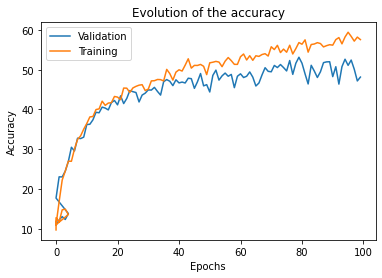

In [ ]:
import matplotlib.pyplot as plt
plt.plot(step_nums,vals,label='Validation') 
plt.plot(step_nums1,vals1, label='Training')
plt.xlabel('Epochs')
plt.legend()
plt.ylabel('Accuracy')
plt.title('Evolution of the accuracy')
plt.show()

In [ ]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
event_acc = EventAccumulator('/content/gdrive/MyDrive/Computer Vision/experiments/exp2/vit_resnet_pretrained')
event_acc.Reload()
# Show all tags in the log file
print(event_acc.Tags())

# E. g. get wall clock, number of steps and value for a scalar 'Accuracy'
w_times1, step_nums1, vals1 = zip(*event_acc.Scalars('train/Loss_epoch'))
w_times, step_nums, vals = zip(*event_acc.Scalars('validation/Loss_epoch'))

{'images': [], 'audio': [], 'histograms': [], 'scalars': ['train/Loss_epoch', 'train/Acc_epoch', 'validation/Loss_epoch', 'validation/Acc_epoch'], 'distributions': [], 'tensors': ['validation accuracy/text_summary'], 'graph': False, 'meta_graph': False, 'run_metadata': []}


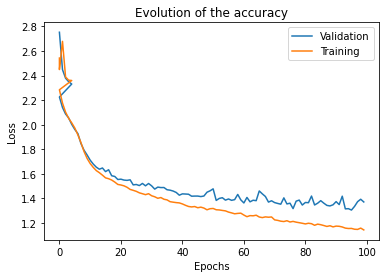

In [ ]:
import matplotlib.pyplot as plt
plt.plot(step_nums,vals,label='Validation') 
plt.plot(step_nums1,vals1, label='Training')
plt.xlabel('Epochs')
plt.legend()
plt.ylabel('Loss')
plt.title('Evolution of the accuracy')
plt.show()